In [1]:
# load packages and functions
suppressMessages(library(data.table))
suppressMessages(library(dplyr))
suppressMessages(library(ggplot2))
suppressMessages(library(ggpointdensity))
suppressMessages(library(ggrepel))
suppressMessages(library(ggsci))
suppressMessages(library(ggthemes))
suppressMessages(library(magrittr))
suppressMessages(library(patchwork))
suppressMessages(library(RColorBrewer))
suppressMessages(library(stringr))
suppressMessages(library(tidyverse))
suppressMessages(library(viridis))
suppressMessages(library(ComplexHeatmap))

selected_markers<- c('CD45',
                     'CD172ab',
                     'CD8a',
                     'CD20',
                     'CD4',
                     'CD3',
                     'CD56',
                     'Siglec-6',
                     'TLR4',
                     'CD36',
                     'CD64',
                     'CD163',
                     'CD74',
                     'CD86',
                     'CD1c',
                     'CD1d',
                     'CD11c',
                     'CD123',
                     'CD14',
                     'CD85d',
                     'CD15',
                     'Siglec-1',
                     'XCR1',
                     'CD16',
                     'CD39',
                     'TLR9',
                     'FPR1',
                     'CD303',
                     'MARCO',
                     'CCR2',
                     'CD141',
                     'CD38',
                     'CLEC9A',
                     'CD84',
                     'HO-1',
                     'CX3CR1',
                     'PD-L1',
                     'CD206',
                     'IRF8',
                     'CD170',
                     'Ki67',
                     'CD85i',
                     'CD68',
                     'CD180',
                     'HLA-DR',
                     'FOLR2',
                     'CD115',
                     'CD11b')

# set parameters
prop = 0.1
n_min = 10000
frac = 0.90
n_neighbors=30
min_dist=0.01
resolution_list=0.3

# cluster annotation
cluster_df = read.table("/projects/jinamo@xsede.org/cytof/data/cluster_annotation.txt",sep="\t",header=TRUE) %>%
    dplyr::filter(cell=="M") %>%
    dplyr::select(-cell) %>%
    dplyr::mutate(cluster = as.character(cluster))


In [2]:
exp_ds <- readRDS(file = "/projects/jinamo@xsede.org/cytof/data/myeloid/M_downsampled_Cells.rds")

`summarise()` has grouped output by 'subject_id__time'. You can override using
the `.groups` argument.


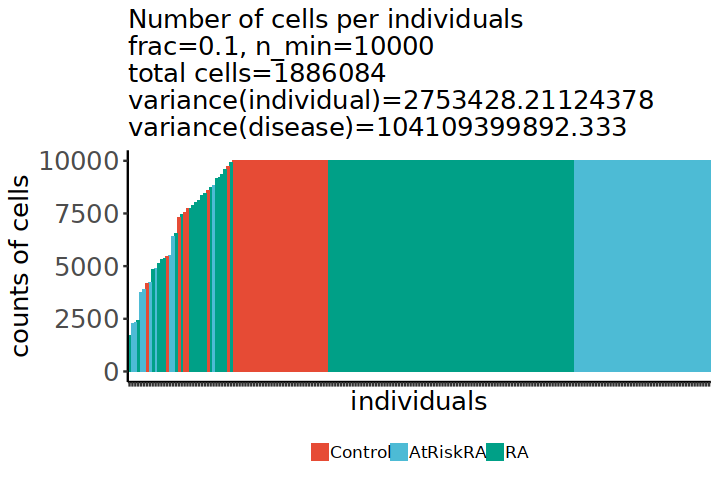

In [3]:
tmp = cbind(
  exp_ds %>%
    dplyr::group_by(subject_id__time) %>%
    dplyr::summarise(cell_counts = n()) %>%
    dplyr::summarise(Total_cell_count=sum(cell_counts), ind_variance=var(cell_counts)),
  exp_ds %>%
    dplyr::group_by(disease) %>%
    dplyr::summarise(cell_counts = n()) %>%
    dplyr::summarise(disease_variance=var(cell_counts))
)
options(repr.plot.height = 4, repr.plot.width = 6)
exp_ds %>%
       dplyr::group_by(subject_id__time, disease) %>%
       dplyr::summarise(cell_counts = n()) %>%
       dplyr::ungroup() %>%
       dplyr::arrange(desc(cell_counts)) %>%
       ggplot() + 
       geom_bar(aes(reorder(subject_id__time,cell_counts),cell_counts, fill = disease), stat = 'identity') + 
       theme_classic() +
       scale_fill_npg() +
       # facet_grid( ~ disease) + 
       theme(strip.text.x=element_text(size=15, color="black", face="bold"),
             strip.text.y=element_text(size=15, color="black", face="bold"),
             legend.position = "bottom",
             plot.title = element_text(size=15),
             axis.title.x = element_text(size=15),
             axis.title.y = element_text(size =15),
             axis.text.y = element_text(size = 15),
             axis.text.x = element_blank(),
             legend.text =  element_text(size = 10), 
             legend.key.size = grid::unit(0.8, "lines"),
             legend.title = element_text(size = 0, hjust = 0)) +
       labs(title = paste0("Number of cells per individuals\nfrac=", prop, ", n_min=",n_min, "\ntotal cells=", tmp$Total_cell_count, "\nvariance(individual)=",tmp$ind_variance,"\nvariance(disease)=",tmp$disease_variance),
            x = 'individuals',
            y = "counts of cells") 

In [4]:
exp_ds %>%
       dplyr::group_by(disease,time_point) %>%
       dplyr::summarise(cell_counts = n())

`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.


disease,time_point,cell_counts
<fct>,<chr>,<int>
Control,V0,380530
AtRiskRA,V0,512111
RA,V0,551186
RA,V1,227541
RA,V2,214716


In [5]:
pca_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/PCA_embeddings_Prop",prop,"_Nmin",n_min,"_topVar",frac,".rds"))
batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/meta_Prop",prop,"_Nmin",n_min,".rds"))

# check the data
print(dim(pca_res$x))
print(head(pca_res$x))
print(dim(batch_fl))
print(head(batch_fl))

[1] 1886084      20
           PC1        PC2        PC3        PC4        PC5         PC6
[1,] -4.890229  0.6085647 -1.4752157 -1.2707708  0.1215270  1.24137090
[2,] -3.900998 -0.8058931  0.4808233  0.9403133  0.2419094 -0.79056693
[3,]  6.468714 -4.5339185  1.7637256  0.9696482 -2.9451168  0.07795033
[4,] -4.674067  2.2449706  0.4186093  0.4017282 -0.6921120  2.50934275
[5,] -4.643622  1.6330049 -2.4618798  0.4424439 -1.1943336  1.64291898
[6,] -3.671453 -1.7059129  0.1117183  0.7283907  0.6472527  0.13367695
            PC7         PC8        PC9       PC10       PC11       PC12
[1,] -0.6266535  0.21005691  0.6867722  0.9636403 -1.3514772 -0.2592394
[2,] -1.0278487  0.49547825 -0.7419079  0.4447689 -0.2448855  0.8428696
[3,] -0.9374914 -2.37091372 -0.5705502 -0.4814442  0.1164050  0.1729816
[4,]  0.4223328  0.59969763  0.5116500  0.4835434 -0.2926453 -0.7702075
[5,] -0.2041608  0.02573947 -0.5460701  0.8735475  0.2922249 -0.6413119
[6,] -0.4288831  0.48040722  0.3040061 -0.1788654  

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


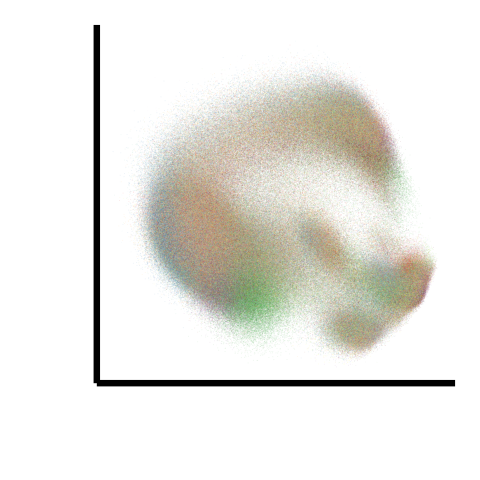

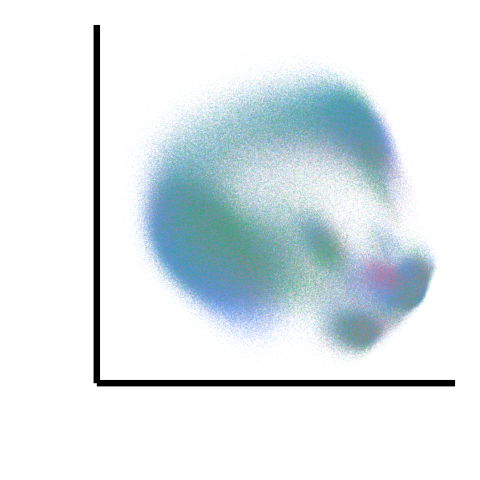

In [6]:

options(repr.plot.height = 4, repr.plot.width = 4)
set.seed(1234)
ggplot() +
    geom_point(
        data = data.frame(pca_res$x[,c("PC1","PC2")],batch_fl)[sample(1:nrow(pca_res$x)),],
        mapping = aes_string(x = "PC1", y = "PC2", color = "batch"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
   scale_color_manual(values = c(
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#E41A1C",
         "24" = "#377EB8")) +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

ggplot() +
    geom_point(
        data = data.frame(pca_res$x[,c("PC1","PC2")],batch_fl)[sample(1:nrow(pca_res$x)),],
        mapping = aes_string(x = "PC1", y = "PC2", color = "condition"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

In [8]:
harmony_embeddings_all <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/harmony_embeddings_Prop",prop,"_Nmin",n_min,"_topVar",frac,".rds"))
batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/meta_Prop",prop,"_Nmin",n_min,".rds"))

In [9]:
print(head(harmony_embeddings_all))
print(dim(harmony_embeddings_all))

           PC1         PC2         PC3        PC4        PC5        PC6
[1,] -4.417621  0.08804301 -1.54187125 -1.2055267  0.2441486  0.6821334
[2,] -3.339941 -1.38309453  0.38748938  0.8517246  0.4344374 -1.4981539
[3,]  6.635687 -3.85634782  1.58565728  0.6701822 -2.2548370 -0.1055146
[4,] -4.057264  2.41003683  0.23208417  0.4188058 -0.6259517  2.0164786
[5,] -4.151379  1.27342193 -2.62177398  0.5612001 -1.1510892  1.1404117
[6,] -3.105939 -2.30376978  0.03209943  0.6363093  0.8428549 -0.5755219
             PC7         PC8        PC9       PC10        PC11        PC12
[1,] -0.37358094  0.07131439  0.8408606  0.3558263 -1.21113635 -0.45155544
[2,] -0.81008616  0.44188239 -0.5732570 -0.1959647 -0.03711794  0.63887506
[3,] -0.68064346 -1.97195123 -0.4695707 -0.7803566  0.06253441  0.08809238
[4,]  0.67252192  0.47957101  0.8615479 -0.1420686 -0.32841816 -0.91171501
[5,]  0.09968242 -0.12308214 -0.3451919  0.2323329  0.39460759 -0.82605110
[6,] -0.22259445  0.42672586  0.4699377 -0.809

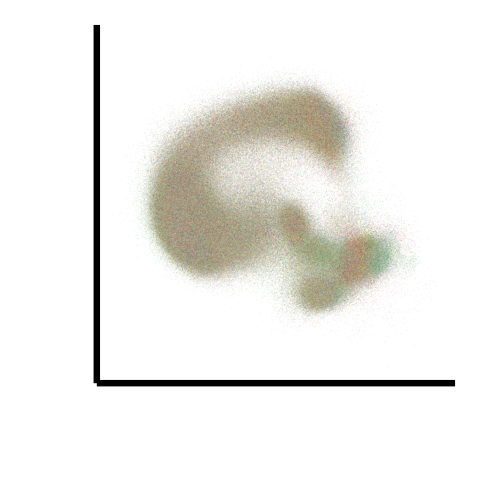

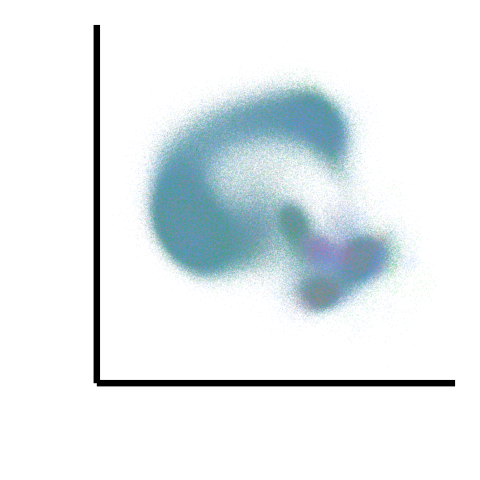

In [10]:

options(repr.plot.height = 4, repr.plot.width = 4)
set.seed(1234)
ggplot() +
    geom_point(
        data = data.frame(harmony_embeddings_all,batch_fl)[sample(1:nrow(harmony_embeddings_all)),],
        mapping = aes_string(x = "PC1", y = "PC2", color = "batch"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
   scale_color_manual(values = c(
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#E41A1C",
         "24" = "#377EB8")) +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

ggplot() +
    geom_point(
        data = data.frame(harmony_embeddings_all,batch_fl)[sample(1:nrow(harmony_embeddings_all)),],
        mapping = aes_string(x = "PC1", y = "PC2", color = "condition"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

`summarise()` has grouped output by 'key'. You can override using the `.groups`
argument.


key,group,median
<chr>,<chr>,<dbl>
Race,after,2.906370
Race,before,2.338270
Site,after,4.365395
Site,before,3.068382
batch,after,7.169429
batch,before,3.638435
condition,after,2.268627
condition,before,1.956629
individual,after,10.899155


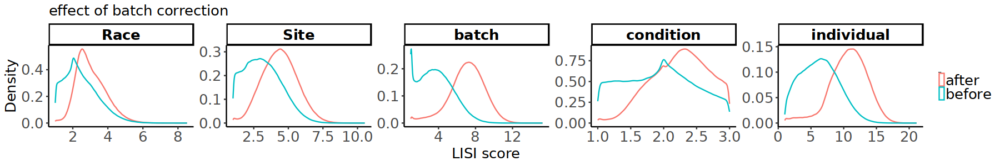

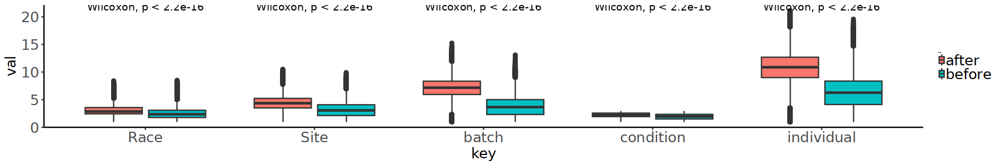

In [11]:
# using PC1-20
LISI_df = rbind(
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/LISI_harmony.rds")) %>%
        dplyr::mutate(group = "after"),
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/LISI_PCA.rds")) %>%
        dplyr::mutate(group = "before")
    ) %>%
    dplyr::mutate(key = ifelse(key=="OmiqFileIndex", "individual", key))


LISI_df %>%
    dplyr::group_by(key,group) %>%
    dplyr::summarize(median = median(val))

options(repr.plot.height = 2.5, repr.plot.width = 15)
ggplot(LISI_df) +
      geom_density(
        aes(x  = val, color = group) 
      ) +
      #   scale_x_continuous(limits = c(1, 15))+
      labs(
        title = "effect of batch correction",
        x = "LISI score",
        y = "Density"
      ) +
      facet_wrap( ~ key, scales = "free", ncol = 5) +
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

LISI_df %>% 
  ggplot(aes(x=key, y=val, fill=group)) +
  geom_boxplot() +
  ggpubr::stat_compare_means(method= "wilcox.test") +
  theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

`summarise()` has grouped output by 'key'. You can override using the `.groups`
argument.


key,group,median
<chr>,<chr>,<dbl>
Race,after,3.191725
Race,before,3.148598
Site,after,5.217769
Site,before,5.002394
batch,after,9.676909
batch,before,8.521876
condition,after,2.406815
condition,before,2.395428
individual,after,16.147986


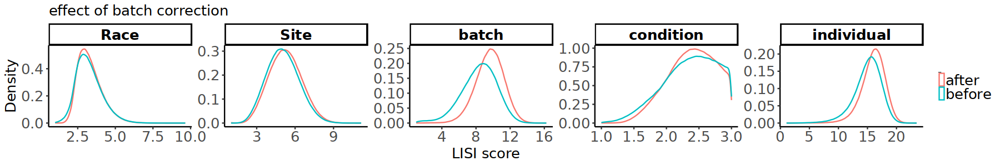

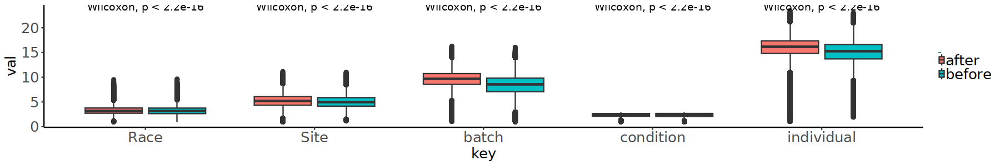

In [12]:
# using PC1-2
LISI_df = rbind(
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/LISI_harmony_PC12.rds")) %>%
        dplyr::mutate(group = "after"),
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/LISI_PCA_PC12.rds")) %>%
        dplyr::mutate(group = "before")
    ) %>%
    dplyr::mutate(key = ifelse(key=="OmiqFileIndex", "individual", key))

LISI_df %>%
    dplyr::group_by(key,group) %>%
    dplyr::summarize(median = median(val))

options(repr.plot.height = 2.5, repr.plot.width = 15)
ggplot(LISI_df) +
      geom_density(
        aes(x  = val, color = group) 
      ) +
      #   scale_x_continuous(limits = c(1, 15))+
      labs(
        title = "effect of batch correction",
        x = "LISI score",
        y = "Density"
      ) +
      facet_wrap( ~ key, scales = "free", ncol = 5) +
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

LISI_df %>% 
  ggplot(aes(x=key, y=val, fill=group)) +
  geom_boxplot() +
  ggpubr::stat_compare_means(method= "wilcox.test") +
  theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

In [13]:

umap_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/umap_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
print(table(umap_res$res_cell))
umap_res$res_cell = factor(umap_res$res_cell, levels=sort(as.integer(unique(umap_res$res_cell))))
umap_res$res_cell


     0      1     10    100    101    102    103    104    105    106    107 
576575 524177  37780      1      1      1      1      1      1      1      1 
   108    109     11    110    111    112    113    114    115    116    117 
     1      1  12837      1      1      1      1      1      1      1      1 
   118    119     12    120    121    122    123    124    125    126    127 
     1      1   8559      1      1      1      1      1      1      1      1 
   128    129     13    130    131    132    133    134    135    136    137 
     1      1   7476      1      1      1      1      1      1      1      1 
   138    139     14    140    141    142    143    144    145    146    147 
     1      1   6288      1      1      1      1      1      1      1      1 
   148    149     15    150    151    152    153    154    155    156    157 
     1      1   3246      1      1      1      1      1      1      1      1 
   158    159     16    160    161    162    163    164    165 

[1] 0  1  5  0  0  1  4  1  1  1  1  8  0  5  0  5  0  1  5  0  5  0  1  2 
   [25] 1  1  0  5  0  0  0  0  0  1  0  1  1  4  2  1  0  0  5  0  0  0  8  0 
   [49] 0  2  0  0  0  1  0  0  1  1  0  1  5  12 0  5  1  1  0  0  1  0  6  0 
   [73] 1  1  1  5  0  1  0  0  0  1  0  1  1  0  0  1  2  4  5  0  0  5  0  5 
   [97] 1  2  5  1  0  1  0  1  0  1  0  0  7  4  1  0  1  0  1  0  4  0  0  5 
  [121] 0  4  2  0  0  1  5  5  4  5  12 0  0  2  0  1  9  0  5  0  5  1  0  5 
  [145] 0  0  7  2  12 0  0  1  0  0  1  0  0  0  0  12 0  0  1  12 0  1  1  2 
  [169] 0  1  10 0  1  2  4  7  0  0  1  1  0  2  1  1  7  0  6  10 0  0  0  0 
  [193] 6  0  5  1  0  2  0  0  1  8  12 0  4  0  0  0  1  2  1  5  1  0  0  0 
  [217] 0  0  7  12 8  1  10 0  9  1  8  0  2  1  12 0  9  0  1  5  0  0  0  1 
  [241] 0  0  4  10 5  1  0  1  1  0  0  0  0  0  6  2  1  1  5  1  7  0  5  12
  [265] 0  4  1  1  5  1  7  1  1  0  0  5  0  6  2  0  0  2  1  2  0  0  12 5 
  [289] 1  0  0  0  1  1  10 0  5  5  1  0  0  0  0  0  1  0  0  0  0  1  10 0 
  [313] 10 5  0  0  0  9  0  5  1  1  0  0  0  0  1  2  1  1  0  0  0  0  2  0 
  [337] 0  0  7  6  2  0  0  5  0  1  1  1  8  1  12 4  0  1  0  4  0  6  0  1 
  [361] 5  0  1  0  1  0  0  1  1  1  1  1  2  1  2  0  2  4  5  6  0  6  1  5 
  [385] 4  4  4  0  5  1  10 0  0  0  1  1  8  0  1  1  1  1  1  1  0  1  4  2 
  [409] 1  0  5  4  2  1  6  0  1  0  0  0  0  4  4  0  0  1  0  1  0  5  1  0 
  [433] 0  5  1  1  1  0  6  5  8  0  0  1  0  0  12 0  6  0  1  0  0  0  5  1 
  [457] 0  10 6  0  1  0  0  0  1  6  1  0  0  7  0  0  0  6  0  7  0  1  0  0 
  [481] 7  10 1  0  0  1  12 0  6  5  4  2  1  0  1  0  1  0  5  12 5  0  1  0 
  [505] 0  1  12 1  0  0  5  8  0  1  1  1  0  0  0  0  0  1  0  1  2  0  12 0 
  [529] 1  12 6  8  0  1  1  0  0  0  0  4  0  5  0  1  0  5  1  4  0  0  0  5 
  [553] 1  4  5  5  9  5  0  2  0  1  9  0  1  7  0  0  1  0  1  6  0  1  4  1 
  [577] 1  5  0  2  0  2  10 5  0  1  5  1  0  4  5  0  2  7  1  2  0  0  2  1 
  [601] 1  0  1  2  1  1  8  0  1  2  1  0  0  1  5  0  6  0  1  1  0  0  5  2 
  [625] 1  9  0  0  0  2  0  1  5  4  10 7  12 12 5  0  1  1  1  0  7  1  0  9 
  [649] 5  6  4  0  1  0  0  0  0  5  1  10 0  10 1  5  0  1  0  0  2  0  2  1 
  [673] 0  5  1  0  0  0  0  1  0  0  0  0  1  1  0  2  0  5  0  1  0  1  5  4 
  [697] 0  0  0  6  0  0  0  6  0  4  12 4  0  0  15 1  0  5  1  0  0  2  2  0 
  [721] 4  5  0  1  0  6  0  2  1  5  5  0  1  0  0  10 0  0  7  1  0  1  7  0 
  [745] 1  2  0  0  4  5  1  0  2  12 1  0  0  1  0  7  0  0  0  7  0  0  0  1 
  [769] 0  5  5  8  10 1  1  0  0  0  0  6  0  0  1  0  0  1  2  1  4  1  4  0 
  [793] 3  4  12 0  1  1  1  2  9  7  0  0  1  0  1  1  0  1  4  0  0  0  1  0 
  [817] 1  1  0  12 1  0  1  0  0  0  5  0  0  12 5  1  10 1  0  1  1  10 0  0 
  [841] 10 1  5  6  0  0  1  5  0  0  1  1  0  1  4  1  1  0  1  0  0  0  0  1 
  [865] 1  0  0  0  0  0  6  7  4  0  1  0  1  2  1  0  0  0  5  5  2  0  0  1 
  [889] 6  5  0  4  1  2  12 1  0  4  1  0  3  1  10 0  0  12 4  2  0  0  1  4 
  [913] 1  1  0  0  5  6  2  1  0  0  0  0  0  5  5  0  6  0  1  0  6  2  1  1 
  [937] 5  0  0  1  1  0  1  1  1  0  4  5  5  0  2  5  0  0  1  0  2  0  1  1 
  [961] 0  1  0  0  9  1  0  0  0  12 0  1  6  0  1  0  0  0  0  4  1  0  0  0 
  [985] 0  0  0  7  4  0  1  1  12 0  7  6  1  1  5  0  0  1  0  1  0  1  12 0 
 [1009] 1  0  0  0  5  5  0  0  8  1  7  0  1  2  1  0  0  13 6  8  0  2  0  0 
 [1033] 1  6  5  2  2  0  1  0  1  6  0  1  5  0  0  1  1  0  0  1  1  1  1  0 
 [1057] 0  10 0  7  1  0  0  1  0  1  0  1  1  0  0  0  0  1  9  1  2  2  0  0 
 [1081] 8  0  1  0  0  12 1  4  1  6  1  0  2  5  0  10 10 8  0  12 6  5  1  0 
 [1105] 6  1  0  0  0  0  1  1  1  0  0  1  8  1  5  12 1  12 1  0  0  8  1  5 
 [1129] 0  1  5  11 0  0  0  0  0  7  1  0  12 1  0  2  0  0  6  0  1  4  12 0 
 [1153] 0  4  0  1  0  1  0  1  0  0  0  1  7  0  4  0  4  4  1  0  2  0  6  6 
 [1177] 12 4  4  4  1  0  0  1  0  0  0  1  5  1  1  0  2  0  0  12 0  7  0  0 
 [12

In [14]:
# remove clusters less than cut off
min_cell_cluster = 30
clu = umap_res %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::arrange(count) %>%
    dplyr::filter(count > min_cell_cluster) %>%
    .$res_cell %>%
    unique()
clu_logi = umap_res$res_cell %in% clu
print(dim(umap_res[clu_logi,]))
print(table(umap_res[clu_logi,]$res_cell))
print(length(unique(umap_res[clu_logi,]$res_cell)))
umap_res = umap_res[clu_logi,]
print(dim(umap_res))


[1] 1885837       5

     0      1      2      3      4      5      6      7      8      9     10 
576575 524177 238284 112747 112100  64295  63178  40786  39297  38212  37780 
    11     12     13     14     15     16     17     18     19     20     21 
 12837   8559   7476   6288   3246      0      0      0      0      0      0 
    22     23     24     25     26     27     28     29     30     31     32 
     0      0      0      0      0      0      0      0      0      0      0 
    33     34     35     36     37     38     39     40     41     42     43 
     0      0      0      0      0      0      0      0      0      0      0 
    44     45     46     47     48     49     50     51     52     53     54 
     0      0      0      0      0      0      0      0      0      0      0 
    55     56     57     58     59     60     61     62     63     64     65 
     0      0      0      0      0      0      0      0      0      0      0 
    66     67     68     69     70     71  

In [15]:
# Find cluster center
cluster_center <- umap_res %>%
  dplyr::group_by(res_cell) %>%
  dplyr::summarise_at(vars(UMAP1, UMAP2), dplyr::funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)
cluster_center$res_cell <- as.character(cluster_center$res_cell)

Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
ℹ Please use a list of either functions or lambdas:

# Simple named list: list(mean = mean, median = median)

# Auto named with `tibble::lst()`: tibble::lst(mean, median)

# Using lambdas list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))”


In [16]:
# meta data

batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/meta_Prop",prop,"_Nmin",n_min,".rds"))
batch_fl$subject_id <- stringr::str_split(batch_fl$OmiqFileIndex, pattern="_", simplify=TRUE)[,3] %>% 
  stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
  as.data.frame() %>%
  .[,1] %>%
  gsub("-","_",.)
batch_fl = batch_fl[clu_logi,]
umap_res$subject_id = batch_fl$subject_id
umap_res$time_point = batch_fl$time_point

meta<- read.table("/projects/jinamo@xsede.org/cytof/data/RA_AtRiskRA_Control_meta.txt",sep="\t",header=TRUE, na.strings=c("","NA")) %>%
    dplyr::mutate(age_at_biopsy = as.integer(age_at_biopsy),
                  diagnosis = factor(diagnosis, levels=c("Control","AtRiskRA","RA")))
meta = merge(umap_res,meta,by="subject_id")
meta = meta[order(match(meta$subject_id, umap_res$subject_id)),]
all(meta$subject_id == umap_res$subject_id)

meta_add = read.table("/projects/jinamo@xsede.org/cytof/data/meta_clinical_RA.txt", header = TRUE, sep = "\t") %>%
  dplyr::mutate(CDAI = as.numeric(CDAI),
                subject_id = gsub("-","_",subject_id),
                treatment = dplyr::case_when(
                  treatment == "1" ~ "naive",
                  treatment == "2" ~ "MTX failure",
                  treatment == "3" ~ "TNF failure",
                  treatment == "4" ~ "OA"
                )) %>%
  dplyr::select(-c(sex))
meta_add = dplyr::left_join(umap_res,meta_add,by="subject_id")

meta_total = read.csv("/projects/jinamo@xsede.org/cytof/data/Total_Metadata.csv") %>%
    dplyr::mutate(subject_id = gsub("-","_",Patient)) %>%
    dplyr::distinct(subject_id,Site,Race)
meta_total = meta_total[!(is.na(meta_total$Race) | meta_total$Race==""), ]
meta_total = merge(umap_res,meta_total,by="subject_id")
meta_total = meta_total[order(match(meta_total$subject_id, umap_res$subject_id)),]
all(meta_total$subject_id == umap_res$subject_id)

umap_res$AtRisk = dplyr::case_when(
  meta$AMP_Group == "FDR" & meta$CCP == "Positive" ~ "FDR(+)/ACPA(+)",
  meta$AMP_Group == "GP" & meta$CCP == "Positive" ~ "FDR(-)/ACPA(+)",
  meta$AMP_Group == "FDR" & meta$CCP == "Negative" ~ "FDR(+)/ACPA(-)",
  meta$AMP_Group == "GP" & meta$CCP == "Negative" ~ "FDR(-)/ACPA(-)",
  umap_res$disease == "Control" ~ "Control",
  umap_res$disease == "RA" ~ "RA")
umap_res$AtRisk = factor(umap_res$AtRisk,levels=c("Control","FDR(-)/ACPA(-)","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA"))
umap_res$disease = dplyr::case_when(
  umap_res$AtRisk == "FDR(+)/ACPA(+)" | umap_res$AtRisk == "FDR(-)/ACPA(+)" | umap_res$AtRisk == "FDR(+)/ACPA(-)" ~ "AtRiskRA",
  umap_res$AtRisk == "Control" | umap_res$AtRisk == "FDR(-)/ACPA(-)" ~ "Control",
  umap_res$AtRisk == "RA" ~ "RA")
umap_res$disease = factor(umap_res$disease,levels=c("Control","AtRiskRA","RA"))
umap_res$age_at_biopsy <- as.numeric(meta$age_at_biopsy)
umap_res$sex <- as.numeric(factor(meta$sex, c('female', 'male')))
umap_res$ethnicity <- as.numeric(factor(meta$ethnicity, c('not_hispanic', 'hispanic_latino')))
umap_res$AMP_Group <- as.numeric(factor(meta$AMP_Group, c('GP', 'FDR')))
umap_res$CCP <- dplyr::case_when(
    meta$CCP == 'Negative' ~ "at-risk CCP(-)", 
    meta$CCP == 'Positive' ~ "at-risk CCP(+)",
    umap_res$AtRisk == "Control" ~ "Control")
umap_res$CCP <- factor(umap_res$CCP,levels=c("Control","at-risk CCP(-)","at-risk CCP(+)"))
umap_res$CCP30_titer <- as.numeric(meta$CCP30_titer)
umap_res$CCP31_titer <- as.numeric(meta$CCP31_titer)
umap_res$RF <- as.numeric(factor(meta$RF, c('Negative', 'Positive')))
umap_res$RF_IgM_titer <- as.numeric(meta$RF_IgM_titer)
umap_res$RF_IgG_titer <- as.numeric(meta$RF_IgG_titer)
umap_res$RF_IgA_titer <- as.numeric(meta$RF_IgA_titer)
umap_res$Site = meta_total$Site
umap_res$Race = meta_total$Race

head(umap_res)
table(umap_res$time_point)
table(umap_res$AtRisk)
table(umap_res$disease)

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”


[1] TRUE

[1] TRUE

,UMAP1,UMAP2,disease,batch,res_cell,subject_id,time_point,AtRisk,age_at_biopsy,sex,...,AMP_Group,CCP,CCP30_titer,CCP31_titer,RF,RF_IgM_titer,RF_IgG_titer,RF_IgA_titer,Site,Race
,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>,<chr>,<fct>,<dbl>,<dbl>,...,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,2.0532372,0.7853604,Control,15,0,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
2,-0.3599584,-1.2624608,Control,15,1,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
3,-4.5085528,-14.3289069,Control,15,5,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
4,-0.6125778,3.6431667,Control,15,0,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
5,1.3293630,2.2799052,Control,15,0,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
6,-0.2884055,-1.4845810,Control,15,1,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]



     V0      V1      V2 
1443641  227510  214686 


       Control FDR(-)/ACPA(-) FDR(+)/ACPA(-) FDR(-)/ACPA(+) FDR(+)/ACPA(+) 
        380492          61903         191371          66455         192313 
            RA 
        993303 


 Control AtRiskRA       RA 
  442395   450139   993303 

In [17]:
get_density <- function(x, y, ...) {
  dens <- MASS::kde2d(x, y, ...)
  ix <- findInterval(x, dens$x)
  iy <- findInterval(y, dens$y)
  ii <- cbind(ix, iy)
  return(dens$z[ii])
}

umap_res = umap_res %>%
    dplyr::group_by(disease) %>%
    dplyr::mutate(density_disease = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(batch) %>%
    dplyr::mutate(density_batch = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(res_cell) %>%
    dplyr::mutate(density_cluster = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(AtRisk) %>%
    dplyr::mutate(density_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(time_point,AtRisk) %>%
    dplyr::mutate(density_time_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(CCP) %>%
    dplyr::mutate(density_AtRiskCCP = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Site,AtRisk) %>%
    dplyr::mutate(density_site_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Site,disease) %>%
    dplyr::mutate(density_site_condition = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Race,AtRisk) %>%
    dplyr::mutate(density_race_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup()

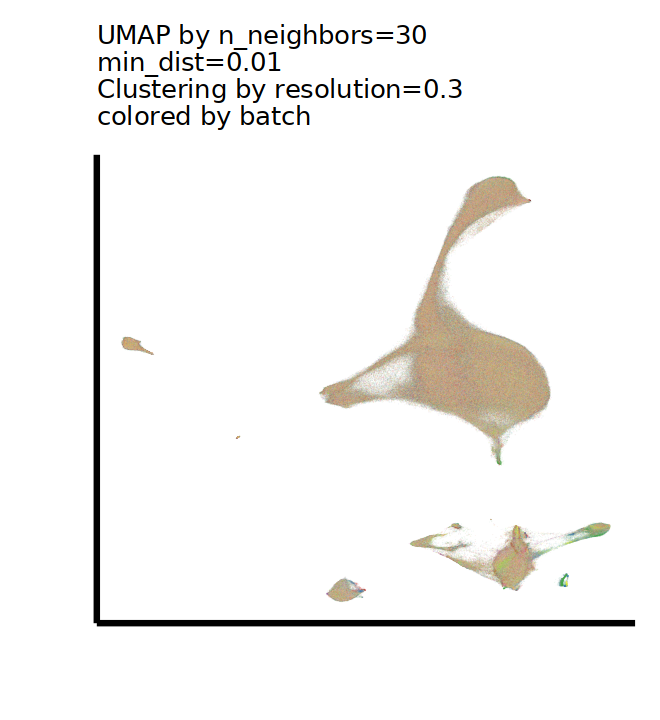

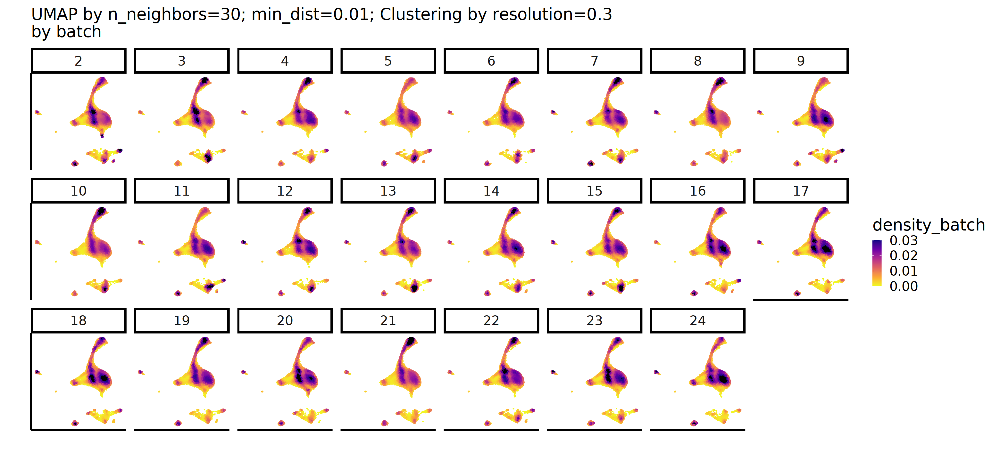

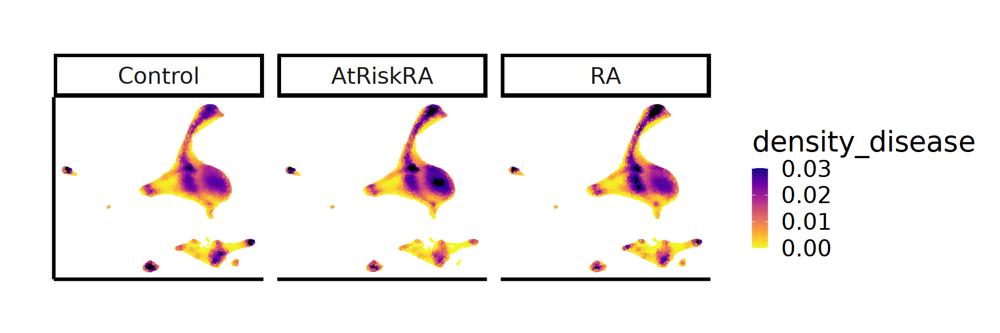

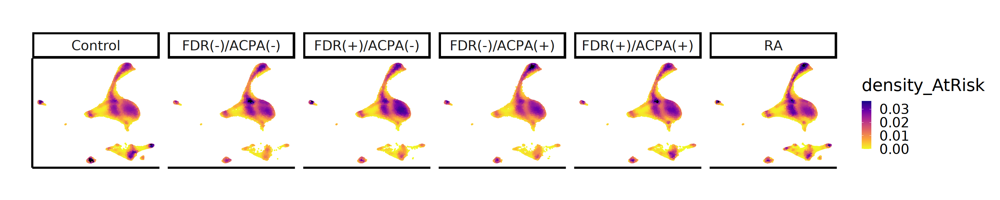

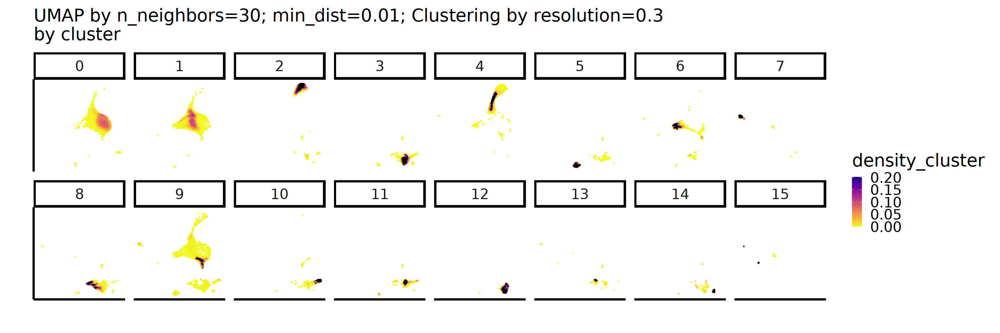

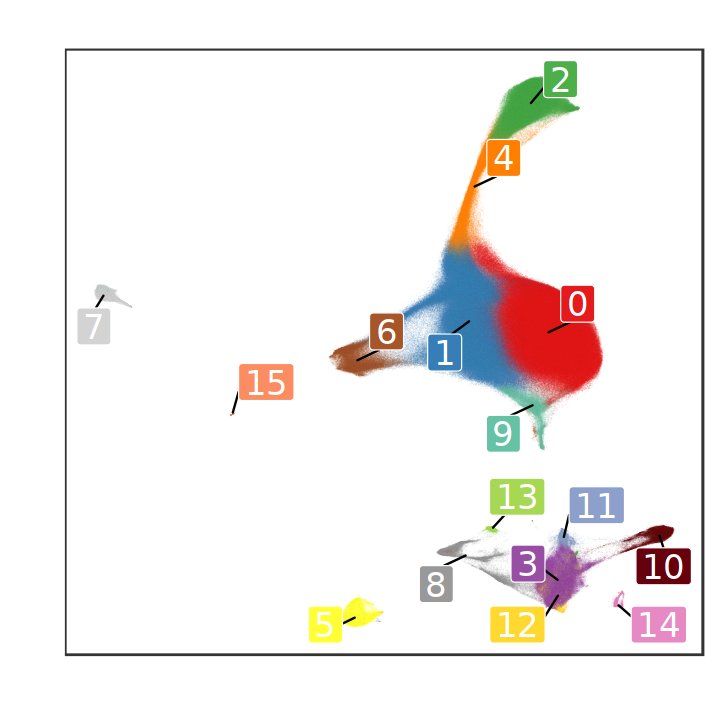

In [18]:

options(repr.plot.height = 6, repr.plot.width = 5.5)
plot(ggplot() +
       geom_point(
         data = umap_res,
         mapping = aes_string(x = "UMAP1", y = "UMAP2", color = "batch"),
         size = 0.01, stroke = 0, shape = 16, alpha = 0.1
       ) +
       scale_color_manual(values = c(
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#E41A1C",
         "24" = "#377EB8")) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"\nmin_dist=",min_dist,"\nClustering by resolution=",resolution_list,"\ncolored by batch"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=15, face = "italic")
       )
)

options(repr.plot.height = 12, repr.plot.width = 26)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/myeloid/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_batch),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_batch, probs = seq(0, 1, 0.1))["90%"])) +
       facet_wrap( ~ batch, ncol = 8) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"; min_dist=",min_dist,"; Clustering by resolution=",resolution_list,"\nby batch"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)
# dev.off()

options(repr.plot.height = 5, repr.plot.width = 15)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/myeloid/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_disease),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_disease, probs = seq(0, 1, 0.1))["90%"])) +
       facet_wrap( ~ disease, ncol = 3) +
       labs(
         title = "",
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 5, repr.plot.width = 25)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_AtRisk),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_AtRisk, probs = seq(0, 1, 0.01))["98%"])) +
       facet_wrap( ~ AtRisk, ncol = 6) +
       labs(
         title = "",
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 8, repr.plot.width = 24)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/myeloid/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_cluster),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_cluster, probs = seq(0, 1, 0.1))["70%"])) +
       facet_wrap( ~ res_cell, ncol = 8) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"; min_dist=",min_dist,"; Clustering by resolution=",resolution_list,"\nby cluster"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 6, repr.plot.width = 6)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_cluster.png"), width = 1400, height = 1400,res=360)
plot(ggplot() +
       geom_point(
         data = umap_res %>% dplyr::mutate(res_cell = factor(res_cell,levels=cluster_df$cluster)),
         mapping = aes_string(x = "UMAP1", y = "UMAP2", color = "res_cell"),
         size = 0.01, stroke = 0, shape = 16, alpha = 0.1
       ) +
       geom_label_repel(
         data = cluster_center,
         aes(x = UMAP1, y = UMAP2, label = res_cell, fill = res_cell),
         color = "white",segment.color = "black",
           size = 7,
         min.segment.length = 0, seed = 42, box.padding = 0.5
       ) +
       scale_color_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       scale_fill_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       labs(
         x = "",
         y = "",
         title = ""
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=10)
       ) 
)
# dev.off()



In [19]:
exprs_norm <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/arcsinh_transformed_transposed_Prop",prop,"_Nmin",n_min,".rds"))
exprs_norm = exprs_norm[, clu_logi]
print(dim(exprs_norm))

[1]      48 1885837


In [20]:
clu_marker <- presto::wilcoxauc(exprs_norm, umap_res$res_cell)
x <- clu_marker %>%
  dplyr::group_by(group) %>%
  dplyr::top_n(3, wt = logFC) 
x
# x[order(x$cluster, decreasing = FALSE),]


## parameter	description
## feature	name of feature.
## group	name of group label.
## avgExpr	mean value of feature in group.
## logFC	log fold change between observations in group vs out.
## statistic	Wilcoxon rank sum U statistic.
## auc	area under the receiver operator curve.
## pval	nominal p value, from two-tailed Gaussian approximation of U statistic.
## padj	Benjamini-Hochberg adjusted p value.
## pct_in	Percent of observations in the group with non-zero feature value.
## pct_out	Percent of observations out of the group with non-zero feature value.

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD14,0,3.3687569,1.70095262,593308065432,0.7859554,0.000000e+00,0.000000e+00,100,100
CD15,0,2.6684022,2.15217797,705794440770,0.9349661,0.000000e+00,0.000000e+00,100,100
CCR2,0,4.4284779,1.65023690,511071884395,0.6770171,0.000000e+00,0.000000e+00,100,100
CD36,1,4.0814211,1.69567477,564829665850,0.7913541,0.000000e+00,0.000000e+00,100,100
CD14,1,3.3191002,1.56672611,543511836404,0.7614868,0.000000e+00,0.000000e+00,100,100
CCR2,1,4.8131411,2.11947525,599287540896,0.8396313,0.000000e+00,0.000000e+00,100,100
CD85d,2,3.2307929,1.68144186,356380927486,0.9077791,0.000000e+00,0.000000e+00,100,100
HO-1,2,4.1839839,2.94048641,377824908382,0.9624015,0.000000e+00,0.000000e+00,100,100
CD85i,2,3.1959769,1.78548308,334473052804,0.8519750,0.000000e+00,0.000000e+00,100,100


In [21]:
## Heatmap of marker genes
# marker_plot <- unique(x$feature)
marker_plot <- unique(clu_marker$feature)

exp_heat <- exprs_norm[marker_plot,]
exp_heat <- t(exp_heat)
exp_heat <- as.data.frame(exp_heat)
exp_heat$res_cell <- as.character(umap_res$res_cell)

exp_ave <- aggregate(exp_heat[, 1:(ncol(exp_heat)-1)], list(exp_heat$res_cell), mean)
colnames(exp_ave)[1] <- "res_cell"
exp_ave <- as.data.frame(t(exp_ave))
colnames(exp_ave) <- as.character(t(exp_ave[1,]))
exp_ave <- exp_ave[-1,]
row_names <- rownames(exp_ave)
exp_ave <- mutate_all(exp_ave, function(x) as.numeric(as.character(x)))
rownames(exp_ave) <- row_names 
colnames(exp_ave) = paste0("M-",
                           cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[colnames(exp_ave),] %>%
    .$cluster,
                           ":",
                           cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[colnames(exp_ave),] %>%
    .$clu_name)                
head(exp_ave)
dim(exp_ave)     
                      
# Overwrite default draw_colnames in the pheatmap package.
# Thanks to Josh O'Brien at http://stackoverflow.com/questions/15505607
draw_colnames_45 <- function (coln, gaps, ...) {
  coord <- pheatmap:::find_coordinates(length(coln), gaps)
  x     <- coord$coord - 0.5 * coord$size
  res   <- grid::textGrob(
    coln, x = x, y = unit(1, "npc") - unit(3,"bigpts"),
    vjust = 0.75, hjust = 1, rot = 45, gp = grid::gpar(...)
  )
  return(res)
}
assignInNamespace(
  x = "draw_colnames",
  value = "draw_colnames_45",
  ns = asNamespace("pheatmap")
)
exp_ave <- as.matrix(exp_ave)
mat_breaks <- seq(min(exp_ave), max(exp_ave), length.out = 10)
quantile_breaks <- function(xs, n = 10) {
  breaks <- quantile(xs, probs = seq(0, 1, length.out = n))
  breaks[!duplicated(breaks)]
}

mat_breaks <- quantile_breaks(exp_ave, n = 20)
scale_rows <- function(x) t(scale(t(x)))
exp_ave_scale <- scale_rows(exp_ave) # Z-score
exp_ave_scale<- na.omit(exp_ave_scale)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 10)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 6)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
exp_ave_scale[exp_ave_scale > 2] <- 2
exp_ave_scale[exp_ave_scale < -2] <- -2
head(exp_ave_scale)
dim(exp_ave_scale)

,M-0:CD15+ cM,M-1:cM,M-10:Neutrophil,M-11:CCR2dimCD84dim,M-12:IRF8+CD38+ ncM,M-13:CD180+TLR9+HLADR+IRF8+ B-like,M-14:CD68dimCD38+ ncM,M-15:CD141+CLEC9A+ cDC (cDC1),M-2:ncM,M-3:CD38+ ncM,M-4:CD14dimCX3CR1+CD123+CCR2dimCD86+ cM,M-5:Basophil,M-6:CD1c+FCGR1(CD64)+CX3CR1+ cDC (cDC2),M-7:pDC,M-8:Ki67+ proliferating,M-9:CD14dimCD84dim cM
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD45,2.08691900,2.19592400,1.05035600,1.91060500,2.39867300,1.81124900,2.06754700,1.66150200,2.67156600,1.67315500,2.81997700,1.16593500,1.70277100,1.48210500,1.68174900,1.28407000
CD172ab,2.71255850,2.64455872,0.98033370,0.07354231,0.09508985,0.07913983,0.10965178,0.14212365,1.51044750,0.11629757,2.14983658,0.27530321,1.42762045,0.72564445,0.11275615,1.26449275
CD8a,0.09525763,0.09449549,0.07675603,0.19948985,0.12367974,0.04517479,0.15732518,0.05675207,0.06564752,0.09483430,0.08527821,0.04762816,0.07221363,0.06248702,0.07070310,0.07223261
CD20,0.04321660,0.04010575,0.04304809,0.04291112,0.02785862,0.70260555,0.02962618,0.03452589,0.02962248,0.02599617,0.04022549,0.02482626,0.03522041,0.02980465,0.06477871,0.03028284
CD4,0.45585561,0.49590991,0.06775634,0.76058929,0.05245682,0.04582122,0.12160912,0.52683095,0.41244851,0.04187887,0.55616418,0.02657144,0.65568138,1.30137110,0.04031710,0.18046580
CD3,0.04280652,0.03961132,0.04326853,0.17916542,0.03768075,0.03611819,0.05147159,0.03674648,0.03104040,0.03848638,0.03535442,0.03997185,0.04420576,0.03121837,0.03995881,0.03517433


[1] 48 16

,M-0:CD15+ cM,M-1:cM,M-10:Neutrophil,M-11:CCR2dimCD84dim,M-12:IRF8+CD38+ ncM,M-13:CD180+TLR9+HLADR+IRF8+ B-like,M-14:CD68dimCD38+ ncM,M-15:CD141+CLEC9A+ cDC (cDC1),M-2:ncM,M-3:CD38+ ncM,M-4:CD14dimCX3CR1+CD123+CCR2dimCD86+ cM,M-5:Basophil,M-6:CD1c+FCGR1(CD64)+CX3CR1+ cDC (cDC2),M-7:pDC,M-8:Ki67+ proliferating,M-9:CD14dimCD84dim cM
CD45,0.4612539,0.6771246,-1.59152826,0.1120863,1.0786434,-0.08467571,0.4228901,-0.3812307,1.6190735,-0.3581534,1.9129828,-1.3626386,-0.29950270,-0.7365039,-0.34113411,-1.1286872
CD172ab,1.9065324,1.8349593,0.08327922,-0.8711641,-0.8484842,-0.86527239,-0.8331570,-0.7989788,0.6412505,-0.8261620,1.3142395,-0.6588006,0.55407088,-0.1847940,-0.82988953,0.3823708
CD8a,0.1589537,0.1403458,-0.29276776,2.0000000,0.8528869,-1.06383202,1.6743492,-0.7811697,-0.5639849,0.1486179,-0.0846965,-1.0039323,-0.40367165,-0.6411494,-0.44055163,-0.4032082
CD20,-0.2071451,-0.2257831,-0.20815465,-0.2089753,-0.2991593,2.00000000,-0.2885693,-0.2592137,-0.2885915,-0.3103178,-0.2250657,-0.3173270,-0.25505260,-0.2875000,-0.07796005,-0.2846350
CD4,0.2716041,0.3837605,-0.81511670,1.1248920,-0.8579570,-0.87653745,-0.6643230,0.4703429,0.1500594,-0.8875765,0.5524791,-0.9304390,0.83113827,2.0000000,-0.89194960,-0.4995178
CD3,-0.1364677,-0.2266348,-0.12342997,2.0000000,-0.2811147,-0.32520945,0.1080568,-0.3074794,-0.4685025,-0.2583802,-0.3467627,-0.2164608,-0.09698175,-0.4634802,-0.21682883,-0.3518448


[1] 48 16

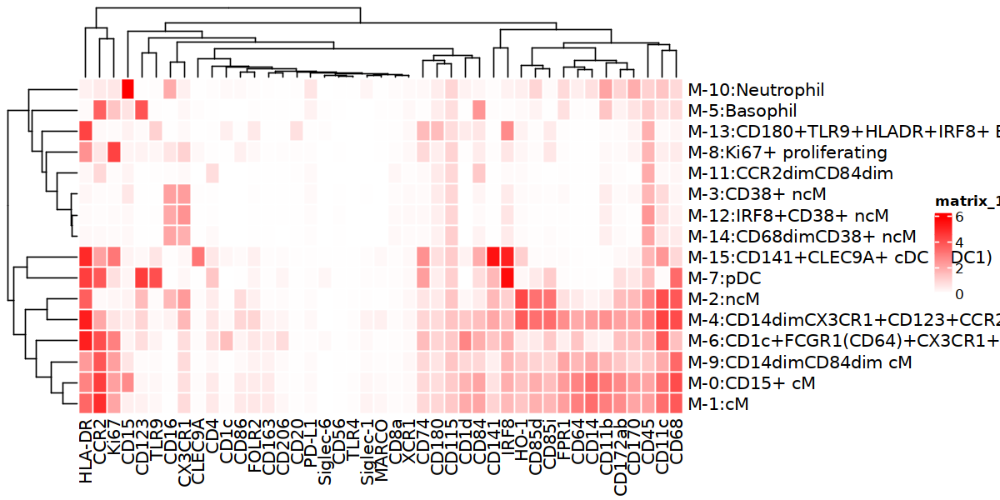

In [22]:

options(repr.plot.height = 5, repr.plot.width = 10)
plot(
    pheatmap(
      mat = t(exp_ave[!grepl("CD3",rownames(exp_ave)),]),
      border_color = "white",
      #breaks  = mat_breaks,
      #color  =inferno(length(mat_breaks) - 1),
      color= colorRampPalette(c("white", "red"))(length(mat_breaks)),
      show_rownames = TRUE,
      show_colnames = TRUE,
      cluster_rows = TRUE,
      cluster_cols = TRUE,
      # cutree_rows = 5,
      # cutree_cols = 3,
      #   annotation_col = annotation_col,
      #   annotation_colors = meta_colors,
      fontsize = 12,
      fontsize_row = 12,
      scale = "none"
    )
)


In [23]:
ph_markers_data_arcsinh = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/arcsinh_transformed_Prop",prop,"_Nmin",n_min,".rds"))
ph_markers_data_arcsinh = ph_markers_data_arcsinh[clu_logi,]
dim(ph_markers_data_arcsinh)
head(ph_markers_data_arcsinh)


[1] 1885837      48

CD45,CD172ab,CD8a,CD20,CD4,CD3,CD56,Siglec-6,TLR4,CD36,...,IRF8,CD170,Ki67,CD85i,CD68,CD180,HLA-DR,FOLR2,CD115,CD11b
2.0424655,2.73722548,-0.0013155742,3.450621e-02,0.706904209,0.0008946370,0.0148096386,0.0010540545,0.0022084177,4.84401727,...,2.2771791,1.560699646,1.953907405,2.9813891370,4.2361914,-0.0013356718,4.316022e+00,1.1208837992,0.3396514,3.505202
0.7306361,3.41164590,-0.0001450055,2.889165e-01,-0.002592099,0.0013466921,0.0002033720,-0.0005960816,-0.0001061060,3.98841828,...,2.1397075,2.015423204,2.744952981,2.0648168103,4.2305993,0.8319359289,3.437094e+00,1.4121174719,0.9986156,3.297781
0.9488561,0.03921093,0.0028123692,-7.337144e-05,-0.002645793,-0.0003424937,0.0950141159,-0.0005731734,-0.0007783542,0.03321453,...,0.3221949,0.001518296,0.022664060,0.0008847742,0.5403319,-0.0009207242,-7.061292e-05,0.0008914697,1.0414512,0.376497
2.7960242,3.36006628,0.1383345325,1.118776e-01,-0.001925699,-0.0002389494,0.0004062886,-0.0013602767,0.0735290061,3.96368730,...,2.1374874,2.166561963,0.159353360,2.4684471582,3.5386054,0.5989020634,5.700840e+00,1.2223105938,1.0560130,3.047565
2.6672997,3.32810028,0.0990122243,8.470700e-04,0.001640761,-0.0041336967,0.0782644164,-0.0001789439,0.0024634342,4.16133917,...,1.3669332,2.829456563,-0.003474113,2.8335662918,3.9377296,1.5248417194,3.863002e+00,0.9591373320,0.6598999,4.022347
1.9775682,3.52458012,-0.0009315965,3.003722e-04,0.004032873,0.2381291714,0.0004531700,-0.0021482591,0.0002312116,4.41314205,...,2.2211213,1.468108426,2.852040778,1.2583909863,2.0767934,0.3611100194,2.614778e+00,1.1701107149,0.8866512,3.329702


In [24]:
markers = c('CCR2','CD115','CD11b','CD11c','CD123','CD14','CD141','CD15','CD16','CD163','CD170','CD172ab','CD180','CD1c','CD1d','CD20','CD206','CD3','CD303','CD36','CD38','CD39','CD4','CD45','CD56','CD64','CD68','CD74','CD84',"HO-1",'CD85d','CD85i','CD86','CD8a','CLEC9A','CX3CR1','FOLR2','FPR1','HLA-DR','IRF8','Ki67','MARCO','PD-L1','Siglec-1','Siglec-6','TLR4','TLR9','XCR1')


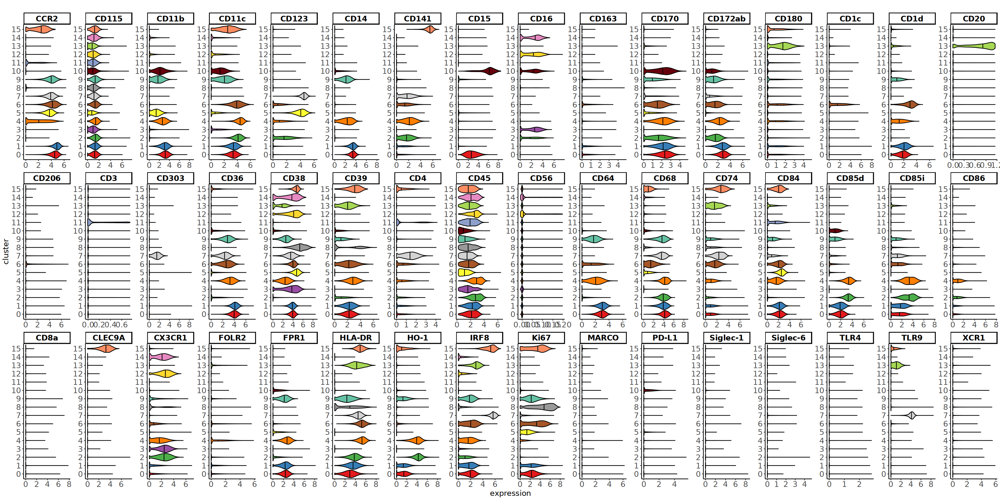

In [25]:
options(repr.plot.height = 14, repr.plot.width = 28)
suppressWarnings({
  as.data.frame(ph_markers_data_arcsinh[,markers]) %>%
    dplyr::mutate(cluster = umap_res$res_cell) %>%
    dplyr::mutate(cluster = factor(cluster,levels=unique(umap_res$res_cell)[order(as.numeric(unique(umap_res$res_cell)))])) %>%
    tidyr::pivot_longer(!cluster) %>%
    magrittr::set_colnames(c("cluster","protein","expression")) %>%
    dplyr::mutate(protein = gsub("\\.","-",protein)) %>% 
    ggplot(.,aes(x=cluster, y=expression, fill = cluster)) + 
    geom_violin(color = "black", aes(fill = cluster), scale = "width", draw_quantiles = c(0.5)) +
    facet_wrap(protein ~ ., scales = "free" , nrow = 3) +
    theme_classic() +
    coord_flip() +
    scale_fill_manual(values = c(
    "0" = "#E41A1C",
    "1" = "#377EB8",
    "2" = "#4DAF4A",
    "3" = "#984EA3",
    "4" = "#FF7F00",
    "5" = "#FFFF33",
    "6" = "#A65628",
    "7" = "lightgrey",
    "8" = "#999999",
    "9" = "#66C2A5",
    "10" = "#67000D",
    "11" = "#8DA0CB",
    "12" = "#FFD92F",
    "13" = "#A6D854",
    "14" = "#E78AC3",
    "15" = "#FC8D62",
    "16" = "darkgrey",
    "17" = "#FEB24C",
    "18" = "#377EB8",
    "19" = "lightblue",
    "20" = "#FDE0EF",
    "21" = "#B8E186",
    "22" = "#66C2A5",
    "23" = "#A6D855",
    "24" = "#E78AC4",
    "25" = "#FC8D63",
    "26" = "brown",
    "27" = "#FEB25C",
    "28" = "#377EB9",
    "29" = "lightgreen",
    "30" = "#FDE1EF"
  )) +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "",
         x = "cluster",
         y = "expression") 
})

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
Warning message in wilcox.test.default(c(29.3729372937294, 21.6943388677736, 19.48, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', '

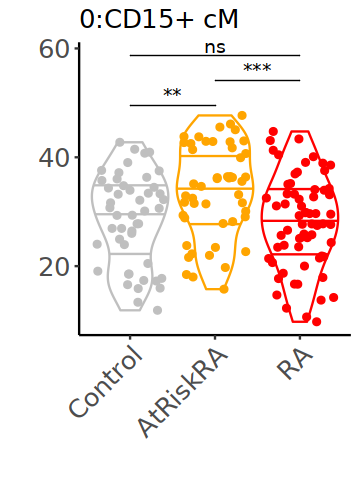

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


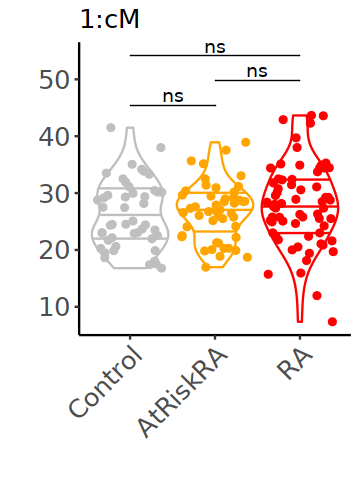

Warning message in wilcox.test.default(c(0.34003400340034, 13.5127025405081, 29.95, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


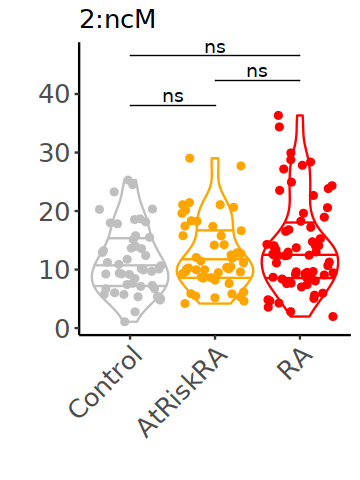

Warning message in wilcox.test.default(c(3.82038203820382, 3.36067213442689, 3.29, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


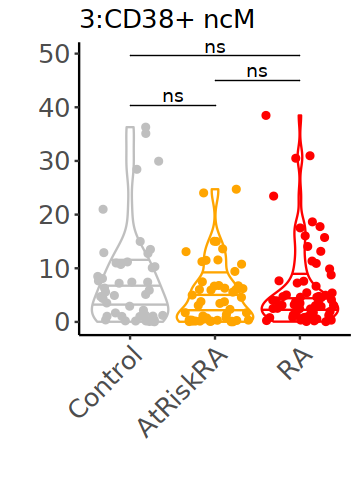

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


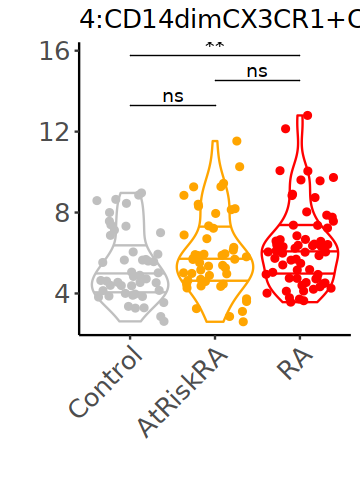

Warning message in wilcox.test.default(c(3.14031403140314, 1.87037407481496, 1.75, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


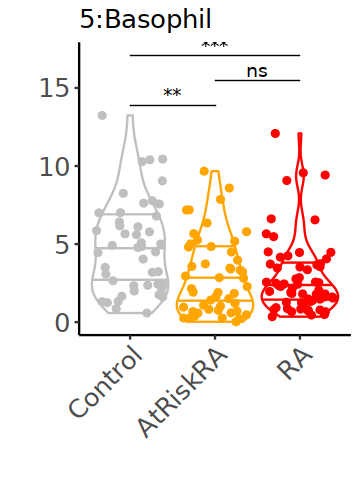

Warning message in wilcox.test.default(c(1.8001800180018, 0.710142028405681, 0.97, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


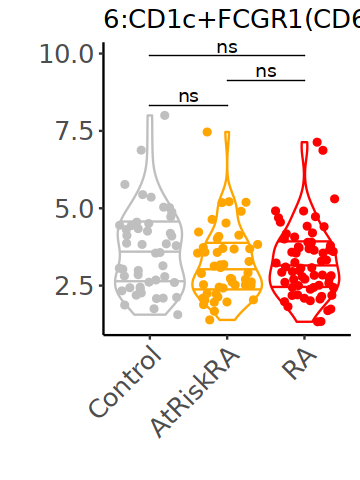

Warning message in wilcox.test.default(c(1.09010901090109, 1.4002800560112, 4, 0.94009400940094, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


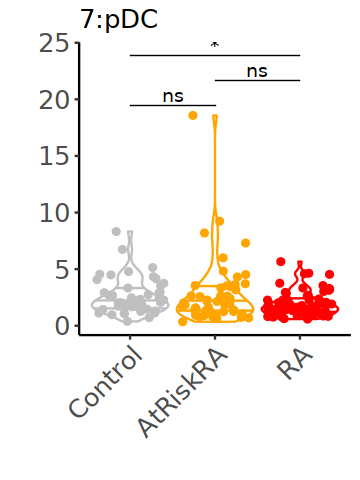

Warning message in wilcox.test.default(c(0.79007900790079, 1.99039807961592, 5.81, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


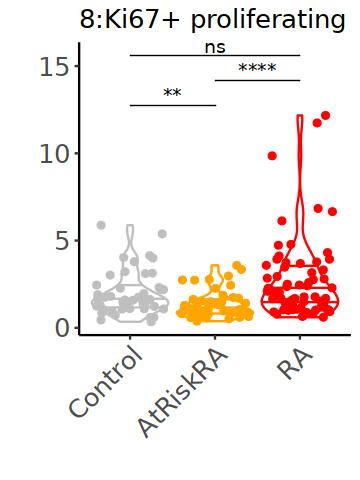

Warning message in wilcox.test.default(c(1.16011601160116, 2.32046409281856, 3.88, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


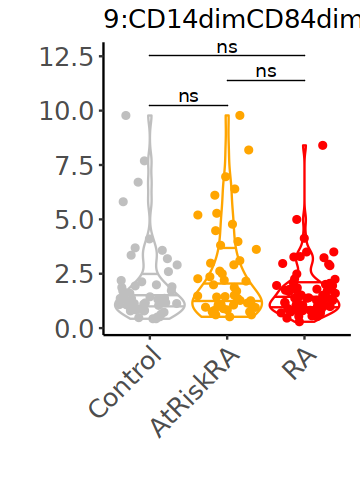

Warning message in wilcox.test.default(c(0.31003100310031, 0.930186037207442, 1.99, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


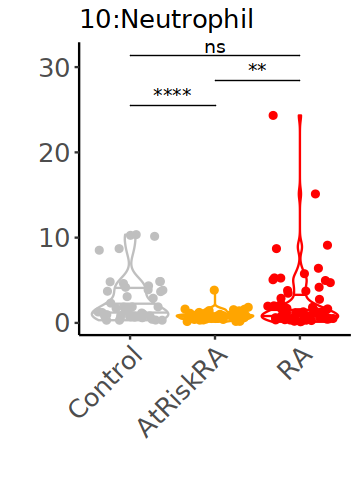

Warning message in wilcox.test.default(c(2.82028202820282, 2.04020402040204, 0.04, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


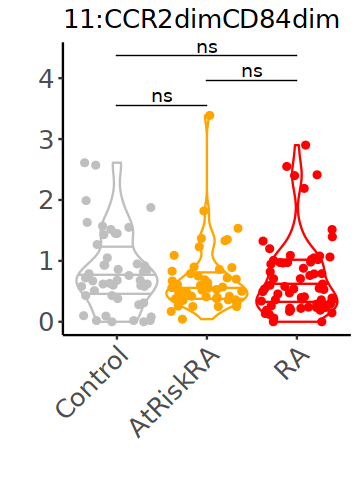

Warning message in wilcox.test.default(c(0.36003600360036, 0.11002200440088, 0.09, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


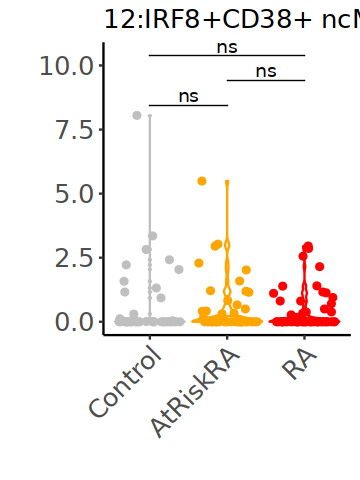

Warning message in wilcox.test.default(c(5.86, 5.83116623324665, 6.42, 3.000600120024, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


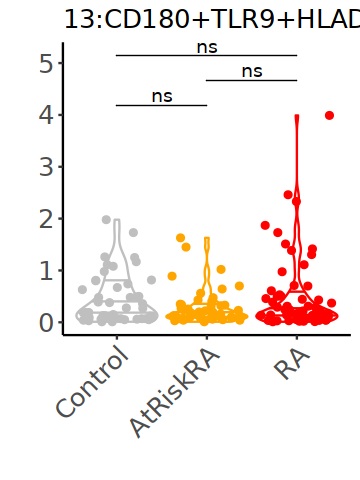

Warning message in wilcox.test.default(c(0.16001600160016, 0.1500300060012, 0.09, :
“cannot compute exact p-value with ties”


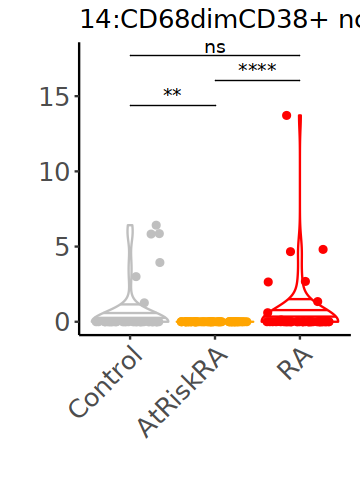

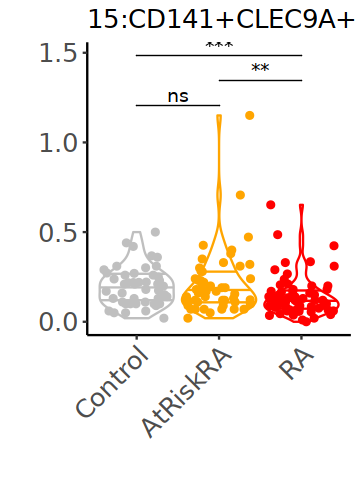

In [26]:
options(repr.plot.height = 4, repr.plot.width = 3)

for (clu in unique(umap_res$res_cell)[order(as.integer(unique(umap_res$res_cell)))]){
    
    # For each subject, make rows that says 0 if the cells belonging to each cluster are 0
    tmp = data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, disease = umap_res$disease) %>%
          dplyr::group_by(subject_id,disease,cluster) %>%
          dplyr::summarize(count = dplyr::n()) %>%
          dplyr::ungroup() %>%
          dplyr::group_by(subject_id) %>%
          dplyr::mutate(proportion = 100*count/sum(count)) %>%
          dplyr::filter(cluster==clu) %>%
        dplyr::group_by(disease,cluster) %>%
        dplyr::summarize(count = dplyr::n()) %>%
        dplyr::ungroup()
    for (dis in c("Control","AtRiskRA","RA")){
        if(!(dis %in% tmp$disease)){
            tmp = tmp %>%
                dplyr::add_row(disease = dis, cluster = clu, count = 0)
        }
    }
    tmp = cbind(
        tmp,
        all_count = umap_res %>%
            dplyr::distinct(disease,subject_id) %>%
            dplyr::group_by(disease) %>%
            dplyr::summarize(all_count = dplyr::n()) %>%
            .$all_count
        ) %>%
        dplyr::mutate(diff = all_count-count)
    tmp = rbind(
        data.frame(subject_id = rep("Control",tmp[tmp$disease == "Control",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "Control",]$diff), 
                   count = rep(0,tmp[tmp$disease == "Control",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "Control",]$diff), 
                   disease = rep("Control",tmp[tmp$disease == "Control",]$diff)
                   ),
        data.frame(subject_id = rep("AtRiskRA",tmp[tmp$disease == "AtRiskRA",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   count = rep(0,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   disease = rep("AtRiskRA",tmp[tmp$disease == "AtRiskRA",]$diff)
                   ),
        data.frame(subject_id = rep("RA",tmp[tmp$disease == "RA",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "RA",]$diff), 
                   count = rep(0,tmp[tmp$disease == "RA",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "RA",]$diff), 
                   disease = rep("RA",tmp[tmp$disease == "RA",]$diff)
                   )
        )
    
    plot(
       data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, disease = umap_res$disease) %>%
          dplyr::group_by(subject_id,disease,cluster) %>%
          dplyr::summarize(count = dplyr::n()) %>%
          dplyr::ungroup() %>%
          dplyr::group_by(subject_id) %>%
          dplyr::mutate(proportion = 100*count/sum(count)) %>%
          dplyr::filter(cluster==clu) %>%
          rbind(.,tmp) %>%
          dplyr::mutate(disease = factor(disease,levels = c("Control", "AtRiskRA", "RA"))) %>%
          ggplot(., aes(x = disease, y=proportion, fill = cluster)) + 
          geom_violin(aes(color = disease), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
          geom_jitter(aes(fill = disease, color = disease)) +
          ggpubr::stat_compare_means(
            comparisons = list(c("Control", "AtRiskRA"), c("AtRiskRA", "RA"),  c("Control", "RA")), 
            label = "p.signif",
            tip.length = 0
            ) +
          scale_fill_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
          scale_color_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
          theme_classic() +
          theme(strip.text.x=element_text(size=15, color="black", face="bold"),
                strip.text.y=element_text(size=15, color="black", face="bold"),
                legend.position = "none",
                plot.title = element_text(size=15),
                axis.title.x = element_text(size=15),
                axis.title.y = element_text(size =15),
                axis.text.y = element_text(size = 15),
                axis.text.x = element_text(size = 15, angle = 45, hjust=1),
                legend.text =  element_text(size = 15),
                legend.key.size = grid::unit(0.5, "lines"),
                legend.title = element_text(size = 0.8, hjust = 0)) +
          labs(title = paste(clu,unique(cluster_df[cluster_df$cluster==clu,]$clu_name),sep=":"),
               x = "",
               y = "") 

            )
}



`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
Warning message in wilcox.test.default(c(29.3729372937294, 21.6943388677736, 19.48, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'.

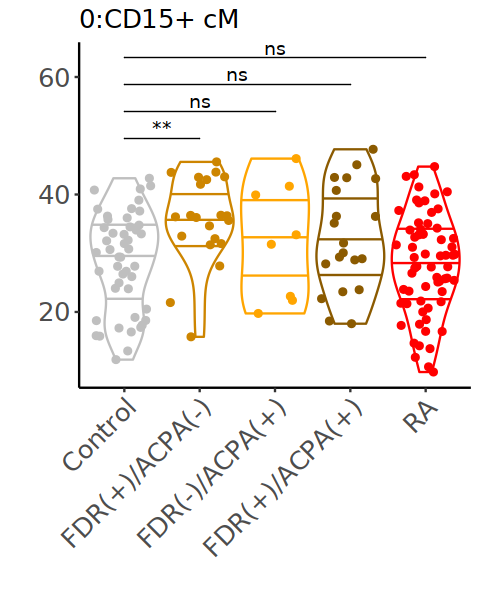

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


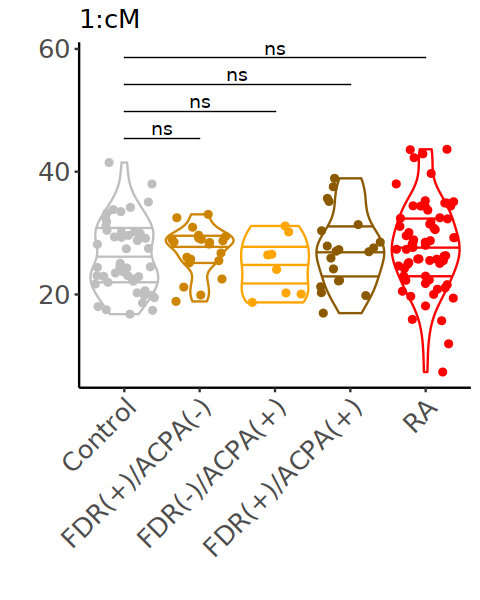

Warning message in wilcox.test.default(c(0.34003400340034, 13.5127025405081, 29.95, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.34003400340034, 13.5127025405081, 29.95, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.34003400340034, 13.5127025405081, 29.95, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


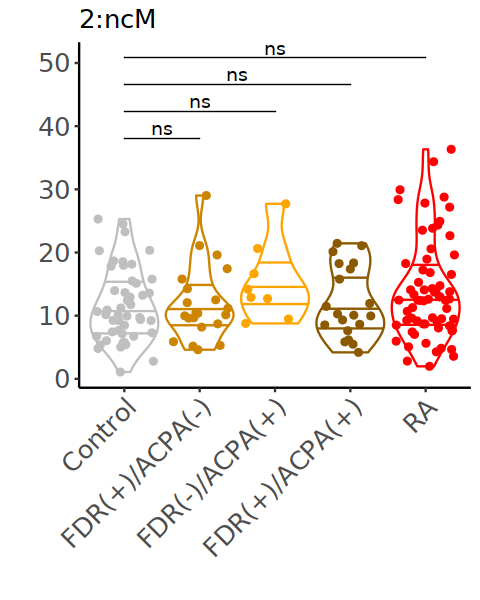

Warning message in wilcox.test.default(c(3.82038203820382, 3.36067213442689, 3.29, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


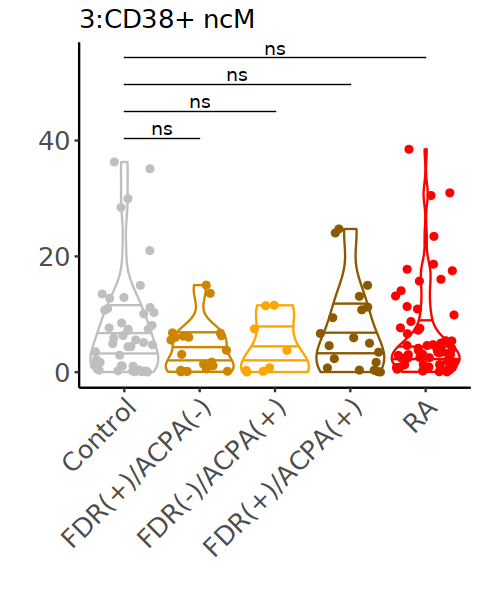

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


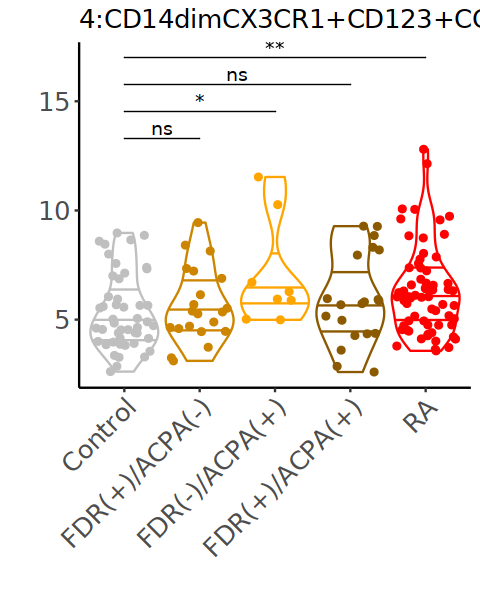

Warning message in wilcox.test.default(c(3.14031403140314, 1.87037407481496, 1.75, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


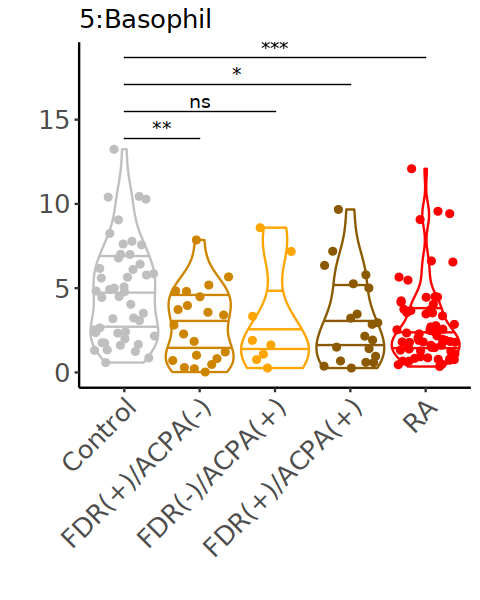

Warning message in wilcox.test.default(c(1.8001800180018, 0.710142028405681, 0.97, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.8001800180018, 0.710142028405681, 0.97, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


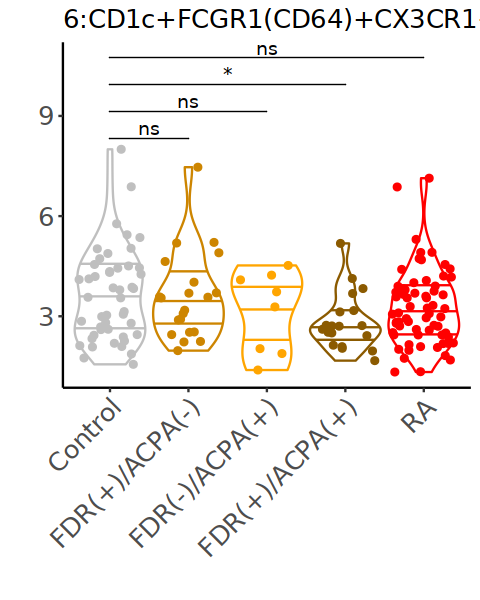

Warning message in wilcox.test.default(c(1.09010901090109, 1.4002800560112, 4, 0.94009400940094, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.09010901090109, 1.4002800560112, 4, 0.94009400940094, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.09010901090109, 1.4002800560112, 4, 0.94009400940094, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


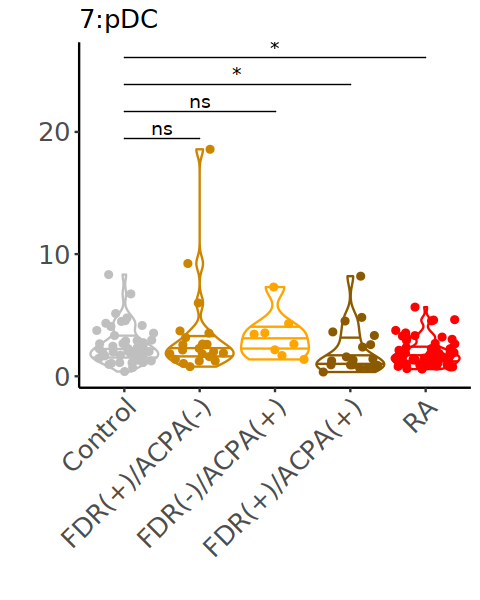

Warning message in wilcox.test.default(c(0.79007900790079, 1.99039807961592, 5.81, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.79007900790079, 1.99039807961592, 5.81, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.79007900790079, 1.99039807961592, 5.81, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


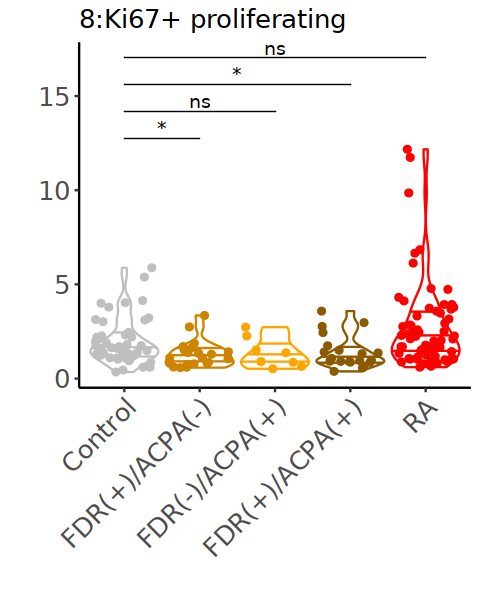

Warning message in wilcox.test.default(c(1.16011601160116, 2.32046409281856, 3.88, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.16011601160116, 2.32046409281856, 3.88, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


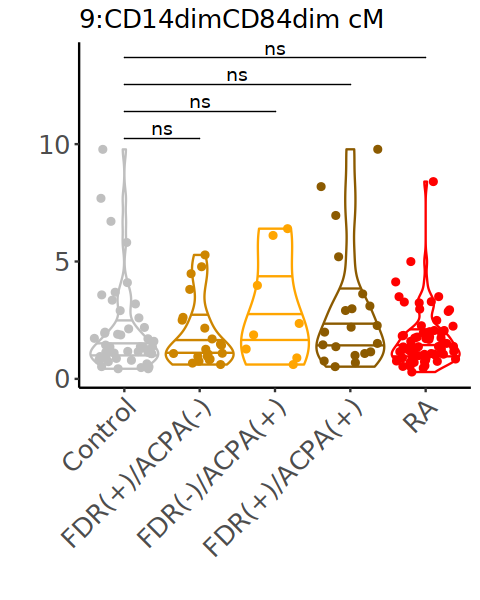

Warning message in wilcox.test.default(c(0.31003100310031, 0.930186037207442, 1.99, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.31003100310031, 0.930186037207442, 1.99, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.31003100310031, 0.930186037207442, 1.99, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


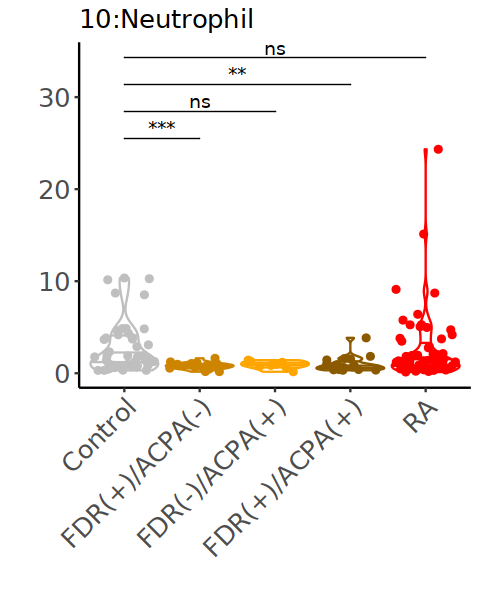

Warning message in wilcox.test.default(c(2.82028202820282, 2.04020402040204, 0.04, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(2.82028202820282, 2.04020402040204, 0.04, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(2.82028202820282, 2.04020402040204, 0.04, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


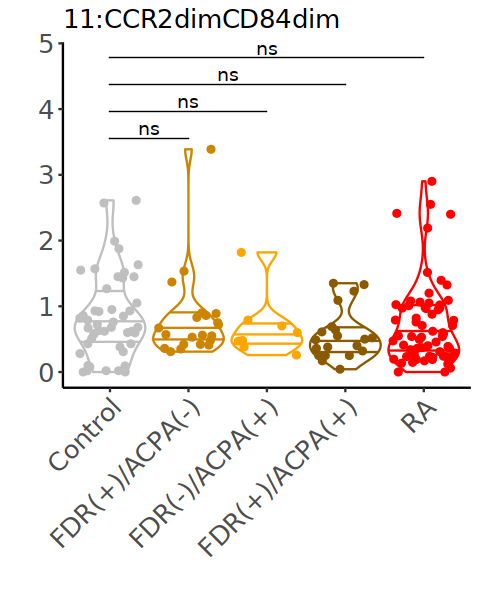

Warning message in wilcox.test.default(c(0.36003600360036, 0.11002200440088, 0.09, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.36003600360036, 0.11002200440088, 0.09, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.36003600360036, 0.11002200440088, 0.09, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


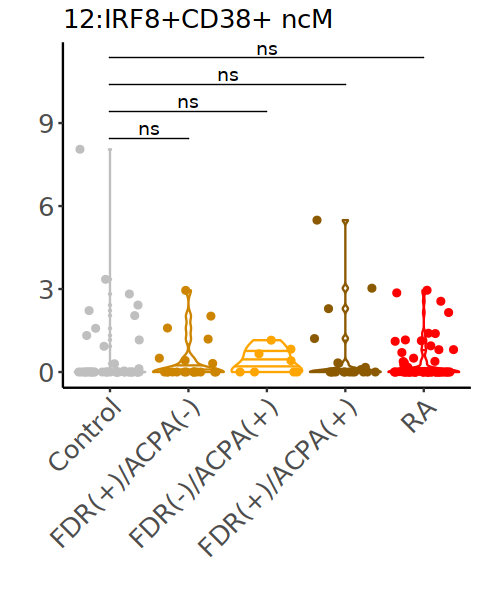

Warning message in wilcox.test.default(c(5.86, 5.83116623324665, 6.42, 3.000600120024, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.86, 5.83116623324665, 6.42, 3.000600120024, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.86, 5.83116623324665, 6.42, 3.000600120024, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


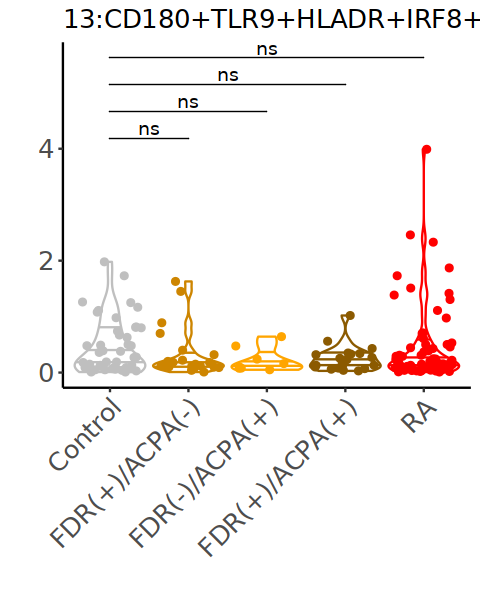

Warning message in wilcox.test.default(c(0.16001600160016, 0.1500300060012, 0.09, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.16001600160016, 0.1500300060012, 0.09, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.16001600160016, 0.1500300060012, 0.09, :
“cannot compute exact p-value with ties”


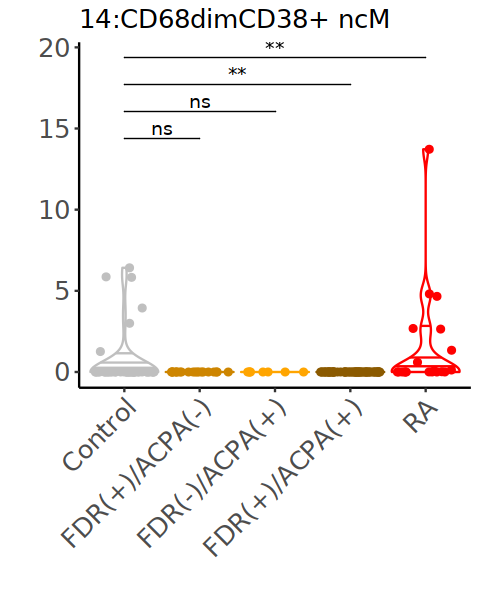

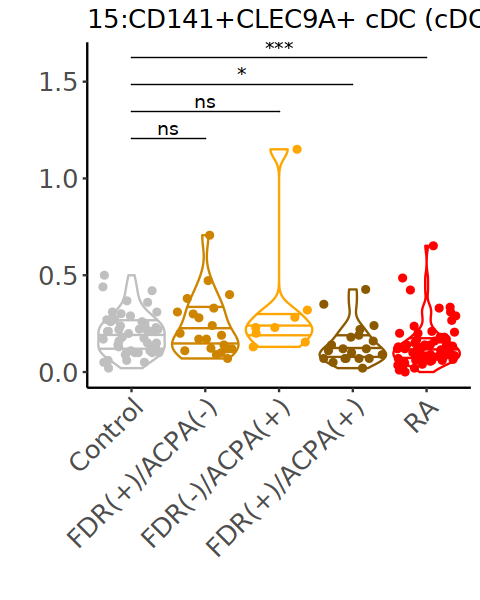

In [27]:
options(repr.plot.height = 5, repr.plot.width = 4)

for (clu in unique(umap_res$res_cell)[order(as.integer(unique(umap_res$res_cell)))]){
    
    # For each subject, make rows that says 0 if the cells belonging to each cluster are 0
  tmp = data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, AtRisk = umap_res$AtRisk) %>%
    dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
    dplyr::group_by(subject_id,AtRisk,cluster) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(subject_id) %>%
    dplyr::mutate(proportion = 100*count/sum(count)) %>%
    dplyr::filter(cluster==clu) %>%
    dplyr::group_by(AtRisk,cluster) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::ungroup() %>%
    dplyr::arrange(AtRisk)
  for (dis in c("Control","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA")){
    if(!(dis %in% tmp$AtRisk)){
      tmp = tmp %>%
        dplyr::add_row(AtRisk = dis, cluster = clu, count = 0)
    }
  }
  tmp = cbind(
    tmp,
    all_count = umap_res %>%
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::distinct(AtRisk,subject_id) %>%
      dplyr::group_by(AtRisk) %>%
      dplyr::summarize(all_count = dplyr::n()) %>%
      .$all_count
  ) %>%
    dplyr::mutate(diff = all_count-count)
  
  tmp = rbind(
    data.frame(subject_id = rep("Control",tmp[tmp$AtRisk == "Control",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "Control",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "Control",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "Control",]$diff), 
               AtRisk = rep("Control",tmp[tmp$AtRisk == "Control",]$diff)
    ),
    data.frame(subject_id = rep("FDR(+)/ACPA(-)",tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               AtRisk = rep("FDR(+)/ACPA(-)",tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff)
    ),
    data.frame(subject_id = rep("FDR(-)/ACPA(+)",tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               AtRisk = rep("FDR(-)/ACPA(+)",tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff)
    ),
    data.frame(subject_id = rep("FDR(+)/ACPA(+)",tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               AtRisk = rep("FDR(+)/ACPA(+)",tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff)
    ),
    data.frame(subject_id = rep("RA",ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               cluster = rep(clu,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               count = rep(0,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               proportion = rep(0,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)),  
               AtRisk = rep("RA",ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0))
    )
  )
  
  plot(
    data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, AtRisk = umap_res$AtRisk) %>%
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::group_by(subject_id,AtRisk,cluster) %>%
      dplyr::summarize(count = dplyr::n()) %>%
      dplyr::ungroup() %>%
      dplyr::group_by(subject_id) %>%
      dplyr::mutate(proportion = 100*count/sum(count)) %>%
      dplyr::filter(cluster==clu) %>%
      rbind(.,tmp) %>%
      dplyr::mutate(AtRisk = factor(AtRisk,levels=c("Control","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA"))) %>%
      ggplot(., aes(x = AtRisk, y=proportion, fill = cluster)) + 
      geom_violin(aes(color = AtRisk), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
      geom_jitter(aes(fill = AtRisk, color = AtRisk)) +
      ggpubr::stat_compare_means(
        comparisons = list(c("Control", "FDR(+)/ACPA(-)"), c("Control", "FDR(-)/ACPA(+)"), c("Control", "FDR(+)/ACPA(+)"), c("Control", "RA")), 
        label = "p.signif",
        tip.length = 0
      ) +
      scale_fill_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) +
      scale_color_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) + 
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
            strip.text.y=element_text(size=15, color="black", face="bold"),
            legend.position = "none",
            plot.title = element_text(size=15),
            axis.title.x = element_text(size=15),
            axis.title.y = element_text(size =15),
            axis.text.y = element_text(size = 15),
            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
            legend.text =  element_text(size = 15),
            legend.key.size = grid::unit(0.5, "lines"),
            legend.title = element_text(size = 0.8, hjust = 0)) +
      labs(title = paste(clu,unique(cluster_df[cluster_df$cluster==clu,]$clu_name),sep=":"),
           x = "",
           y = "") 
    
  )
}


[1] "CCR2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.73
2 AtRiskRA   1.77
3 RA         1.76


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CD115"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.10
2 AtRiskRA   1.09
3 RA         1.12


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CD11b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.51
2 AtRiskRA   1.48
3 RA         1.48


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


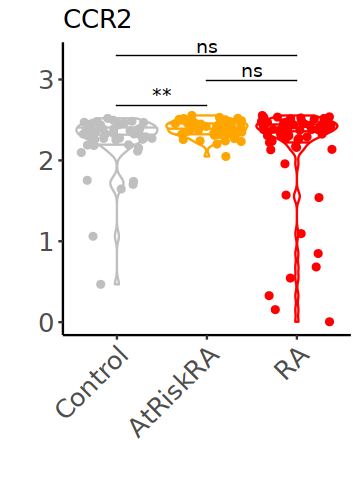

[1] "CD11c"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.63
2 AtRiskRA   1.65
3 RA         1.64


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


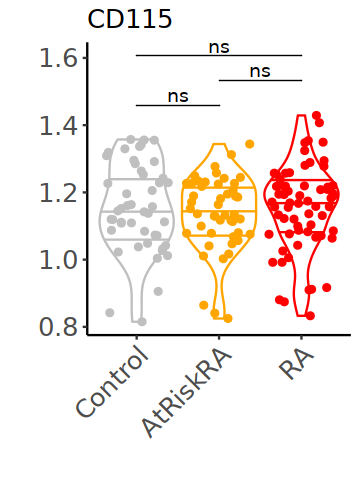

[1] "CD123"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition    med
  <fct>      <dbl>
1 Control   0.0554
2 AtRiskRA  0.0149
3 RA        0.0836


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


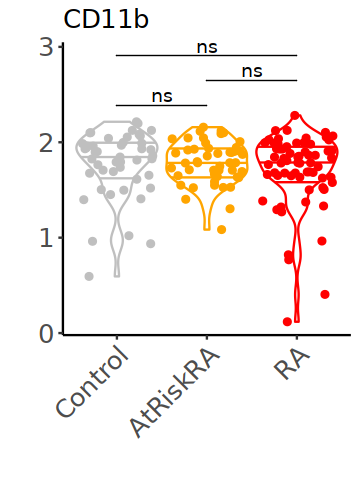

[1] "CD14"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.56
2 AtRiskRA   1.56
3 RA         1.57


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


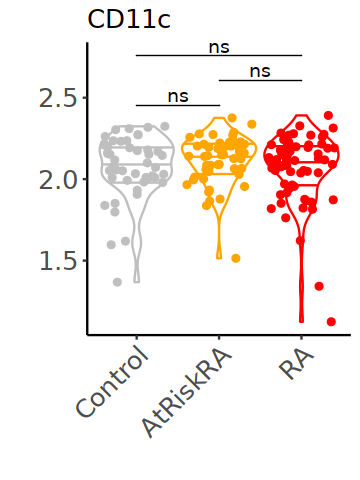

[1] "CD141"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.600
2 AtRiskRA  0.690
3 RA        0.814


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


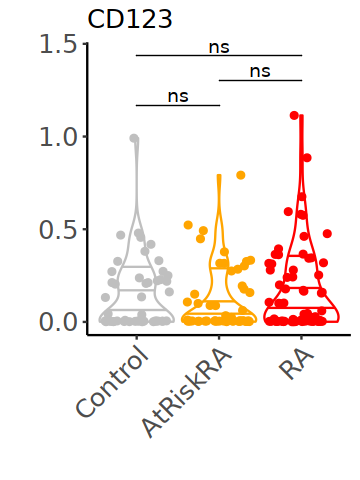

[1] "CD15"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.562
2 AtRiskRA  0.659
3 RA        0.313


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


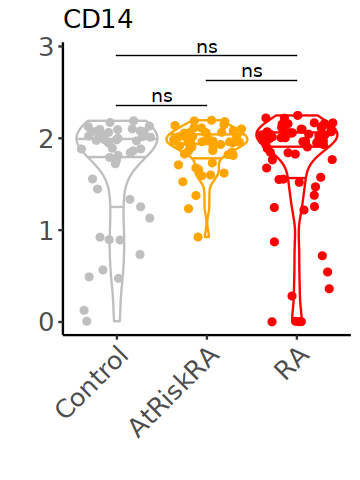

[1] "CD16"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00221
2 AtRiskRA  0.00188
3 RA        0.00254


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


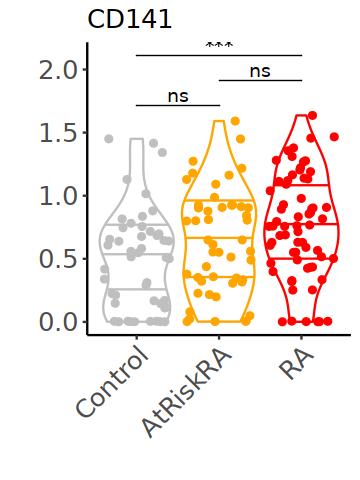

[1] "CD163"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00368
2 AtRiskRA  0.126  
3 RA        0.00944


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


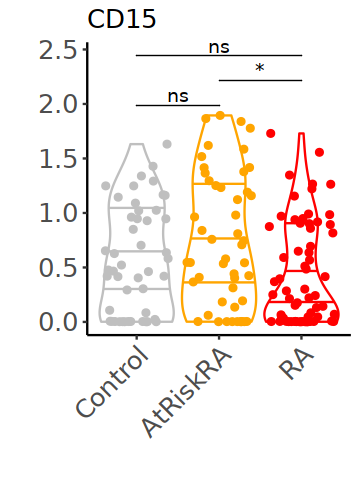

[1] "CD170"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.37
2 AtRiskRA   1.38
3 RA         1.32


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


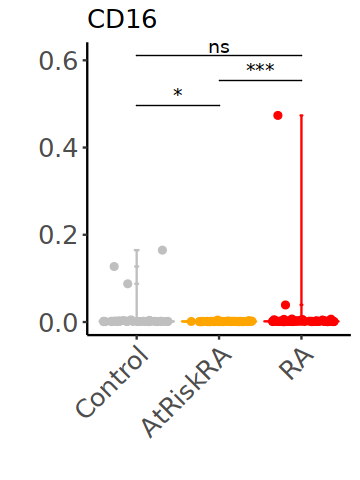

[1] "CD172ab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.35
2 AtRiskRA   1.46
3 RA         1.46


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


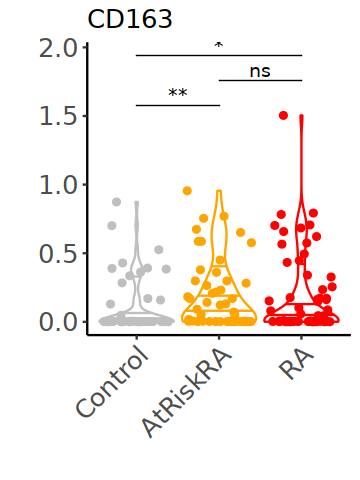

[1] "CD180"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.510
2 AtRiskRA  0.418
3 RA        0.361


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


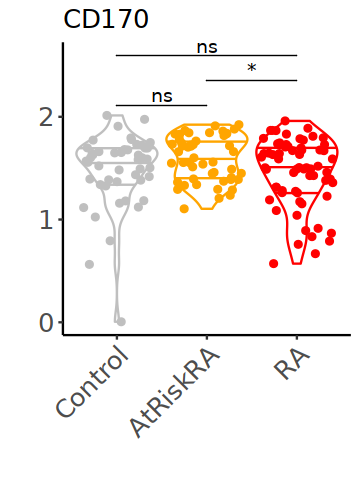

[1] "CD1c"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00107
2 AtRiskRA  0.00125
3 RA        0.00126


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


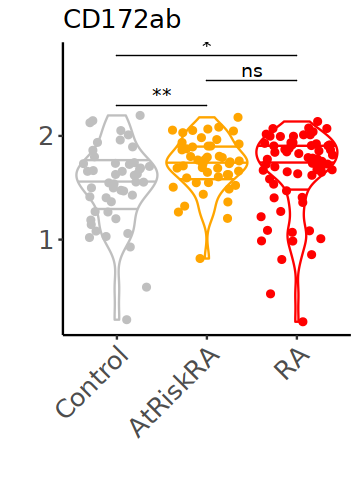

[1] "CD1d"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.13
2 AtRiskRA   1.20
3 RA         1.18


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


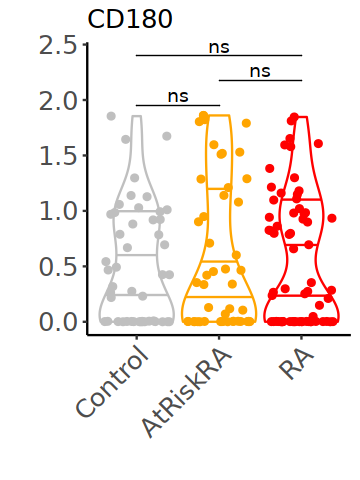

[1] "CD20"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000957
2 AtRiskRA  0.00104 
3 RA        0.00101 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


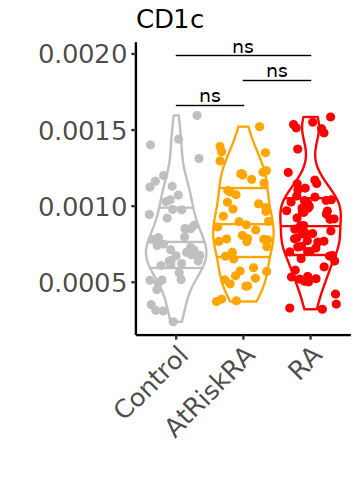

[1] "CD206"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00133
2 AtRiskRA  0.00164
3 RA        0.00157


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


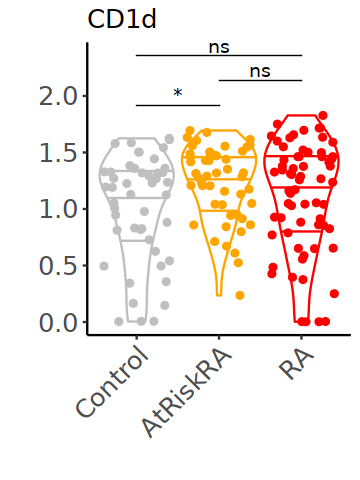

[1] "CD3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.00105 
2 AtRiskRA  0.00117 
3 RA        0.000994


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


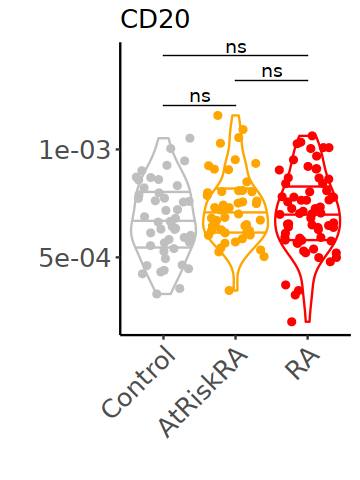

[1] "CD303"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000607
2 AtRiskRA  0.000648
3 RA        0.000568


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


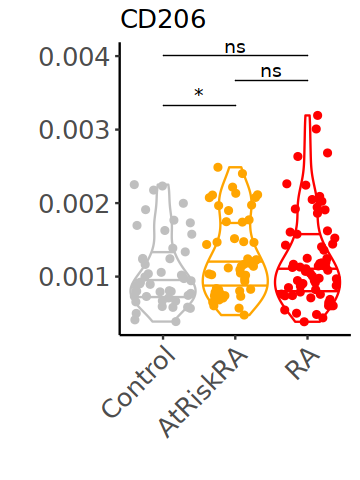

[1] "CD36"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.65
2 AtRiskRA   1.68
3 RA         1.65


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


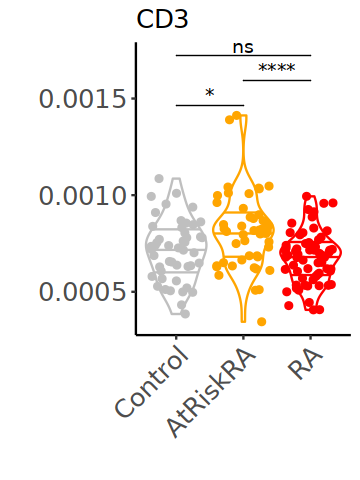

[1] "CD38"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.68
2 AtRiskRA   1.70
3 RA         1.70


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


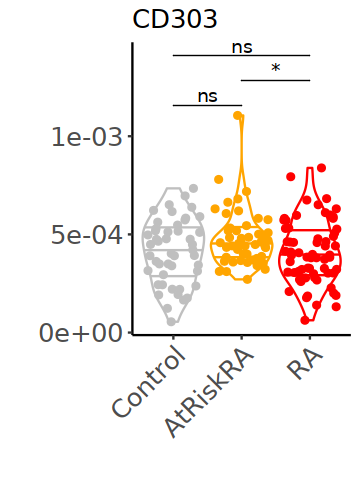

[1] "CD39"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.27
2 AtRiskRA   1.33
3 RA         1.32


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


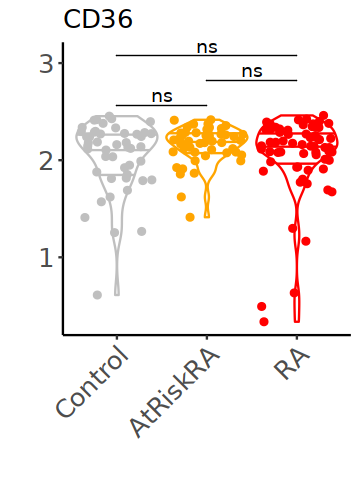

[1] "CD4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.280
2 AtRiskRA  0.369
3 RA        0.326


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


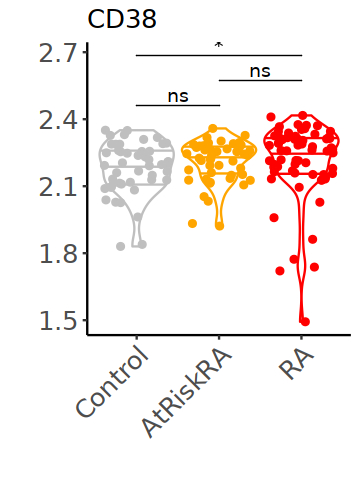

[1] "CD45"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.31
2 AtRiskRA   1.39
3 RA         1.48


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


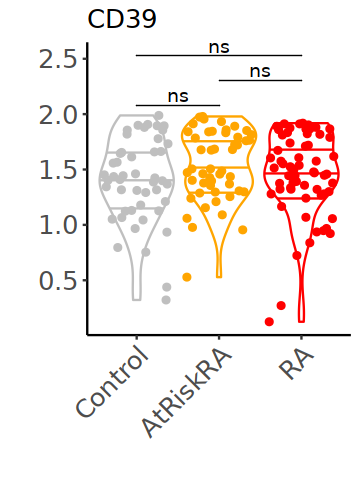

[1] "CD56"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000971
2 AtRiskRA  0.00115 
3 RA        0.00105 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


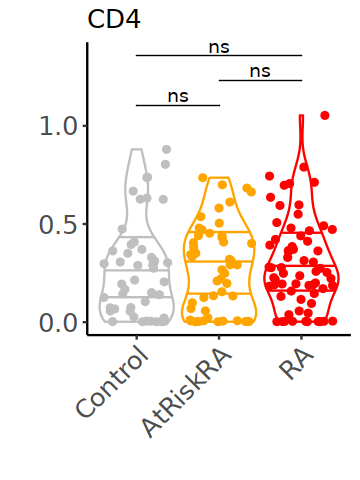

[1] "CD64"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.44
2 AtRiskRA   1.43
3 RA         1.50


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


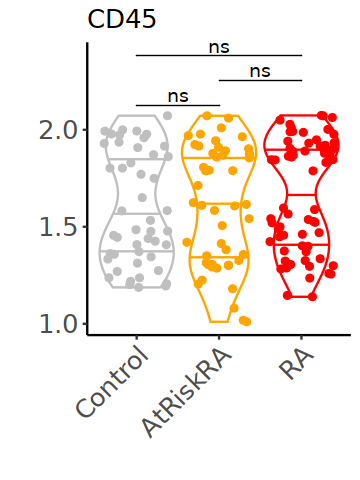

[1] "CD68"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.67
2 AtRiskRA   1.74
3 RA         1.70


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


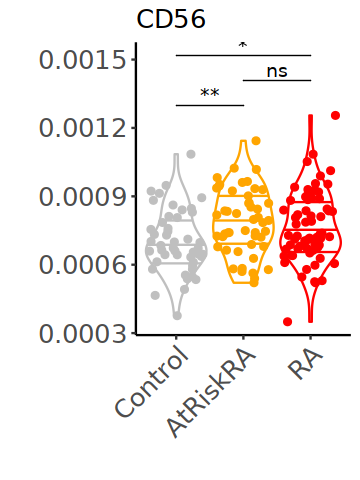

[1] "CD74"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.597
2 AtRiskRA  0.858
3 RA        0.727


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


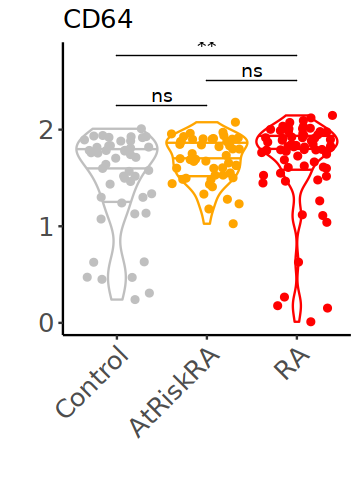

[1] "CD84"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.29
2 AtRiskRA   1.29
3 RA         1.31


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


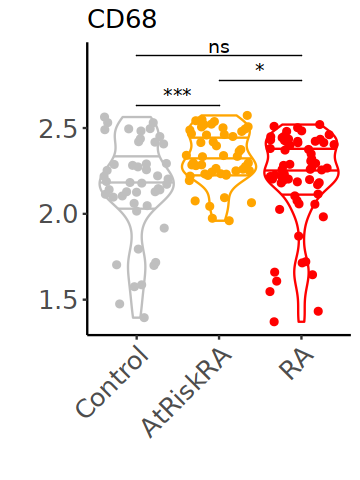

[1] "CD85d"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.29
2 AtRiskRA   1.36
3 RA         1.35


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


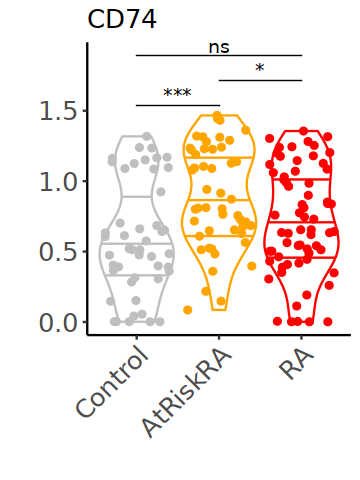

[1] "CD85i"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.24
2 AtRiskRA   1.28
3 RA         1.34


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


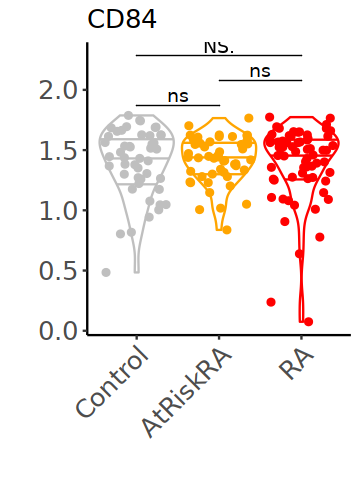

[1] "CD86"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.307
2 AtRiskRA  0.483
3 RA        0.380


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


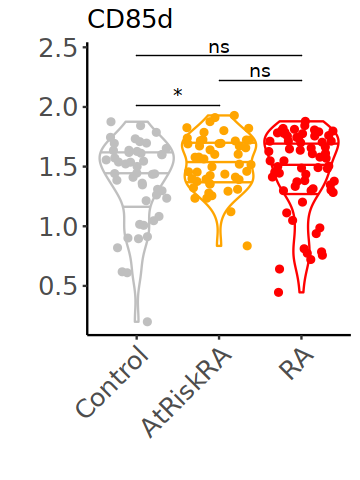

[1] "CD8a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00187
2 AtRiskRA  0.00235
3 RA        0.00163


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


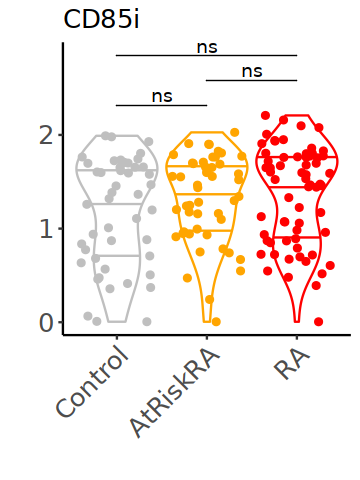

[1] "CLEC9A"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00126
2 AtRiskRA  0.00106
3 RA        0.00120


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


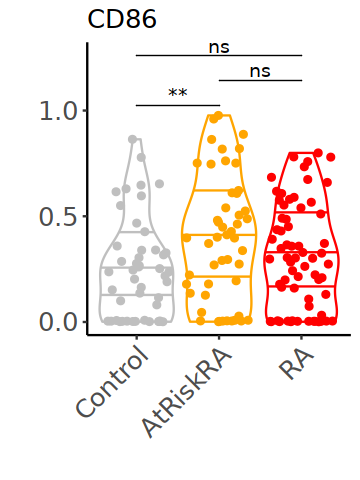

[1] "CX3CR1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.706
2 AtRiskRA  1.04 
3 RA        0.781


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


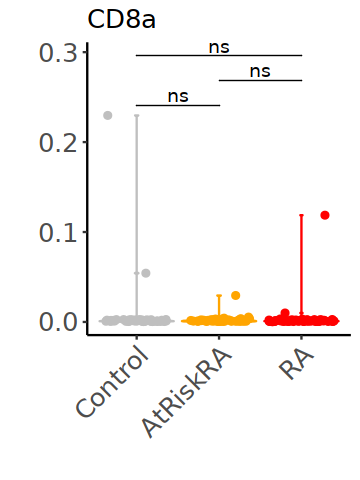

[1] "FOLR2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition    med
  <fct>      <dbl>
1 Control   0.0326
2 AtRiskRA  0.0723
3 RA        0.0420


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


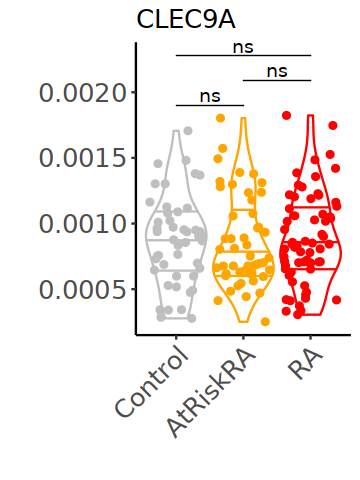

[1] "FPR1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.34
2 AtRiskRA   1.38
3 RA         1.36


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


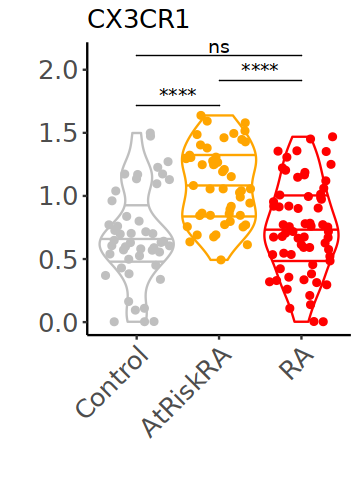

[1] "HLA-DR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.62
2 AtRiskRA   1.61
3 RA         1.63


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


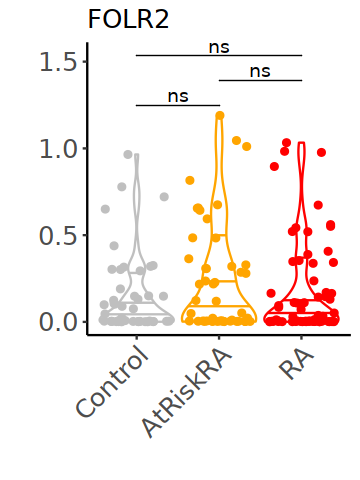

[1] "IRF8"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.16
2 AtRiskRA   1.24
3 RA         1.26


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


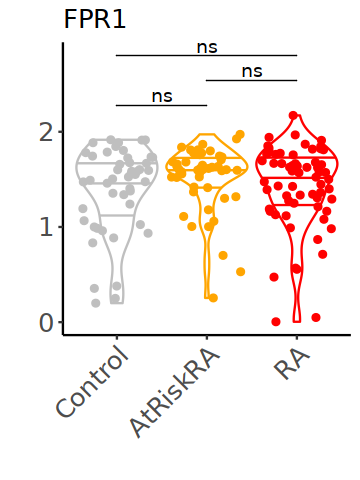

[1] "Ki67"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.994
2 AtRiskRA  1.16 
3 RA        1.27 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


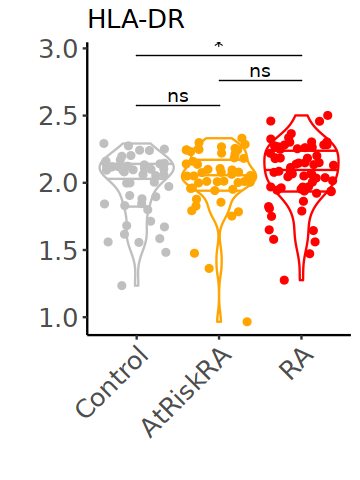

[1] "MARCO"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00108
2 AtRiskRA  0.00136
3 RA        0.00130


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


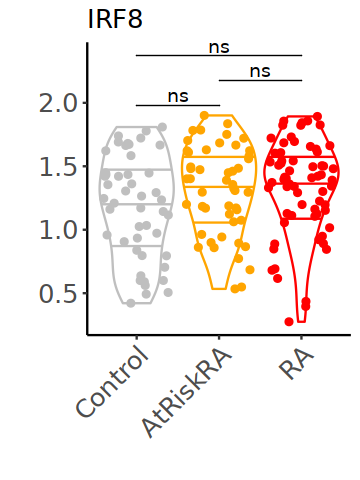

[1] "PD-L1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00256
2 AtRiskRA  0.00264
3 RA        0.00298


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


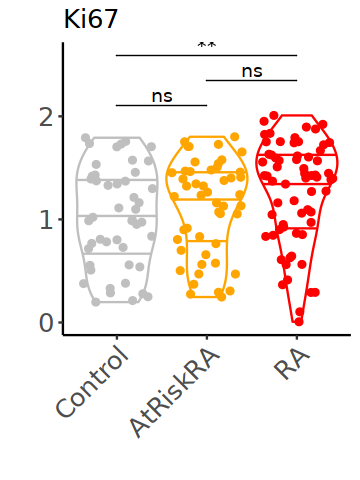

[1] "Siglec-1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000934
2 AtRiskRA  0.000921
3 RA        0.00128 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


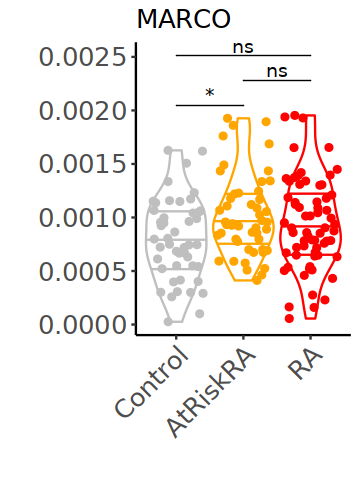

[1] "Siglec-6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000225
2 AtRiskRA  0.000219
3 RA        0.000220


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


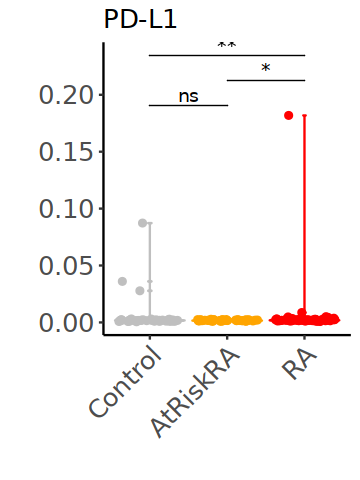

[1] "TLR4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00107
2 AtRiskRA  0.00122
3 RA        0.00117


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


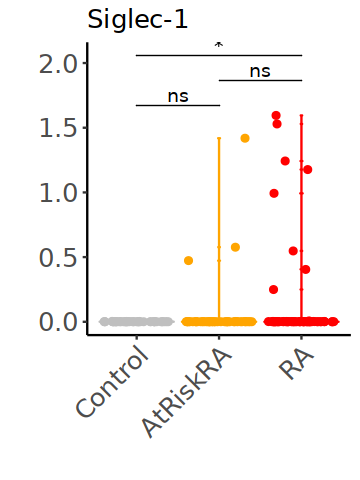

[1] "TLR9"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00236
2 AtRiskRA  0.00258
3 RA        0.00255


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


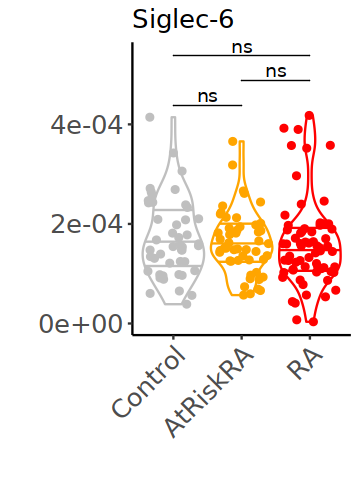

[1] "XCR1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00221
2 AtRiskRA  0.00440
3 RA        0.00349


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


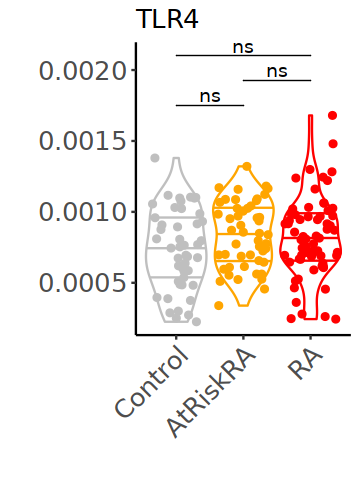

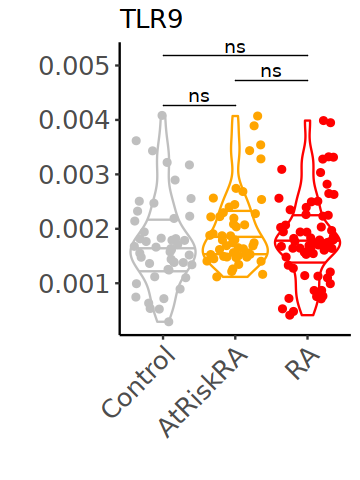

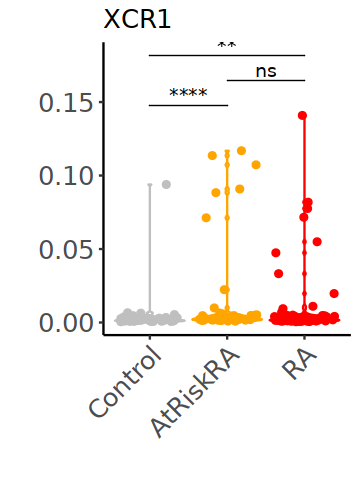

In [28]:

markers = c('CCR2','CD115','CD11b','CD11c','CD123','CD14','CD141','CD15','CD16','CD163','CD170','CD172ab','CD180','CD1c','CD1d','CD20','CD206','CD3','CD303','CD36','CD38','CD39','CD4','CD45','CD56','CD64','CD68','CD74','CD84','CD85d','CD85i','CD86','CD8a','CLEC9A','CX3CR1','FOLR2','FPR1','HLA-DR','IRF8','Ki67','MARCO','PD-L1','Siglec-1','Siglec-6','TLR4','TLR9','XCR1')
options(repr.plot.height = 4, repr.plot.width = 3)
for (gene in markers){
    print(gene)
    
    data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, condition = umap_res$disease) %>% 
        dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
        dplyr::group_by(subject_id, condition) %>%
        dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
        dplyr::ungroup() %>%
        dplyr::group_by(condition) %>%
        dplyr::summarize(med = quantile(log2(med+1), probs = c(0.5))) %>% print()
    plot(
        data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, condition = umap_res$disease) %>% 
            dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
            dplyr::group_by(subject_id, condition) %>%
            dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
            ggplot(., aes(x = condition, y=med, fill = condition, color = condition)) + 
                      geom_violin(aes(color = condition), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
                      geom_jitter(aes(fill = condition, color = condition)) +
                      ggpubr::stat_compare_means(
                        comparisons = list(c("Control", "AtRiskRA"), c("AtRiskRA", "RA"),  c("Control", "RA")), 
                        label = "p.signif",
                        tip.length = 0
                        ) +
                      scale_fill_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
                      scale_color_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
                      theme_classic() +
                      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
                            strip.text.y=element_text(size=15, color="black", face="bold"),
                            legend.position = "none",
                            plot.title = element_text(size=15),
                            axis.title.x = element_text(size=15),
                            axis.title.y = element_text(size =15),
                            axis.text.y = element_text(size = 15),
                            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
                            legend.text =  element_text(size = 15),
                            legend.key.size = grid::unit(0.5, "lines"),
                            legend.title = element_text(size = 0.8, hjust = 0)) +
                      labs(title = gene,
                           x = "",
                           y = "") 
         )

}



[1] "CCR2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.73
2 FDR(+)/ACPA(+)  1.75
3 FDR(+)/ACPA(-)  1.77
4 FDR(-)/ACPA(+)  1.76
5 RA              1.76


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CD115"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.10
2 FDR(+)/ACPA(+)  1.10
3 FDR(+)/ACPA(-)  1.09
4 FDR(-)/ACPA(+)  1.11
5 RA              1.12


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CD11b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.51
2 FDR(+)/ACPA(+)  1.46
3 FDR(+)/ACPA(-)  1.48
4 FDR(-)/ACPA(+)  1.50
5 RA              1.48


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


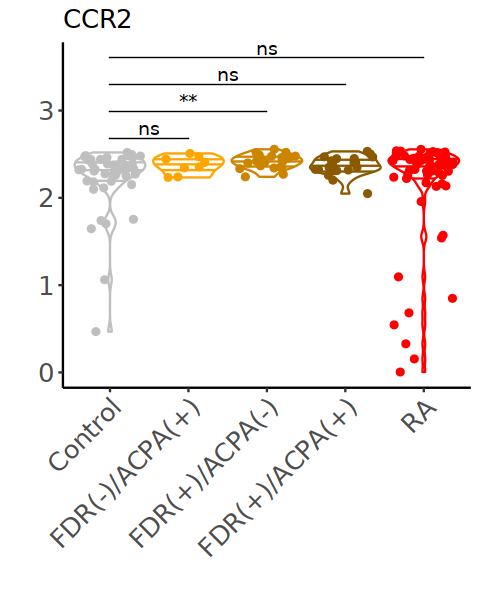

[1] "CD11c"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.63
2 FDR(+)/ACPA(+)  1.64
3 FDR(+)/ACPA(-)  1.66
4 FDR(-)/ACPA(+)  1.65
5 RA              1.64


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


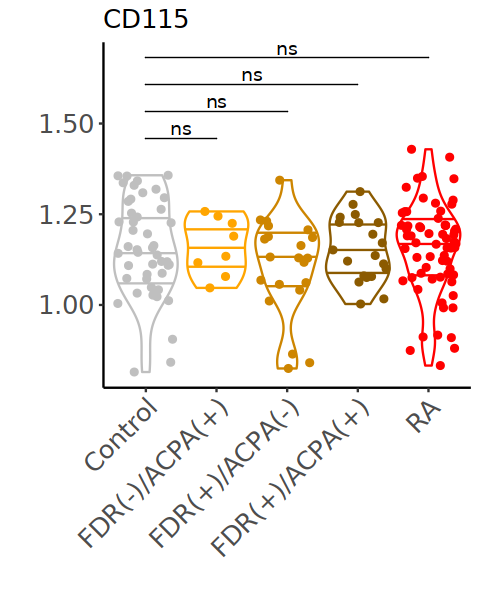

[1] "CD123"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.0554 
2 FDR(+)/ACPA(+) 0.00767
3 FDR(+)/ACPA(-) 0.0274 
4 FDR(-)/ACPA(+) 0.149  
5 RA             0.0836 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


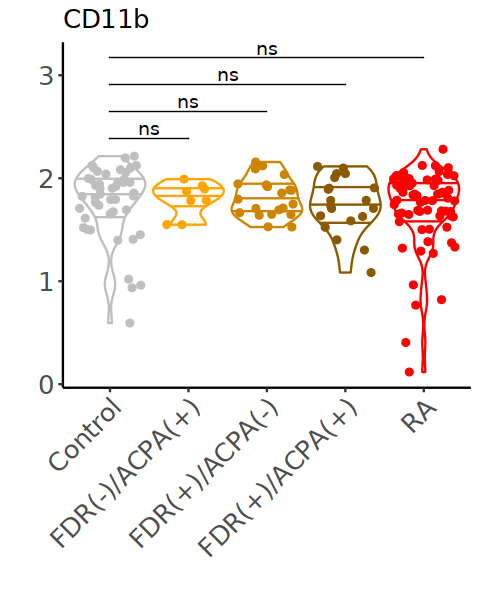

[1] "CD14"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.56
2 FDR(+)/ACPA(+)  1.56
3 FDR(+)/ACPA(-)  1.57
4 FDR(-)/ACPA(+)  1.54
5 RA              1.57


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


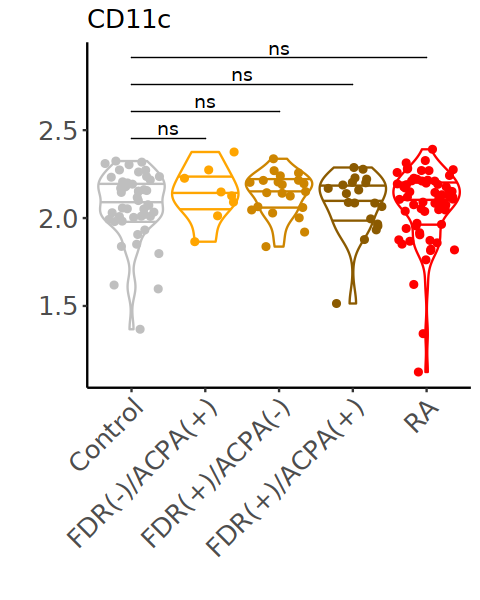

[1] "CD141"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.600
2 FDR(+)/ACPA(+) 0.605
3 FDR(+)/ACPA(-) 0.722
4 FDR(-)/ACPA(+) 0.889
5 RA             0.814


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


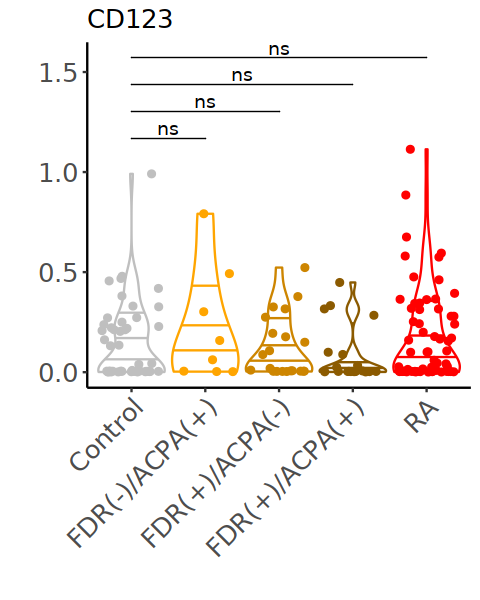

[1] "CD15"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.562
2 FDR(+)/ACPA(+) 0.627
3 FDR(+)/ACPA(-) 0.856
4 FDR(-)/ACPA(+) 0.737
5 RA             0.313


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


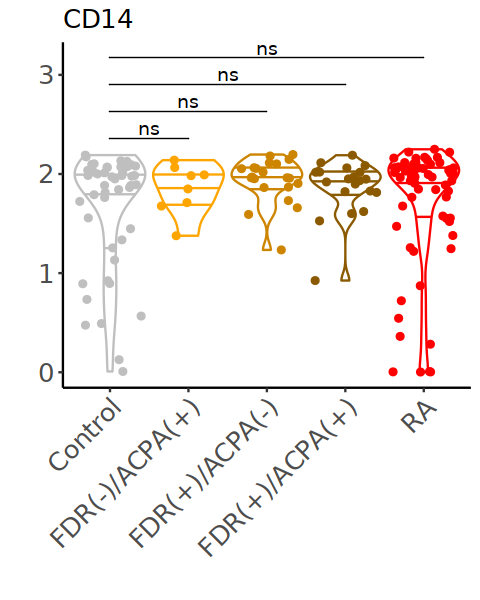

[1] "CD16"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00221
2 FDR(+)/ACPA(+) 0.00187
3 FDR(+)/ACPA(-) 0.00180
4 FDR(-)/ACPA(+) 0.00202
5 RA             0.00254


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


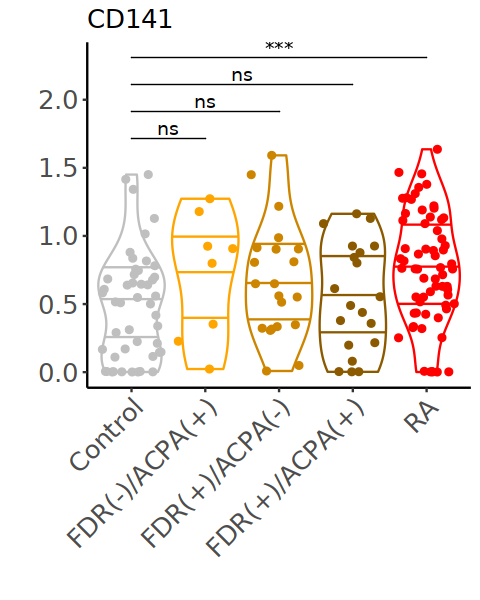

[1] "CD163"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00368
2 FDR(+)/ACPA(+) 0.234  
3 FDR(+)/ACPA(-) 0.0999 
4 FDR(-)/ACPA(+) 0.131  
5 RA             0.00944


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


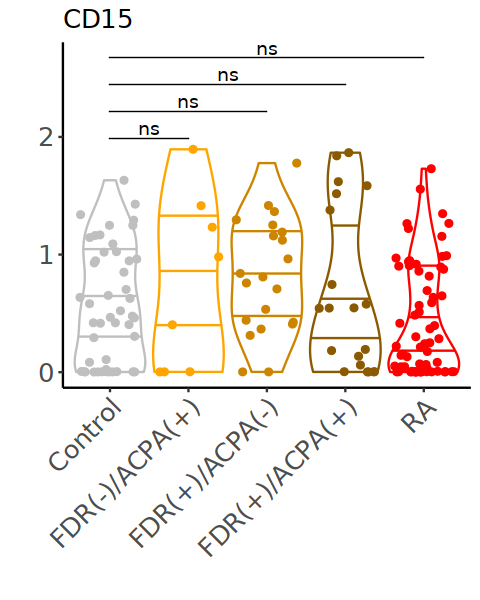

[1] "CD170"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.37
2 FDR(+)/ACPA(+)  1.41
3 FDR(+)/ACPA(-)  1.41
4 FDR(-)/ACPA(+)  1.32
5 RA              1.32


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


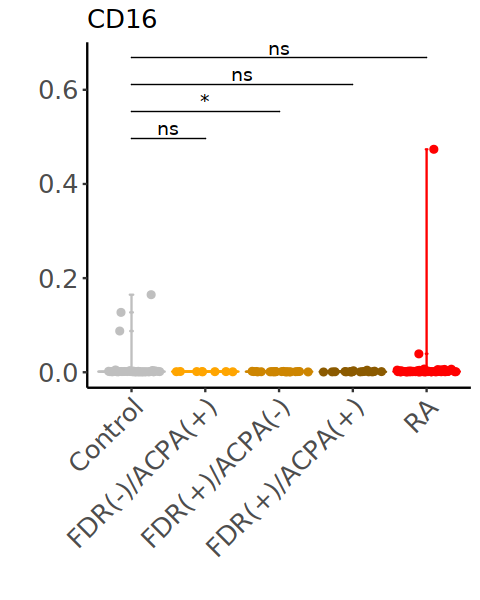

[1] "CD172ab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.35
2 FDR(+)/ACPA(+)  1.42
3 FDR(+)/ACPA(-)  1.48
4 FDR(-)/ACPA(+)  1.46
5 RA              1.46


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


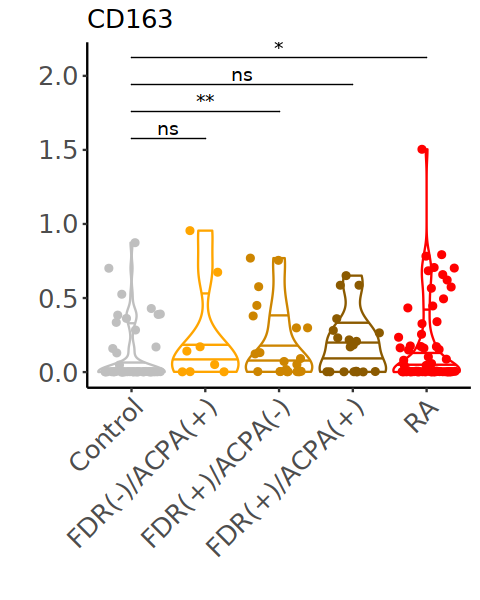

[1] "CD180"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.510
2 FDR(+)/ACPA(+) 0.168
3 FDR(+)/ACPA(-) 0.539
4 FDR(-)/ACPA(+) 0.211
5 RA             0.361


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


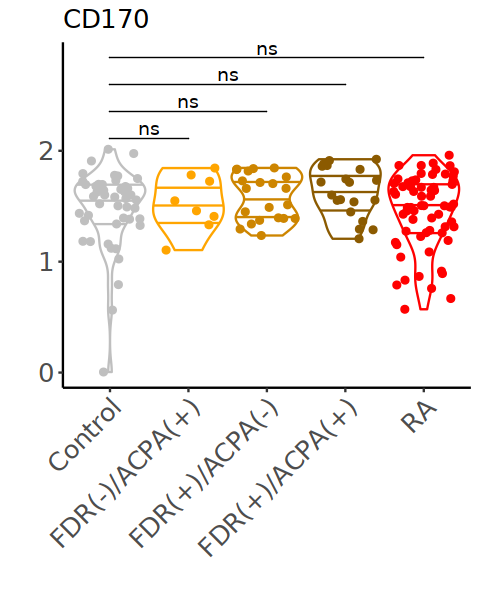

[1] "CD1c"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00107
2 FDR(+)/ACPA(+) 0.00113
3 FDR(+)/ACPA(-) 0.00135
4 FDR(-)/ACPA(+) 0.00134
5 RA             0.00126


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


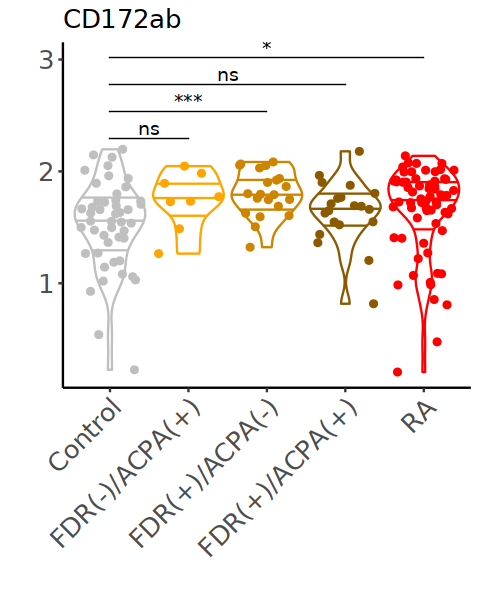

[1] "CD1d"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.13
2 FDR(+)/ACPA(+)  1.21
3 FDR(+)/ACPA(-)  1.21
4 FDR(-)/ACPA(+)  1.07
5 RA              1.18


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


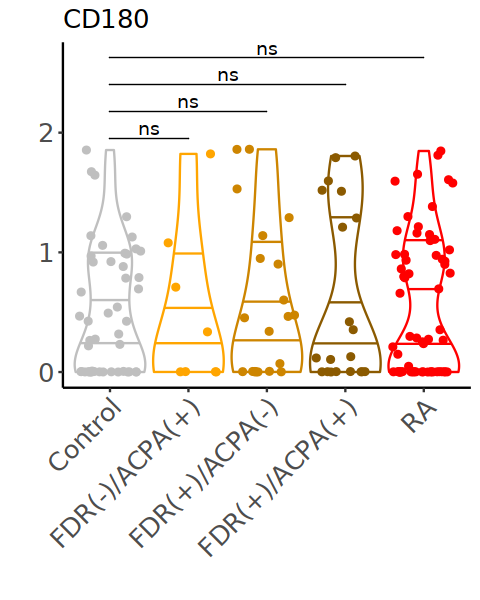

[1] "CD20"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000957
2 FDR(+)/ACPA(+) 0.000976
3 FDR(+)/ACPA(-) 0.00105 
4 FDR(-)/ACPA(+) 0.000959
5 RA             0.00101 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


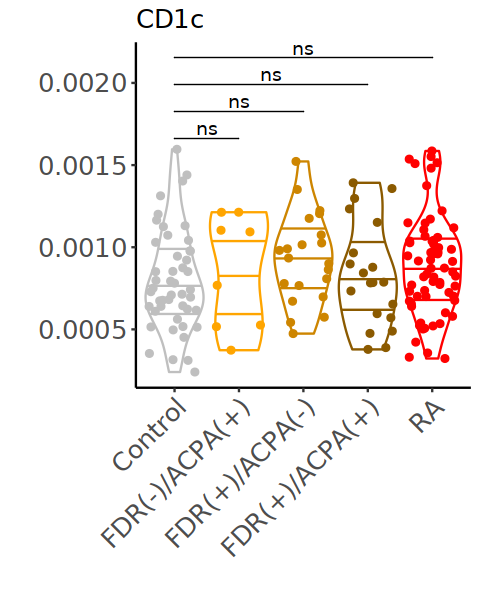

[1] "CD206"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00133
2 FDR(+)/ACPA(+) 0.00167
3 FDR(+)/ACPA(-) 0.00164
4 FDR(-)/ACPA(+) 0.00182
5 RA             0.00157


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


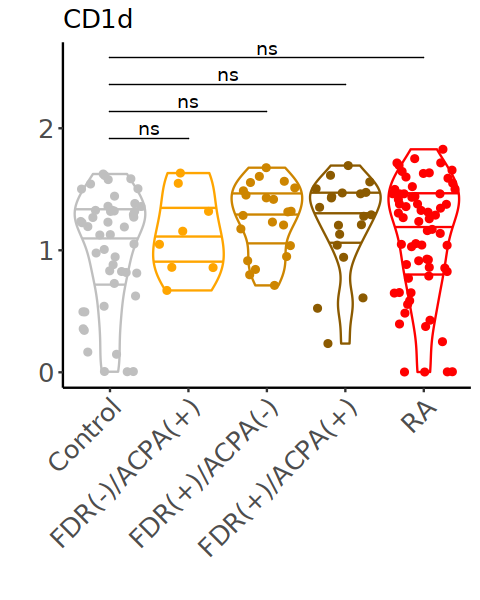

[1] "CD3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.00105 
2 FDR(+)/ACPA(+) 0.00115 
3 FDR(+)/ACPA(-) 0.00122 
4 FDR(-)/ACPA(+) 0.00102 
5 RA             0.000994


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


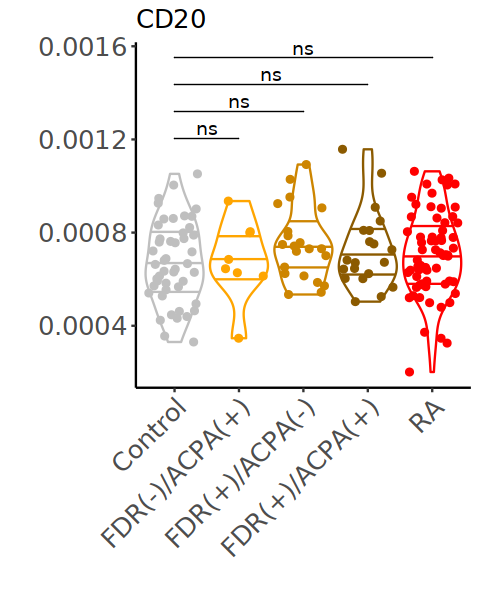

[1] "CD303"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000607
2 FDR(+)/ACPA(+) 0.000630
3 FDR(+)/ACPA(-) 0.000698
4 FDR(-)/ACPA(+) 0.000635
5 RA             0.000568


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


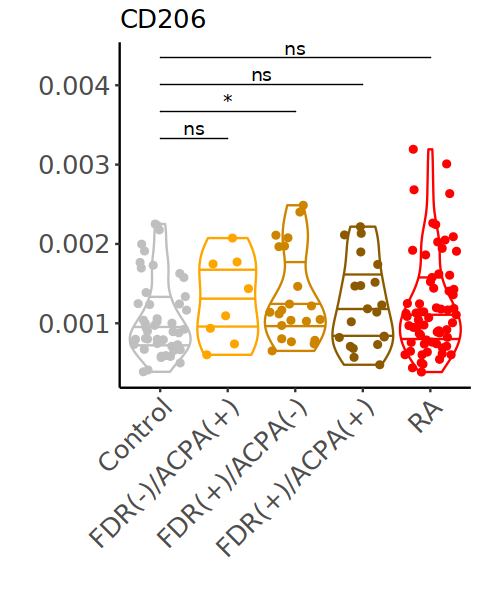

[1] "CD36"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.65
2 FDR(+)/ACPA(+)  1.67
3 FDR(+)/ACPA(-)  1.70
4 FDR(-)/ACPA(+)  1.64
5 RA              1.65


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


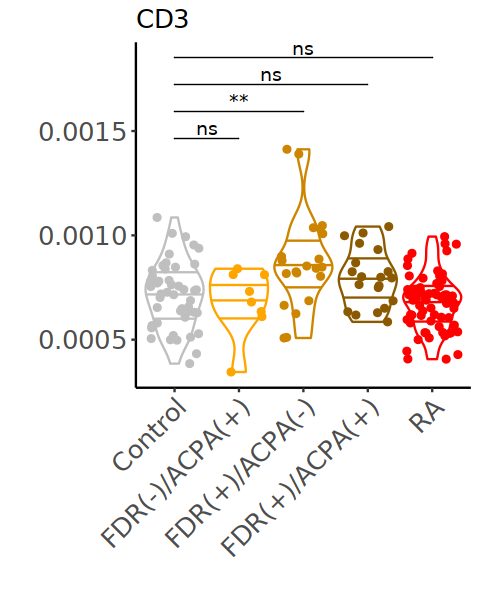

[1] "CD38"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.68
2 FDR(+)/ACPA(+)  1.68
3 FDR(+)/ACPA(-)  1.70
4 FDR(-)/ACPA(+)  1.69
5 RA              1.70


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


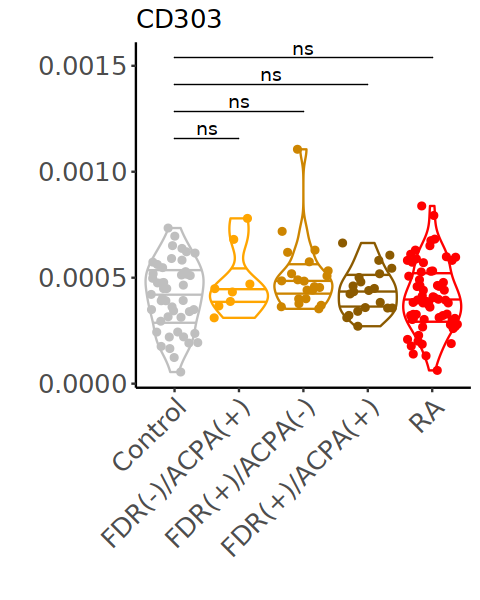

[1] "CD39"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.27
2 FDR(+)/ACPA(+)  1.29
3 FDR(+)/ACPA(-)  1.33
4 FDR(-)/ACPA(+)  1.43
5 RA              1.32


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


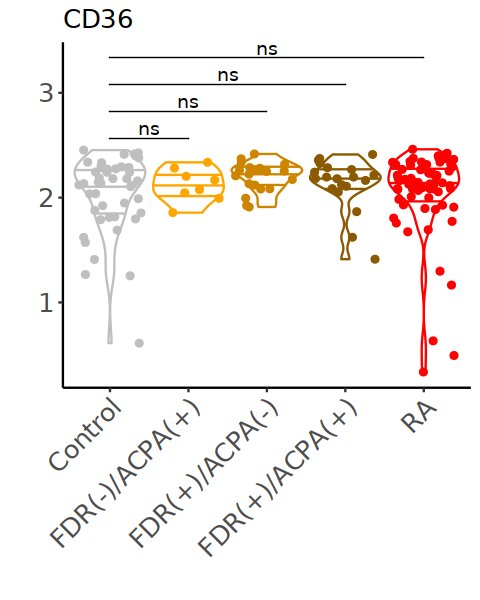

[1] "CD4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.280
2 FDR(+)/ACPA(+) 0.228
3 FDR(+)/ACPA(-) 0.401
4 FDR(-)/ACPA(+) 0.295
5 RA             0.326


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


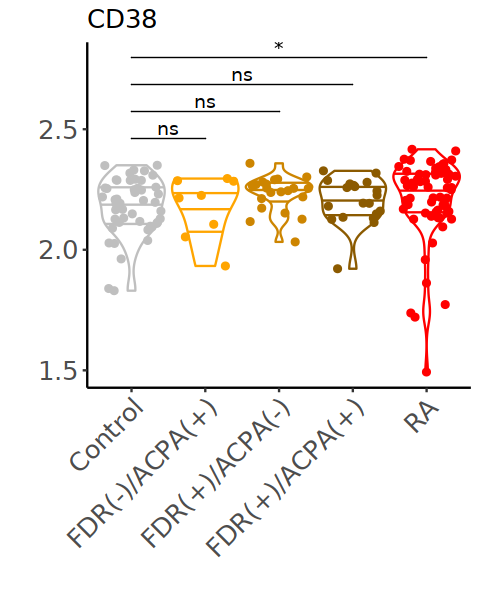

[1] "CD45"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.31
2 FDR(+)/ACPA(+)  1.36
3 FDR(+)/ACPA(-)  1.39
4 FDR(-)/ACPA(+)  1.50
5 RA              1.48


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


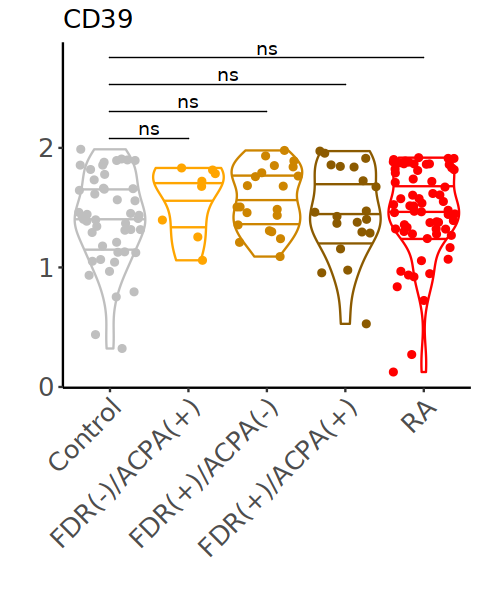

[1] "CD56"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000971
2 FDR(+)/ACPA(+) 0.00105 
3 FDR(+)/ACPA(-) 0.00115 
4 FDR(-)/ACPA(+) 0.00124 
5 RA             0.00105 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


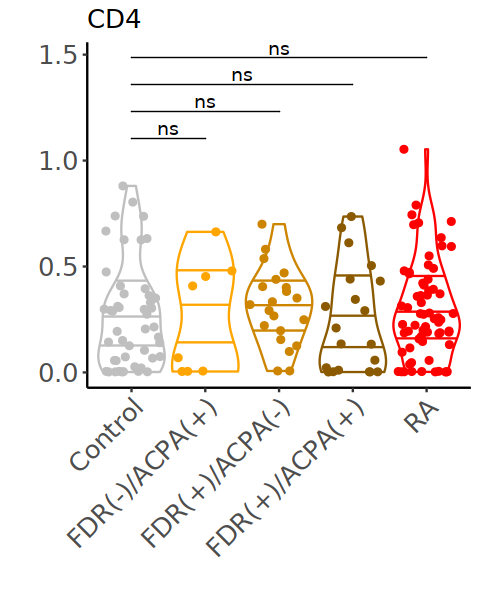

[1] "CD64"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.44
2 FDR(+)/ACPA(+)  1.47
3 FDR(+)/ACPA(-)  1.43
4 FDR(-)/ACPA(+)  1.42
5 RA              1.50


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


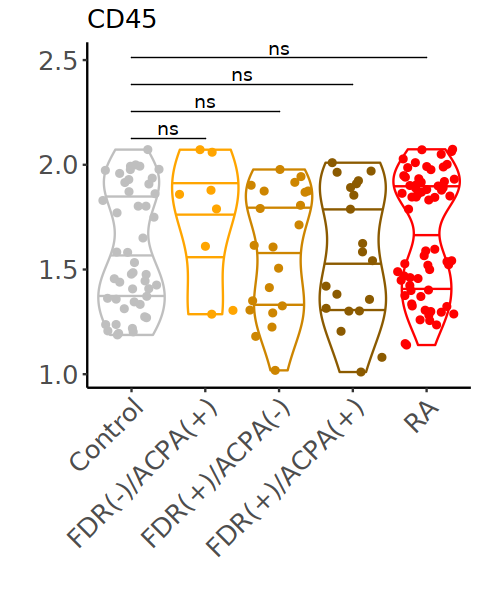

[1] "CD68"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.67
2 FDR(+)/ACPA(+)  1.73
3 FDR(+)/ACPA(-)  1.72
4 FDR(-)/ACPA(+)  1.75
5 RA              1.70


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


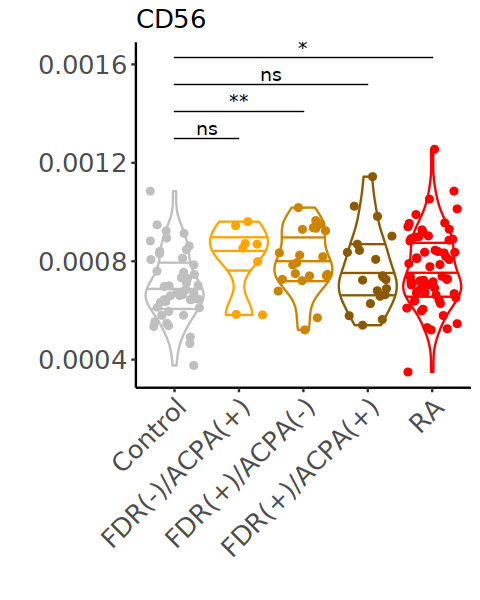

[1] "CD74"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.597
2 FDR(+)/ACPA(+) 0.839
3 FDR(+)/ACPA(-) 0.855
4 FDR(-)/ACPA(+) 1.13 
5 RA             0.727


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


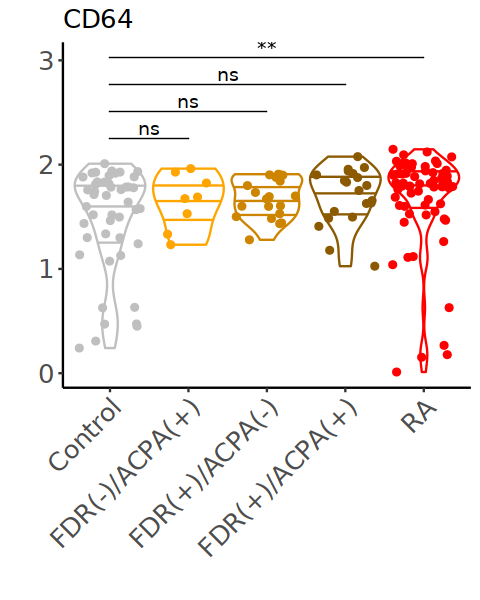

[1] "CD84"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.29
2 FDR(+)/ACPA(+)  1.27
3 FDR(+)/ACPA(-)  1.33
4 FDR(-)/ACPA(+)  1.26
5 RA              1.31


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


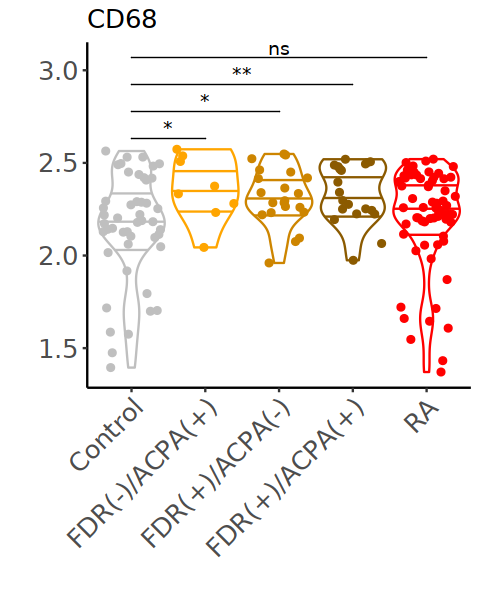

[1] "CD85d"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.29
2 FDR(+)/ACPA(+)  1.36
3 FDR(+)/ACPA(-)  1.33
4 FDR(-)/ACPA(+)  1.36
5 RA              1.35


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


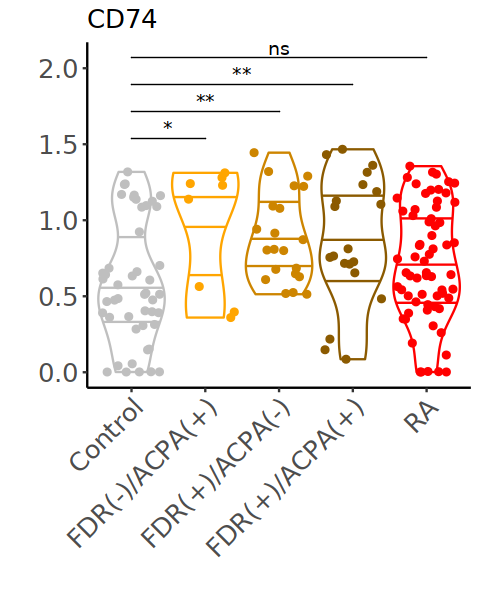

[1] "CD85i"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.24
2 FDR(+)/ACPA(+)  1.25
3 FDR(+)/ACPA(-)  1.23
4 FDR(-)/ACPA(+)  1.32
5 RA              1.34


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


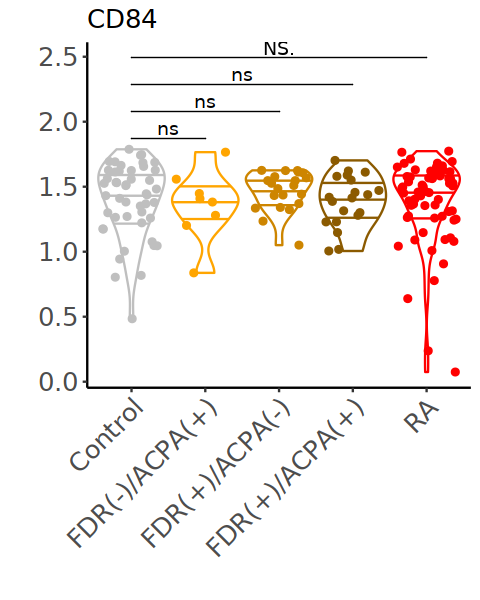

[1] "CD86"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.307
2 FDR(+)/ACPA(+) 0.361
3 FDR(+)/ACPA(-) 0.498
4 FDR(-)/ACPA(+) 0.518
5 RA             0.380


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


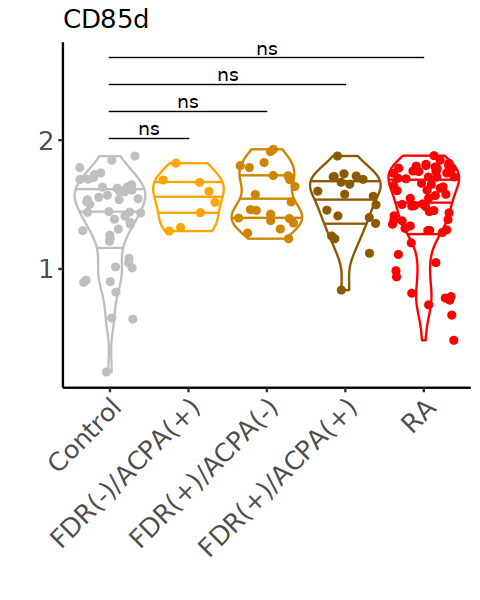

[1] "CD8a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00187
2 FDR(+)/ACPA(+) 0.00263
3 FDR(+)/ACPA(-) 0.00176
4 FDR(-)/ACPA(+) 0.00240
5 RA             0.00163


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


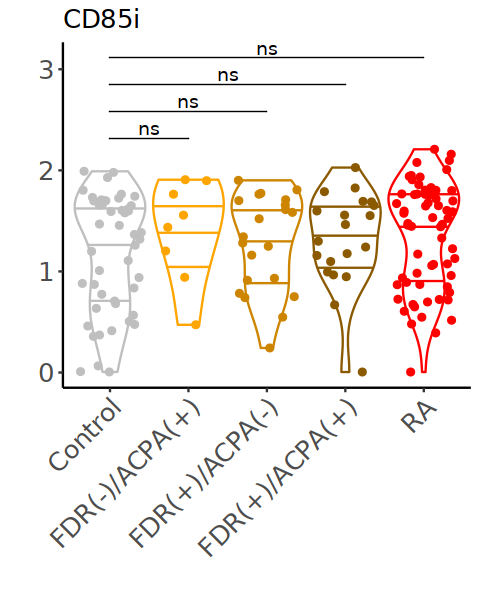

[1] "CLEC9A"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00126
2 FDR(+)/ACPA(+) 0.00103
3 FDR(+)/ACPA(-) 0.00108
4 FDR(-)/ACPA(+) 0.00109
5 RA             0.00120


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


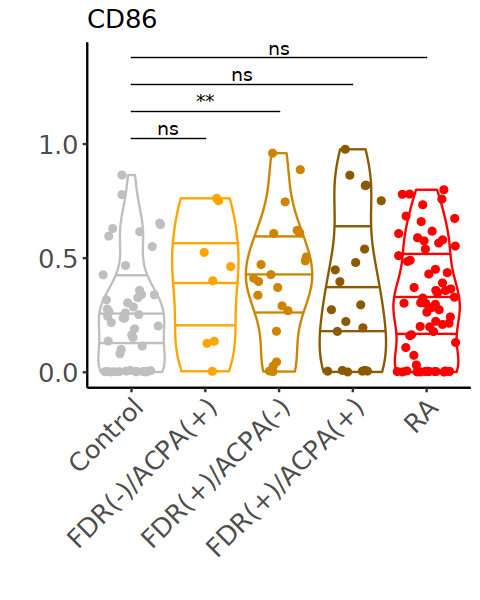

[1] "CX3CR1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.706
2 FDR(+)/ACPA(+) 1.15 
3 FDR(+)/ACPA(-) 1.04 
4 FDR(-)/ACPA(+) 0.969
5 RA             0.781


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


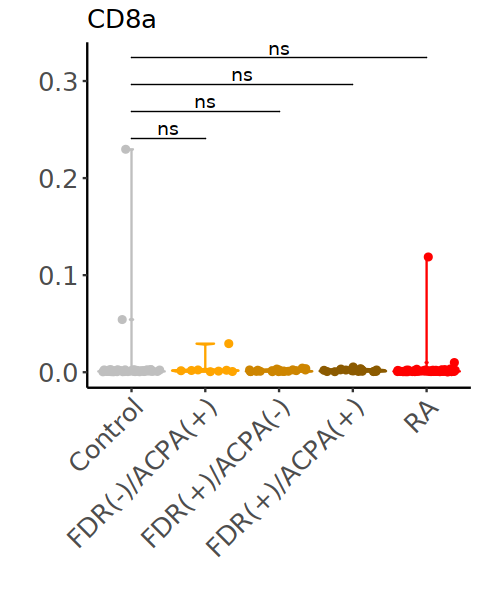

[1] "FOLR2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.0326 
2 FDR(+)/ACPA(+) 0.120  
3 FDR(+)/ACPA(-) 0.284  
4 FDR(-)/ACPA(+) 0.00882
5 RA             0.0420 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


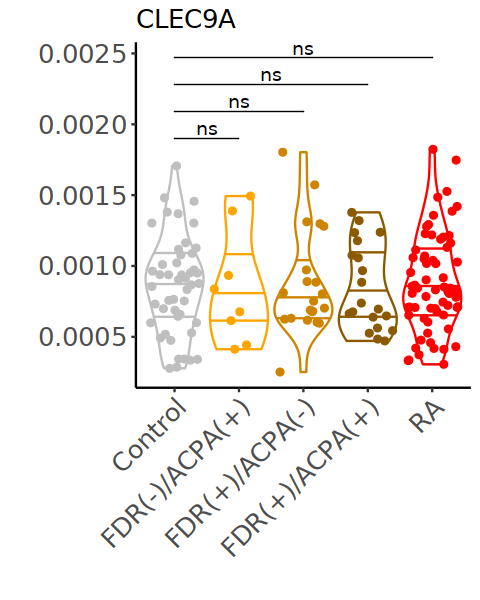

[1] "FPR1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.34
2 FDR(+)/ACPA(+)  1.36
3 FDR(+)/ACPA(-)  1.39
4 FDR(-)/ACPA(+)  1.41
5 RA              1.36


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


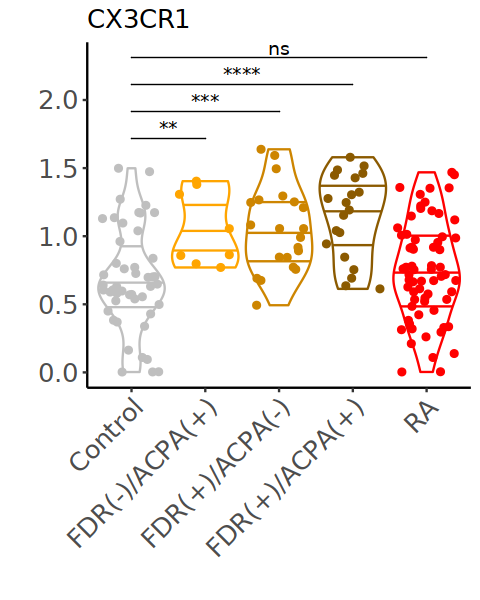

[1] "HLA-DR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.62
2 FDR(+)/ACPA(+)  1.62
3 FDR(+)/ACPA(-)  1.61
4 FDR(-)/ACPA(+)  1.60
5 RA              1.63


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


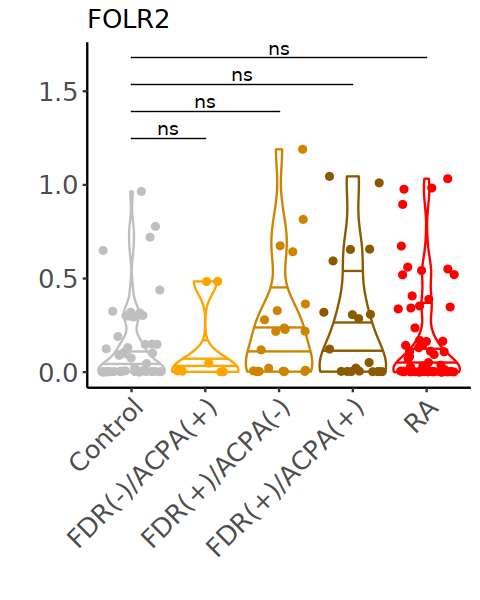

[1] "IRF8"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.16
2 FDR(+)/ACPA(+)  1.25
3 FDR(+)/ACPA(-)  1.26
4 FDR(-)/ACPA(+)  1.20
5 RA              1.26


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


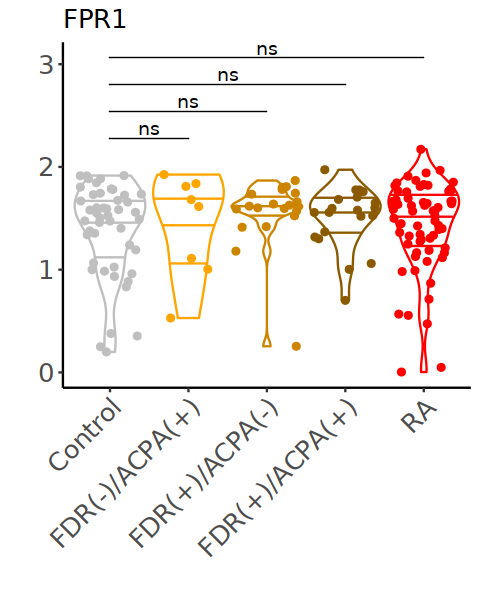

[1] "Ki67"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.994
2 FDR(+)/ACPA(+) 1.14 
3 FDR(+)/ACPA(-) 1.23 
4 FDR(-)/ACPA(+) 1.04 
5 RA             1.27 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


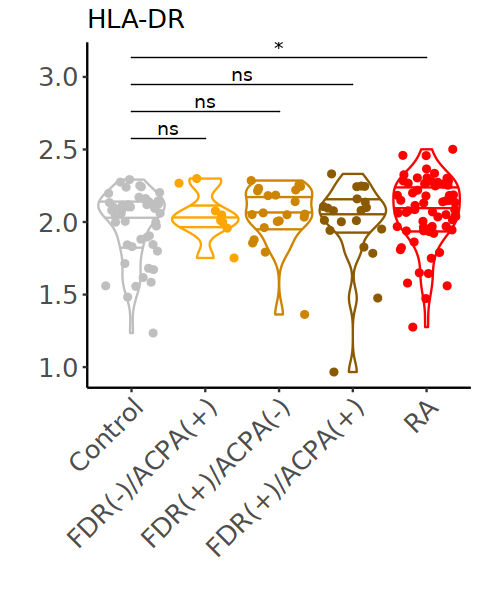

[1] "MARCO"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00108
2 FDR(+)/ACPA(+) 0.00139
3 FDR(+)/ACPA(-) 0.00134
4 FDR(-)/ACPA(+) 0.00149
5 RA             0.00130


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


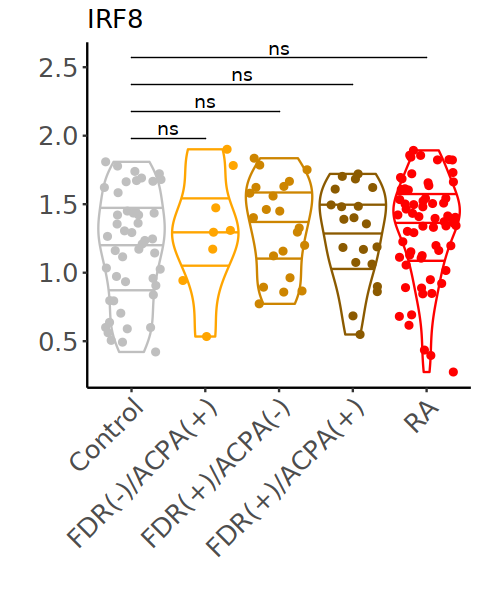

[1] "PD-L1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00256
2 FDR(+)/ACPA(+) 0.00265
3 FDR(+)/ACPA(-) 0.00240
4 FDR(-)/ACPA(+) 0.00288
5 RA             0.00298


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


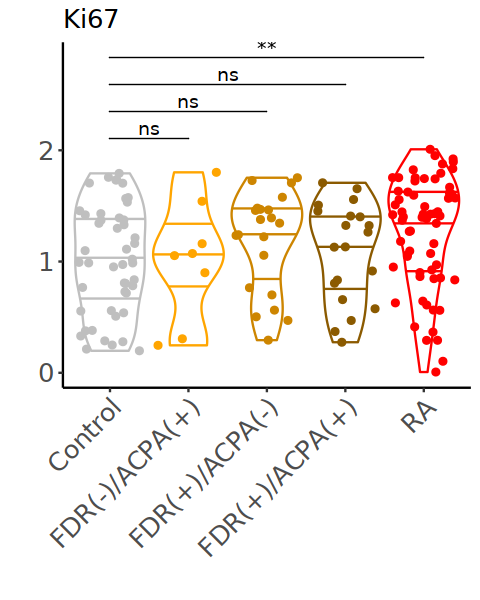

[1] "Siglec-1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000934
2 FDR(+)/ACPA(+) 0.000918
3 FDR(+)/ACPA(-) 0.00102 
4 FDR(-)/ACPA(+) 0.000832
5 RA             0.00128 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


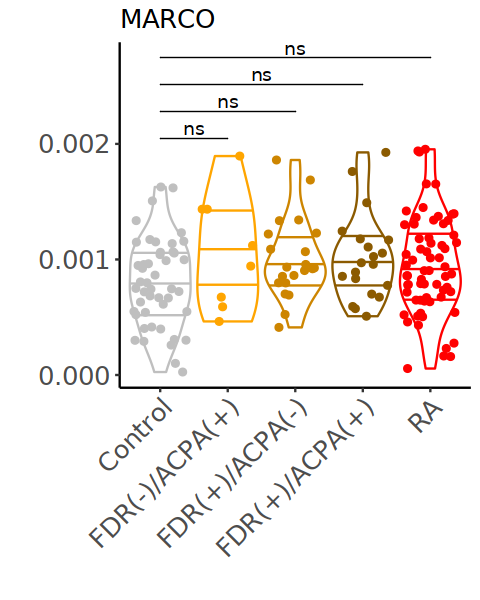

[1] "Siglec-6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000225
2 FDR(+)/ACPA(+) 0.000210
3 FDR(+)/ACPA(-) 0.000231
4 FDR(-)/ACPA(+) 0.000229
5 RA             0.000220


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


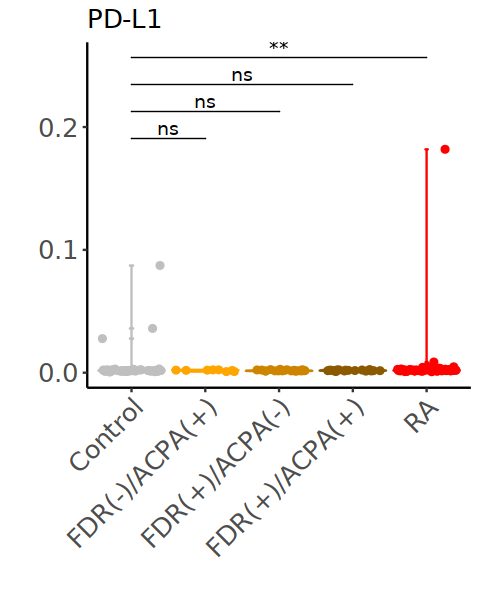

[1] "TLR4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00107
2 FDR(+)/ACPA(+) 0.00122
3 FDR(+)/ACPA(-) 0.00124
4 FDR(-)/ACPA(+) 0.00113
5 RA             0.00117


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


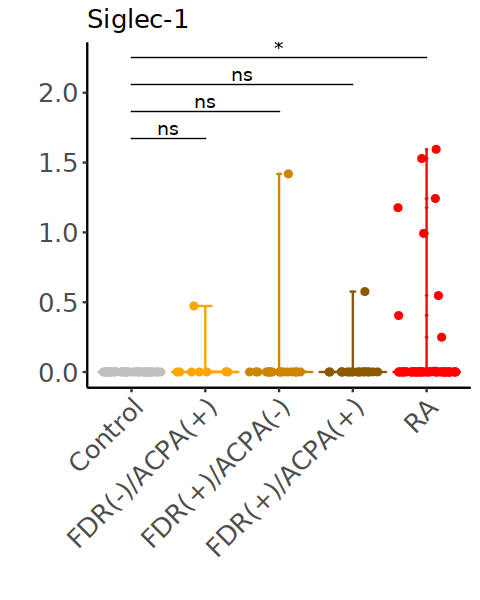

[1] "TLR9"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00236
2 FDR(+)/ACPA(+) 0.00267
3 FDR(+)/ACPA(-) 0.00251
4 FDR(-)/ACPA(+) 0.00264
5 RA             0.00255


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


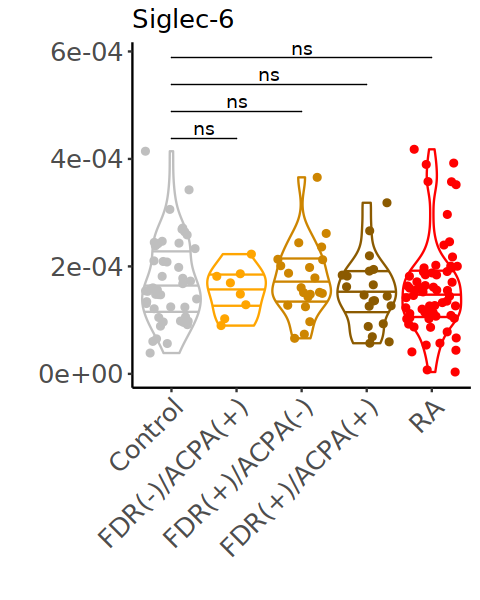

[1] "XCR1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00221
2 FDR(+)/ACPA(+) 0.00433
3 FDR(+)/ACPA(-) 0.00373
4 FDR(-)/ACPA(+) 0.00534
5 RA             0.00349


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


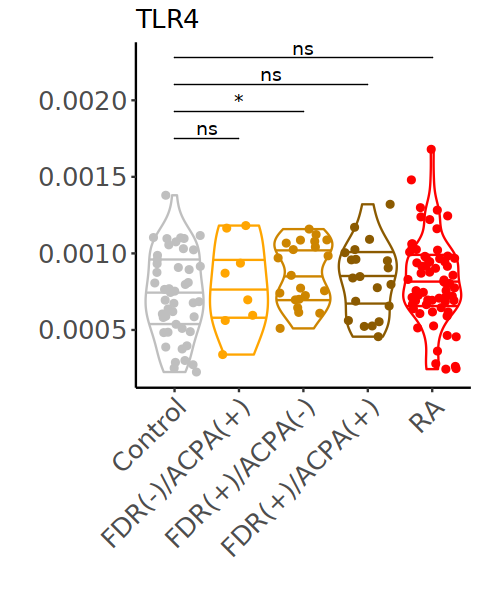

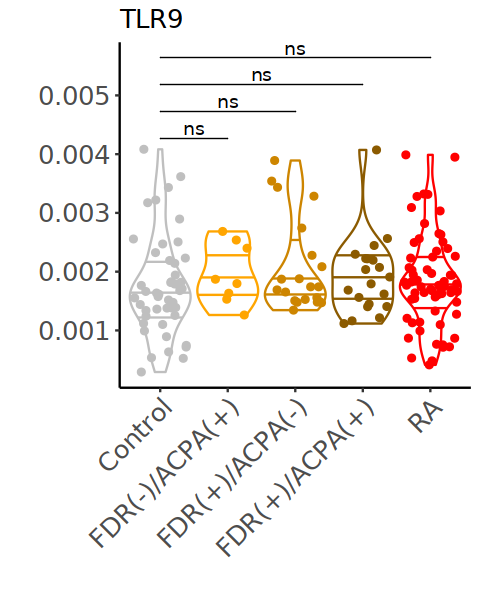

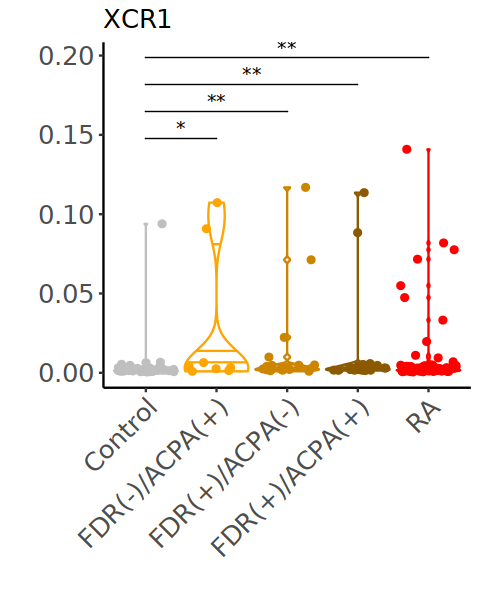

In [29]:
options(repr.plot.height = 5, repr.plot.width = 4)
for (gene in markers){
  print(gene)
  
  data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, AtRisk = umap_res$AtRisk) %>% 
    dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
    dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
    dplyr::group_by(subject_id, AtRisk) %>%
    dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
    dplyr::group_by(AtRisk) %>%
    dplyr::summarize(med = quantile(log2(med+1), probs = c(0.5))) %>% print()
  plot(
    data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, AtRisk = umap_res$AtRisk) %>% 
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
      dplyr::group_by(subject_id, AtRisk) %>%
      dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
      as.data.frame() %>%
      dplyr::mutate(AtRisk = factor(AtRisk,levels = c("Control","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)","FDR(+)/ACPA(+)","RA"))) %>%
      ggplot(., aes(x = AtRisk, y=med, fill = AtRisk, color = AtRisk)) + 
      geom_violin(aes(color = AtRisk), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
      geom_jitter(aes(fill = AtRisk, color = AtRisk)) +
      ggpubr::stat_compare_means(
        comparisons = list(c("Control", "FDR(-)/ACPA(+)"), c("Control", "FDR(+)/ACPA(-)"), c("Control", "FDR(+)/ACPA(+)"), c("Control", "RA")),
        label = "p.signif",
        tip.length = 0
      ) +
      scale_fill_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) +
      scale_color_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) + 
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
            strip.text.y=element_text(size=15, color="black", face="bold"),
            legend.position = "none",
            plot.title = element_text(size=15),
            axis.title.x = element_text(size=15),
            axis.title.y = element_text(size =15),
            axis.text.y = element_text(size = 15),
            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
            legend.text =  element_text(size = 15),
            legend.key.size = grid::unit(0.5, "lines"),
            legend.title = element_text(size = 0.8, hjust = 0)) +
      labs(title = gene,
           x = "",
           y = "") 
  )
  
}




In [25]:
# CNA; covarying neighborhood analysis

In [30]:
obj = readRDS(paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/SeuratObj_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
obj@meta.data$subject_id <- stringr::str_split(obj@meta.data$OmiqFileIndex, pattern="_", simplify=TRUE)[,3] %>% 
                                    stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
                                    as.data.frame() %>%
                                    .[,1] %>%
                                    gsub("-","_",.)

umap_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/umap_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# remove clusters less than cut off
min_cell_cluster = 30
clu = umap_res %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::arrange(count) %>%
    dplyr::filter(count > min_cell_cluster) %>%
    .$res_cell %>%
    unique()
clu_logi = umap_res$res_cell %in% clu
umap_res = umap_res[clu_logi,]

# Find cluster center
cluster_center <- umap_res %>%
  dplyr::group_by(res_cell) %>%
  dplyr::summarise_at(vars(UMAP1, UMAP2), dplyr::funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)
cluster_center$res_cell <- as.character(cluster_center$res_cell)

Loading required package: SeuratObject

Attaching sp



In [31]:
# meta data

batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/meta_Prop",prop,"_Nmin",n_min,".rds"))
batch_fl$subject_id <- stringr::str_split(batch_fl$OmiqFileIndex, pattern="_", simplify=TRUE)[,3] %>% 
  stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
  as.data.frame() %>%
  .[,1] %>%
  gsub("-","_",.)
batch_fl = batch_fl[clu_logi,]
umap_res$subject_id = batch_fl$subject_id
umap_res$time_point = batch_fl$time_point
all(umap_res$subject_id == obj@meta.data$subject_id)

meta<- read.table("/projects/jinamo@xsede.org/cytof/data/RA_AtRiskRA_Control_meta.txt",sep="\t",header=TRUE, na.strings=c("","NA")) %>%
    dplyr::mutate(age_at_biopsy = as.integer(age_at_biopsy),
                  diagnosis = factor(diagnosis, levels=c("Control","AtRiskRA","RA")))
meta = merge(meta,obj@meta.data,by="subject_id")
meta = meta[order(match(meta$subject_id, obj@meta.data$subject_id)),]
print(head(meta))
print(dim(meta))
table(meta$sex)
table(meta$ethnicity)
table(meta$sex)
table(meta$AMP_Group)
table(meta$CCP)
table(meta$RF)
all(meta$subject_id == obj@meta.data$subject_id)

meta_add = read.table("/projects/jinamo@xsede.org/cytof/data/meta_clinical_RA.txt", header = TRUE, sep = "\t") %>%
  dplyr::mutate(CDAI = as.numeric(CDAI),
                subject_id = gsub("-","_",subject_id),
                treatment = dplyr::case_when(
                  treatment == "1" ~ "naive",
                  treatment == "2" ~ "MTX failure",
                  treatment == "3" ~ "TNF failure",
                  treatment == "4" ~ "OA"
                )) %>%
  dplyr::select(-c(sex))
meta_add = dplyr::left_join(obj@meta.data[,!grepl("CDAI",colnames(obj@meta.data))],meta_add,by="subject_id")

meta_add2 = read.table("/projects/jinamo@xsede.org/cytof/data/clinical_data_for_FAN_from_Kat.txt", header = TRUE, sep = "\t") %>%
  dplyr::select(-c(sex))
meta_add2 = dplyr::left_join(obj@meta.data[,!grepl("CDAI",colnames(obj@meta.data))],meta_add2,by="subject_id")

meta_add3 = read.table("/projects/jinamo@xsede.org/cytof/data/RA_Cleaned_aggregate_vars.txt", header = TRUE, sep = "\t") %>%
  dplyr::select(c(subject_id,HAQ,das28_crp3,bmi,ra_group,pathotype_str,sdai,ccp_type,ccp_range,rf_range,mdtjc28_sum,mdsjc28_sum,diabetes,Race_white,Race_black,Race_multiple,Race_other,MTX,SSZ,HCQ,LEF,TNFi))
meta_add3 = dplyr::left_join(obj@meta.data,meta_add3,by="subject_id")


[1] TRUE

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”


  subject_id age_at_biopsy    sex    ethnicity diagnosis collection_method ctap
1   200_0272            28 female not_hispanic   Control              <NA> <NA>
2   200_0272            28 female not_hispanic   Control              <NA> <NA>
3   200_0272            28 female not_hispanic   Control              <NA> <NA>
4   200_0272            28 female not_hispanic   Control              <NA> <NA>
5   200_0272            28 female not_hispanic   Control              <NA> <NA>
6   200_0272            28 female not_hispanic   Control              <NA> <NA>
  AMP_Group  CCP   RF CCP30_titer CCP31_titer RF_IgM_titer RF_IgG_titer
1      <NA> <NA> <NA>          NA          NA           NA           NA
2      <NA> <NA> <NA>          NA          NA           NA           NA
3      <NA> <NA> <NA>          NA          NA           NA           NA
4      <NA> <NA> <NA>          NA          NA           NA           NA
5      <NA> <NA> <NA>          NA          NA           NA           NA
6      <


 female    male 
1329122  556715 


hispanic_latino    not_hispanic 
         311923         1563914 


 female    male 
1329122  556715 


   FDR     GP 
383684 128358 


Negative Positive 
  253274   258768 


Negative Positive 
  415236    96806 

[1] TRUE

In [32]:
# merge meta data to Seurat object
obj@meta.data$AtRisk = dplyr::case_when(
  meta$AMP_Group == "FDR" & meta$CCP == "Positive" ~ "FDR(+)/ACPA(+)",
  meta$AMP_Group == "GP" & meta$CCP == "Positive" ~ "FDR(-)/ACPA(+)",
  meta$AMP_Group == "FDR" & meta$CCP == "Negative" ~ "FDR(+)/ACPA(-)",
  meta$AMP_Group == "GP" & meta$CCP == "Negative" ~ "FDR(-)/ACPA(-)",
  obj@meta.data$disease == "Control" ~ "Control",
  obj@meta.data$disease == "RA" ~ "RA")
obj@meta.data$age_at_biopsy <- as.numeric(meta$age_at_biopsy)
obj@meta.data$sex <- as.numeric(factor(meta$sex, c('female', 'male')))
obj@meta.data$ethnicity <- as.numeric(factor(meta$ethnicity, c('not_hispanic', 'hispanic_latino')))
obj@meta.data$AMP_Group <- as.numeric(factor(meta$AMP_Group, c('GP', 'FDR')))
obj@meta.data$CCP <- as.numeric(factor(meta$CCP, c('Negative', 'Positive')))
obj@meta.data$CCP30_titer <- as.numeric(meta$CCP30_titer)
obj@meta.data$CCP31_titer <- as.numeric(meta$CCP31_titer)
obj@meta.data$RF <- as.numeric(factor(meta$RF, c('Negative', 'Positive')))
obj@meta.data$RF_IgM_titer <- as.numeric(meta$RF_IgM_titer)
obj@meta.data$RF_IgG_titer <- as.numeric(meta$RF_IgG_titer)
obj@meta.data$RF_IgA_titer <- as.numeric(meta$RF_IgA_titer)
obj@meta.data$batch <- as.numeric(factor(meta$batch))
obj@meta.data$AtRisk = factor(obj@meta.data$AtRisk,levels=c("Control","FDR(+)/ACPA(+)","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)","FDR(-)/ACPA(-)","RA"))
obj@meta.data$alt_AtRisk = dplyr::case_when(
  obj@meta.data$AtRisk == "FDR(-)/ACPA(-)" ~ "FDR(-)/ACPA(-)",
  obj@meta.data$AtRisk == "FDR(+)/ACPA(-)" | obj@meta.data$AtRisk == "FDR(-)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(+)/ACPA(+)" ~ "AtRiskRA",
  TRUE ~ "others")
obj@meta.data$ctap <- dplyr::case_when(
  meta$diagnosis == "AtRiskRA" ~ "AtRiskRA",
  meta$diagnosis == "Control" ~ "Control")
obj@meta.data$ctap <- ifelse(is.na(obj@meta.data$ctap),meta$ctap,obj@meta.data$ctap)
obj@meta.data$CDAI <- as.numeric(meta_add$CDAI)
obj@meta.data$krenn_lining <- as.numeric(meta_add$krenn_lining)
obj@meta.data$krenn_inflammation <- as.numeric(meta_add$krenn_inflammation)
obj@meta.data$treatment <- dplyr::case_when(
  meta$diagnosis == "AtRiskRA" ~ "AtRiskRA",
  meta$diagnosis == "Control" ~ "Control")
obj@meta.data$treatment <- ifelse(is.na(obj@meta.data$treatment),meta_add$treatment,obj@meta.data$treatment)
obj@meta.data$disease = dplyr::case_when(
  obj@meta.data$AtRisk == "FDR(+)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(-)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(+)/ACPA(-)" ~ "AtRiskRA",
  obj@meta.data$AtRisk == "Control" | obj@meta.data$AtRisk == "FDR(-)/ACPA(-)" ~ "Control",
  obj@meta.data$AtRisk == "RA" ~ "RA")
obj@meta.data$condition = obj@meta.data$disease
obj@meta.data$condition = factor(obj@meta.data$condition, levels = c('Control', 'AtRiskRA', "RA"))

obj@meta.data$CRP <- as.numeric(meta_add2$crp_result)
obj@meta.data$ESR <- as.numeric(meta_add2$esr_result)
obj@meta.data$RA_duration_years <- as.numeric(meta_add2$RA_duration_years)
obj@meta.data$CDAI <- ifelse(is.na(obj@meta.data$CDAI), as.numeric(meta_add2$cdai), obj@meta.data$CDAI)
obj@meta.data$SDAI <- as.numeric(meta_add3$sdai)
obj@meta.data$DAS28_ESR <- as.numeric(meta_add2$das28_esr3)
obj@meta.data$DAS28_CRP <- as.numeric(meta_add3$das28_crp3)
obj@meta.data$CCP31_titer <- ifelse(obj@meta.data$condition == "RA", as.numeric(meta_add2$ccp_result), obj@meta.data$CCP31_titer)
obj@meta.data$CCP31_cutoff <- as.numeric(meta_add3$ccp_range)
obj@meta.data$RF_IgM_titer <- ifelse(obj@meta.data$condition == "RA", as.numeric(meta_add2$rf_result), obj@meta.data$RF_IgM_titer)
obj@meta.data$RF_IgM_cutoff <- as.numeric(meta_add3$rf_range)
obj@meta.data$smoke_hx <- as.factor(meta_add2$smoke_hx)
obj@meta.data$smoke_current <- as.factor(meta_add2$smoke_current)
obj@meta.data$Methotrexate_only <- meta_add2$Methotrexate_only
obj@meta.data$TNFi_possible_nbDMARD <- meta_add2$TNFi_possible_nbDMARD
obj@meta.data$other_bDMARD <- meta_add2$other_bDMARD
obj@meta.data$other_nbDMARD_no_bDMARD <- meta_add2$other_nbDMARD_no_bDMARD
obj@meta.data$no_DMARD <- meta_add2$no_DMARD
obj@meta.data$bDMARD <- meta_add2$bDMARD
obj@meta.data$nbDMARD <- meta_add2$nbDMARD
obj@meta.data$Prednisone <- meta_add2$Prednisone
obj@meta.data$Prednisone_GE_7.5 <- ifelse(obj@meta.data$Prednisone, meta_add2$Prednisone_GE_7.5, FALSE)

obj@meta.data$time_point <- batch_fl$time_point

In [33]:
# Control vs AtRiskRA 
logi = obj$condition %in% c("Control","AtRiskRA")
obj_sub = readRDS(paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/SeuratObj_Control_AtRiskRA_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))


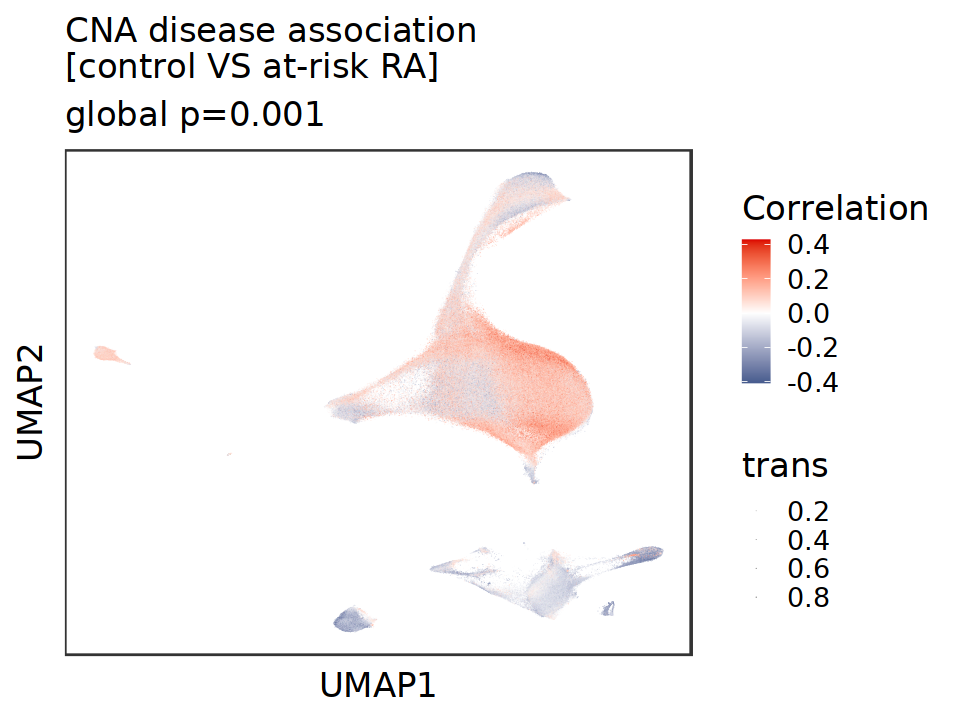

In [34]:
# positive correlation means association with at-risk RA
options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab"  ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS at-risk RA]', 
         color = 'Correlation',
         subtitle = sprintf('global p=%0.3f', obj_sub@reductions$cna@misc$p)
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


,cluster,size,model.pvalue,conditionAtRiskRA.OR,conditionAtRiskRA.OR.95pct.ci.lower,conditionAtRiskRA.OR.95pct.ci.upper
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cluster0,cluster0,285148,5.990201e-03,1.296259e+00,1.1791250,1.4250282
cluster1,cluster1,236517,2.977329e-01,1.065868e+00,0.9851561,1.1531914
cluster10,cluster10,16265,1.067559e-05,4.263865e-01,0.3542190,0.5132572
cluster11,cluster11,6460,4.218516e-01,1.183306e+00,0.9091410,1.5401509
cluster12,cluster12,4835,1.000000e+00,2.550187e+00,0.1438879,45.1980422
cluster13,cluster13,2994,2.398821e-01,7.428439e-01,0.5017520,1.0997803
cluster14,cluster14,2631,1.287024e-02,2.321568e-08,0.0000000,Inf
cluster15,cluster15,1717,4.833680e-01,1.101111e+00,0.8586906,1.4119704
cluster2,cluster2,105923,6.946101e-01,1.051815e+00,0.8946407,1.2366011


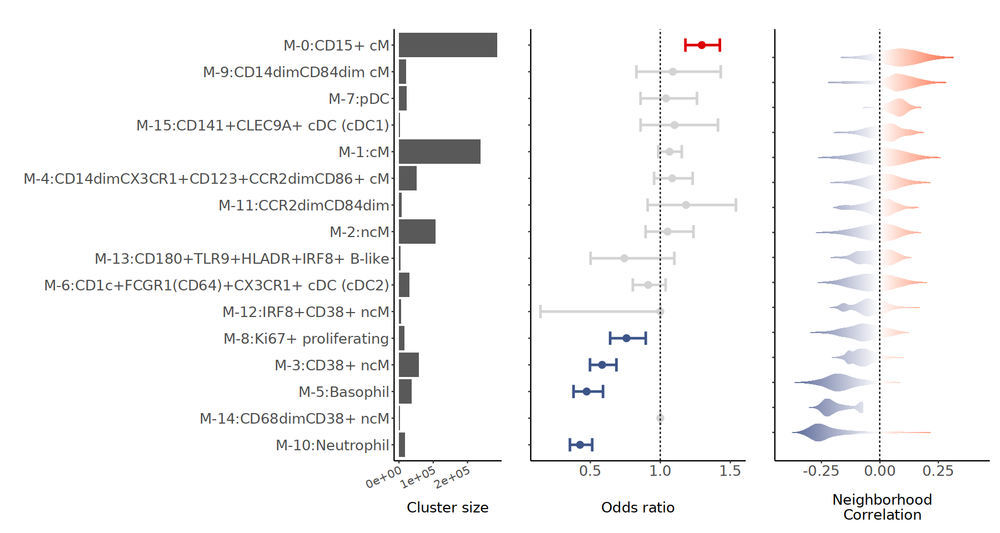

In [35]:
cor_pos = obj_sub@meta.data$cna_ncorrs_fdr05
cor_pos = cor_pos[cor_pos > 0]
# summary(cor_pos)
cor_neg = obj_sub@meta.data$cna_ncorrs_fdr05
cor_neg = cor_neg[cor_neg < 0]
# summary(cor_neg)

ord = cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$res_cell

p <- cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::mutate(res_cell = factor(res_cell,levels=ord)) %>%
    ggplot(aes(x=res_cell, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width")

mywidth <- .35 # bit of trial and error
# This is all you need for the fill: 
vl_fill <- data.frame(ggplot_build(p)$data) %>%
  mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 

# Bit convoluted for the outline, need to be rearranged: the order matters
vl_poly <- 
  vl_fill %>% 
  select(xnew, xend, y, group) %>%
  pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
  arrange(y) %>%
  split(., .$oldx) %>%
  map(., function(x) {
    if(all(x$oldx == "xnew")) x <- arrange(x, desc(y))
    x
    }) %>%
  bind_rows()


if (length(cor_pos)!=0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +   
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)!=0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_pos)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_neg)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  }

# MASC: Mixed-effects association testing for single cells
## Sci Transl Med. 2018 Oct 17;10(463):eaaq0305.

masc = readRDS(file = paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/MASC_Control_AtRiskRA_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
masc
g2 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>10, 1, CIupper),
                 CIlower = ifelse(CIlower<0.1, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=OR, colour=col)) + 
  geom_point(position=position_dodge(width=0.3), size=3) +
  geom_errorbarh(aes(xmin=CIlower, xmax=CIupper), position = position_dodge(0.3), height=0.5, linewidth = 1) +
  scale_color_manual(values = c('#3C5488FF' = '#3C5488FF', '#DC0000FF' = '#DC0000FF', "lightgray" = "lightgray")) + 
  scale_y_discrete(labels=cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[ord,] %>% .$clu_name) +
  scale_x_continuous(breaks=seq(0, 2, 0.5)) + 
  geom_vline(xintercept=1, linetype='dashed', color='black') +
  theme_classic() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_blank(),
        axis.text.x = element_text(size = 15),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "",
       y = "",
       x = "Odds ratio")

g3 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=size)) + 
  geom_bar(stat = "identity", position=position_dodge()) + 
  scale_y_discrete(labels=paste0("M-",
                                 cluster_df %>%
                                   magrittr::set_rownames(cluster_df$cluster) %>%
                                   .[ord,] %>% .$cluster,
                                 ":",
                                 cluster_df %>%
                                   magrittr::set_rownames(cluster_df$cluster) %>%
                                   .[ord,] %>% .$clu_name)
  ) +
  theme_classic() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_text(size = 15),
        axis.text.x = element_text(size = 12, angle = 25, hjust = 1),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "",
       y = "",
       x = "Cluster size")
options(repr.plot.height = 8, repr.plot.width = 15)
(g3+g2+g1)+plot_layout(widths = c(1,2,2))

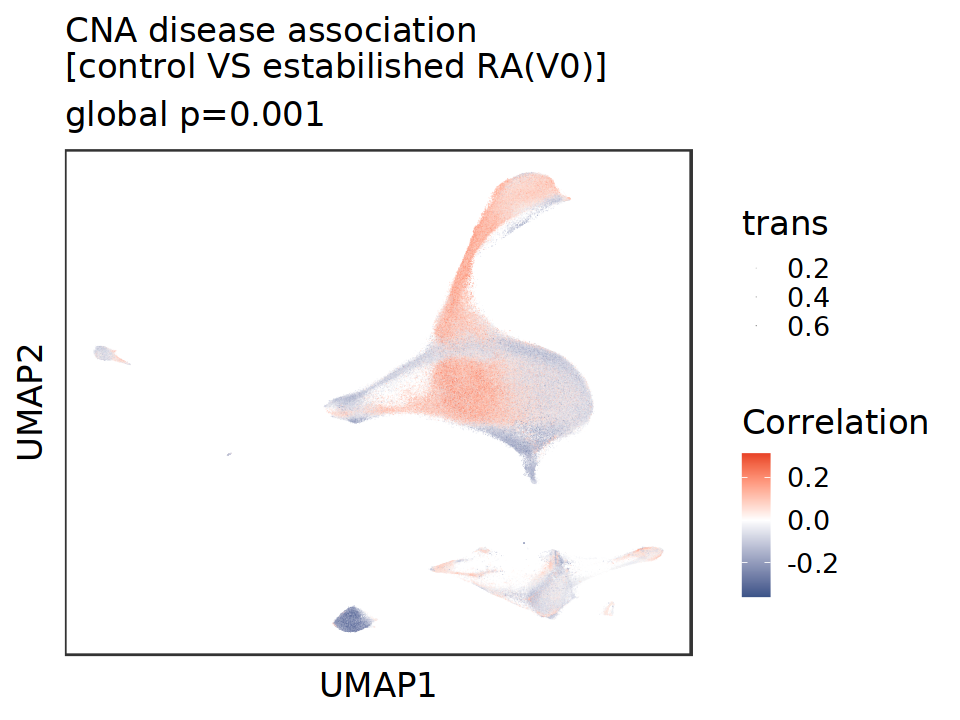

In [36]:
# Control vs RA(V0)

logi = (obj$condition %in% c("RA","Control")) & (obj$time_point == "V0")
obj_sub = readRDS(paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/SeuratObj_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# positive correlation means association with estabilished RA
options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab"  ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS estabilished RA(V0)]', 
         color = 'Correlation',
         subtitle = sprintf('global p=%0.3f', obj_sub@reductions$cna@misc$p)
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )


,cluster,size,model.pvalue,conditionRA.OR,conditionRA.OR.95pct.ci.lower,conditionRA.OR.95pct.ci.upper
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cluster0,cluster0,279184,0.841837973,0.9816931,0.8779620,1.0976801
cluster1,cluster1,273527,0.137454680,1.1153568,1.0033299,1.2398922
cluster10,cluster10,26149,0.259024979,0.7666582,0.4822351,1.2188346
cluster11,cluster11,7201,0.743087917,0.9217660,0.6652964,1.2771038
cluster12,cluster12,4246,1.000000000,1.3504843,1.3499974,1.3509713
cluster13,cluster13,4214,0.245841881,0.7247302,0.5387128,0.9749792
cluster14,cluster14,5469,0.980824070,0.9908006,0.5877682,1.6701921
cluster15,cluster15,1662,0.004049557,0.6685570,0.5196191,0.8601848
cluster2,cluster2,130560,0.224544530,1.1757596,0.9480858,1.4581071


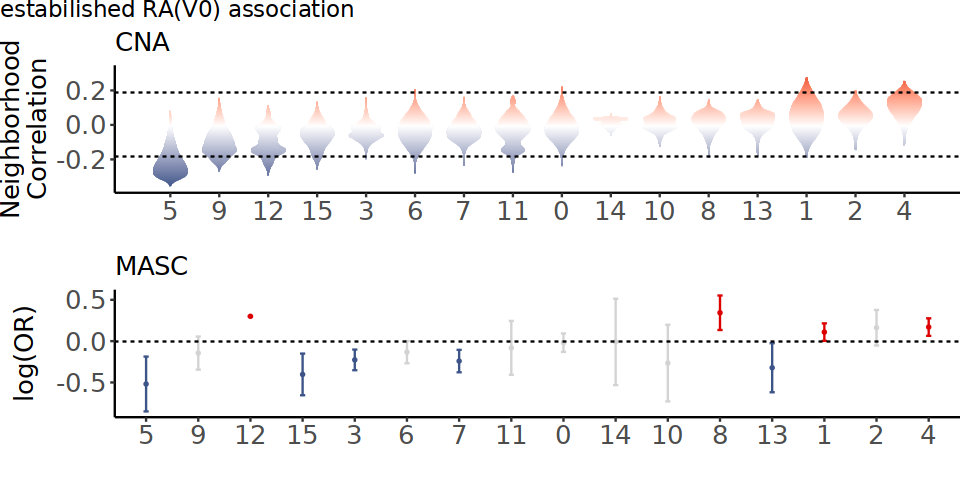

In [37]:
cor_pos = obj_sub@meta.data$cna_ncorrs_fdr05
cor_pos = cor_pos[cor_pos > 0]
# summary(cor_pos)
cor_neg = obj_sub@meta.data$cna_ncorrs_fdr05
cor_neg = cor_neg[cor_neg < 0]
# summary(cor_neg)

ord = cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$res_cell

p <- cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::mutate(res_cell = factor(res_cell,levels=ord)) %>%
    ggplot(aes(x=res_cell, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width")

mywidth <- .35 # bit of trial and error
# This is all you need for the fill: 
vl_fill <- data.frame(ggplot_build(p)$data) %>%
  mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 

# Bit convoluted for the outline, need to be rearranged: the order matters
vl_poly <- 
  vl_fill %>% 
  select(xnew, xend, y, group) %>%
  pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
  arrange(y) %>%
  split(., .$oldx) %>%
  map(., function(x) {
    if(all(x$oldx == "xnew")) x <- arrange(x, desc(y))
    x
    }) %>%
  bind_rows()

if (length(cor_pos)!=0 & length(cor_neg)!=0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)!=0 & length(cor_neg)==0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_pos)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)==0 & length(cor_neg)!=0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_neg)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)==0 & length(cor_neg)==0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
}

# MASC: Mixed-effects association testing for single cells
## Sci Transl Med. 2018 Oct 17;10(463):eaaq0305.

masc = readRDS(file = paste0("/projects/jinamo@xsede.org/cytof/data/myeloid/MASC_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
masc
g2 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=log(OR), colour=col)) + 
  geom_point(position=position_dodge(width=0.3), size=0.5) +
  geom_errorbarh(aes(xmin=log(CIlower), xmax=log(CIupper)), position = position_dodge(0.3), height=0.1) +
  scale_color_manual(values = c('#3C5488FF' = '#3C5488FF', '#DC0000FF' = '#DC0000FF', "lightgray" = "lightgray")) + 
  geom_vline(xintercept=0, linetype='dashed', color='black') +
  theme_classic() +
  coord_flip() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_text(size = 15),
        axis.text.x = element_text(size = 15),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "MASC",
       y = "",
       x = "log(OR)")

options(repr.plot.height = 4, repr.plot.width = 8)
(g1/guide_area()/g2) + 
    plot_layout(heights = c(3,0,3),guides = "collect") +
    plot_annotation(title = 'estabilished RA(V0) association')& theme(plot.margin = unit(c(0,0,0,0), "cm"))